<a href="https://colab.research.google.com/github/KarasuY/PapSmearDetection/blob/main/Pap_Smear_Detection_Model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Imports

In [ ]:

import time 
# keras imports for the dataset and building our neural network
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from keras.utils import np_utils
import numpy as np
# to calculate accuracy
# from sklearn.metrics import accuracy_score
import tensorflow_datasets as tfds
import sklearn.metrics
import pandas as pd
import matplotlib.pyplot as plt
import inspect
from tqdm import tqdm
from keras.models import Sequential, Model,load_model
from keras.layers import Dense, Dropout, Conv2D, MaxPool2D, Flatten, Conv2DTranspose, ReLU
from keras.preprocessing.image import ImageDataGenerator
from keras import optimizers
import keras
from keras.applications.inception_v3 import InceptionV3
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score
import seaborn as sns
from tensorflow.keras import optimizers
# from statistics import mode
from scipy import stats as s
from keras.applications.vgg16 import VGG16
from keras.utils.vis_utils import plot_model
from tensorflow.python.ops.numpy_ops import np_config

#saliency
! pip install tf-keras-vis tensorflow

from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras import backend as K
from tf_keras_vis.saliency import Saliency
# from keras.models import load_model
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.scorecam import Scorecam
from tf_keras_vis.utils import num_of_gpus
from matplotlib import cm
from tf_keras_vis.gradcam_plus_plus import GradcamPlusPlus


from mlxtend.evaluate import mcnemar
np_config.enable_numpy_behavior()

! pip install visualkeras
! pip install texlive-latex-extra
import visualkeras

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 53 kB 1.6 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 989 kB 33.9 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERROR: Could not find a version that satisfies the requirement texlive-latex-extra (from versions: none)
ERROR: No matching distribution found for texlive-latex-extra


# Load Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# loading the dataset
batch_size=16
img_size = (224,224)
img_shape = img_size + (3,)

directory = "/content/drive/MyDrive/Pap ML Project (Shared Drive)/LBC_papsmear_data_noval_aug/train"
test_directory = "/content/drive/MyDrive/Pap ML Project (Shared Drive)/LBC_papsmear_data_noval_aug/test"
train = tf.keras.utils.image_dataset_from_directory(
    directory, labels='inferred', label_mode='int',
    class_names=None, color_mode='rgb', batch_size=batch_size, image_size=img_size,
    shuffle=True, seed=42, validation_split=0.2, subset="training",
    interpolation='bilinear', follow_links=False,
    crop_to_aspect_ratio=False)

val = tf.keras.utils.image_dataset_from_directory(
    directory, labels='inferred', label_mode='int',
    class_names=None, color_mode='rgb', batch_size=batch_size, image_size=img_size,
    shuffle=True, seed=42, validation_split=0.2, subset="validation",
    interpolation='bilinear', follow_links=False,
    crop_to_aspect_ratio=False)

test = tf.keras.utils.image_dataset_from_directory(
    test_directory, labels='inferred', label_mode='int',
    class_names=None, color_mode='rgb', batch_size=492, image_size=img_size,
    shuffle=True, seed=42, interpolation='bilinear', follow_links=False,
    crop_to_aspect_ratio=False)

class_names = train.class_names
print(class_names)

# improve processing work load
AUTOTUNE = tf.data.AUTOTUNE
train = train.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val = val.cache().prefetch(buffer_size=AUTOTUNE)
test = test.cache().prefetch(buffer_size=AUTOTUNE)

(224, 224, 3)
Found 1959 files belonging to 4 classes.
Using 1568 files for training.
Found 1959 files belonging to 4 classes.
Using 391 files for validation.
Found 492 files belonging to 4 classes.
['High squamous intra-epithelial lesion', 'Low squamous intra-epithelial lesion', 'Negative for Intraepithelial malignancy', 'Squamous cell carcinoma']


# All Models



### CNN model

In [ ]:
# Model 1:  CNN model
def basicCNN(train, epoch, validation, AE):
  model = keras.Sequential()
  model.add(layers.Rescaling(1./255, input_shape=img_shape)) 
  model.add(layers.Conv2D(16, 3, strides=2, padding = 'same', activation="relu"))
  model.add(layers.MaxPooling2D())
  model.add(layers.Conv2D(32, 3, strides=2, padding = 'same', activation="relu"))
  model.add(layers.MaxPooling2D())
  model.add(layers.Conv2D(64, 3, strides=2, padding = 'same', activation="relu"))
  model.add(layers.MaxPooling2D())
  model.add(layers.Flatten())
  model.add(layers.Dense(64, activation='relu'))
  model.add(layers.Dense(4))
  model.summary()
  optimizer = tf.keras.optimizers.Adam(learning_rate=0.00005)

  model.compile(optimizer=optimizer,
                loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                metrics=['accuracy'])
  if AE:
    history = model.fit(train[0], train[1],
              epochs=epoch,
              batch_size = 16,
              shuffle = True,
              validation_data = (validation[0], validation[1]),
              verbose=1)
  else:    
    history = model.fit(train,
          epochs=epoch,
          validation_data = validation,
          verbose=1)

  return history, model

### Transfer Learning

In [ ]:
def pretrained(train, epoch, validation, PT):

  pre_trained_model = PT_model(include_top=False, pooling='avg', input_shape=img_shape)
  pre_trained_model.trainable = False
  model = tf.keras.models.Sequential()
  model.add(pre_trained_model)
  model.add(tf.keras.layers.Dense(4, activation='relu'))
  
  model.compile(optimizer='adam',
                loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                metrics=['accuracy'])

  history = model.fit(
            train,
            epochs=epoch,
            validation_data = validation,
            verbose=1)
  return history, model

### Ensemble Method

In [ ]:
def ensemble(model_ls, test, avg):
  test_pred_ls = []
  if avg:
    for model in model_ls:
      test_pred, test_labels, pred = getpredlabel(test, model)
      test_pred_ls.append(test_pred)
  else:
    for model_name in model_ls:
      # load model
      filename = '/content/drive/MyDrive/Pap ML Project (Shared Drive)/final_models/model_' + model_name + '.h5'
      model = load_model(filename)
      test_pred, test_labels, pred = getpredlabel(test, model)
      test_pred_ls.append(test_pred)

  # make predictions
  vote = []
  for j in range(len(test_pred_ls[0])):
    ls = [el[j] for el in test_pred_ls]
    mode_ls = int(s.mode(ls)[0])
    vote.append(mode_ls)
  return vote, test_labels

In [ ]:
#ensemble for AUC
def ensemble2(model_ls, test, avg):
  test_pred_ls = []
  test_prob_ls = []

  if avg:
    for model in model_ls:
      test_pred, test_labels = getpredlabel(test, model)
      test_pred_ls.append(test_pred)
  else:
    for model_name in model_ls:
      # load model
      filename = '/content/drive/MyDrive/Pap ML Project (Shared Drive)/final_models/model_' + model_name + '.h5'
      model = load_model(filename)
      test_pred, test_labels, pred = getpredlabel(test, model)
      test_prob_ls.append(pred)
      test_pred_ls.append(test_pred)

  model_pred = []
  # make predictions
  vote = []
  for i in range(len(test_prob_ls[0])):
    temp_ls = []
    for j in range(4):
      temp = 0
      for k in range(5):
        temp += test_prob_ls[k][i][j]
      temp_ls.append(temp/5)  
    model_pred.append(temp_ls)

  print(model_pred)
  vote = []
  for j in range(len(test_pred_ls[0])):
    ls = [el[j] for el in test_pred_ls]
    mode_ls = int(s.mode(ls)[0])
    vote.append(mode_ls)
  return vote, test_labels, model_pred

### Autoencoder CNN

In [ ]:
# Model 2: CNN model for AE
def basicCNN2(train, epoch, validation):
  model = keras.Sequential()
  model.add(layers.Rescaling(1./1, input_shape=(56,56,3))) 
  model.add(layers.Conv2D(32, 3, strides=2, padding = 'same', activation="relu"))
  model.add(layers.MaxPooling2D())
  model.add(layers.Dropout(.2))
  model.add(layers.Conv2D(16, 3, strides=2, padding = 'same', activation="relu"))
  model.add(layers.MaxPooling2D())
  model.add(layers.Flatten())
  model.add(layers.Dense(32, activation='relu'))

  model.add(layers.Dense(4))
  model.summary()
  optimizer = tf.keras.optimizers.Adam(learning_rate=0.00005)

  model.compile(optimizer=optimizer,
                loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                metrics=['accuracy'])
  history = model.fit(train[0], train[1],
            epochs=epoch,
            batch_size = 16,
            shuffle = True,
            validation_data = (validation[0], validation[1]),
            verbose=1)
  return history, model

In [ ]:
## Model 2: AE model
class AE(Model):
  def __init__(self):
    super(AE, self).__init__()
    self.encoder = Sequential([
      tf.keras.Input(shape=img_shape), 
      layers.Conv2D(64, (3, 3), activation="relu", padding="same"),
      layers.MaxPooling2D((2, 2), padding="same"),
      layers.Conv2D(32, (3, 3), activation="relu", padding="same"),
      layers.MaxPooling2D((2, 2), padding="same"),
      layers.Dense(3, activation='relu')])
    self.decoder = Sequential([
      layers.Conv2DTranspose(32, (3, 3), strides=2, activation="relu", padding="same"),
      layers.Conv2DTranspose(64, (3, 3), strides=2, activation="relu", padding="same"),
      layers.Dense(3, activation='sigmoid')])
    
  def call(self, x):
    encoded = self.encoder(x)
    decoded = self.decoder(encoded)
    return decoded

def runAE(train_img, train_noisy, val_img, val_noisy, epoch):
  autoencoder = AE()

  optimizer = tf.keras.optimizers.Adam(learning_rate=0.00005)
  autoencoder.compile(optimizer=optimizer, loss='mse')

  history = autoencoder.fit(train_img, train_img,
                  epochs=epoch,
                  batch_size = 16,
                  shuffle=True,
                  validation_data=(val_img, val_img),
                  verbose=1)
  return history, autoencoder

# Visualize Results

### Extract Images

In [ ]:
def extract_img(img_set):
  check = True
  for image_batch, labels_batch in img_set:
    if check:
      imgs = image_batch
      labels = labels_batch 
      check = False
    else:
      imgs = tf.concat([imgs, image_batch],0)
      labels = tf.concat([labels, labels_batch],0)

  print(image_batch.shape)
  print(type(imgs))

  print(imgs.shape)
  print(labels_batch.shape)
  print(labels.shape)
  imgs = imgs / 255.
  return imgs, labels

### Plot Accuracy and Loss

In [ ]:
def plot_AccVal(history, epoch, plotacc):
  epochs_range = range(epoch)

  if plotacc:
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    plt.figure(figsize=(8, 8))
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Training Accuracy')
    plt.plot(epochs_range, val_acc, label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.title('Training and Validation Accuracy')

  loss = history.history['loss']
  val_loss = history.history['val_loss']

  plt.subplot(1, 2, 2)
  plt.plot(epochs_range, loss, label='Training Loss')
  plt.plot(epochs_range, val_loss, label='Validation Loss')
  plt.legend(loc='upper right')
  plt.title('Training and Validation Loss')
  plt.show()

### Plot Confusion Matrix and Classification Report

In [ ]:
def PlotPerformance(test_labels, test_pred, labels):
  cm=confusion_matrix(test_labels,test_pred) 
  print(cm)
  cr=classification_report(test_labels, test_pred)
  class_report=classification_report(test_labels, test_pred, target_names=labels, output_dict=True)
  print(class_report)
  ax= plt.subplot()
  sns.heatmap(cm, annot=True,ax=ax, fmt='d')
  ax.set_title('Confusion Matrix') 
  ax.set_xlabel('Predicted labels')
  ax.set_ylabel('Actual labels')
  ax.xaxis.set_ticklabels(labels)
  ax.yaxis.set_ticklabels(labels)
  plt.show()
  ax= plt.subplot()
  sns.heatmap(pd.DataFrame(class_report).iloc[:-1, :].T,  
              annot=True,ax=ax)
  ax.set_title('Classification Report')
  plt.show()

  return class_report['accuracy'], cm , class_report

### P-value chi square


In [ ]:
def calc_pval(cm, labels):
  # A = np.array([[0, 0],
  #                [0, 0]])
  cm = np.asarray(cm)
  for i in range(len(labels)):
    print("p-value for: ", labels[i])
    tp = cm[i,i]
    fp = sum(cm[:,i])- tp
    fn = sum(cm[i,:]) -tp
    tn = np.trace(cm)-tp
    A = np.array([[tp, fp],
                  [fn, tn]])
    chi2, p = mcnemar(ary=A, exact=True)
    print('chi-squared:', chi2)
    print('p-value:', p)
    print(A)

### Plot bar chart of transfer learning accuracies for all

In [ ]:
def plotTransferAcc(accdict):
  acc_df = pd.DataFrame.from_dict(accdict, orient='index', columns=['Accuracy'])
  sorted_df = acc_df.sort_values(by=['Accuracy'])
  sorted_df.plot(y='Accuracy', kind = 'bar')
  plt.show()

### Saliency Map
source: https://keisen.github.io/tf-keras-vis-docs/examples/attentions.html  
source: https://github.com/keisen/tf-keras-vis 

In [ ]:
def preprocess_saliency(fn_HSIL, fn_LSIL, fn_NILM, fn_SCC):

  # Image titles
  image_titles = ['HSIL', 'LSIL', 'NILM', 'SCC']

  # Load images and Convert them to a Numpy array
 
  img1 = load_img(fn_HSIL, target_size=(224, 224))
  img2 = load_img(fn_LSIL, target_size=(224, 224))
  img3 = load_img(fn_NILM, target_size=(224, 224))
  img4 = load_img(fn_SCC, target_size=(224, 224))
  print('here')
  images = np.asarray([np.array(img1), np.array(img2), np.array(img3), np.array(img4)])
  print("there")
  # Preparing input data for VGG16
  X = preprocess_input(images)

  # Rendering
  f, ax = plt.subplots(nrows=1, ncols=4, figsize=(12, 4))
  for i, title in enumerate(image_titles):
      ax[i].set_title(title, fontsize=16)
      ax[i].imshow(images[i])
      ax[i].axis('off')
  plt.tight_layout()
  plt.show()
  return X, image_titles, images

In [ ]:

# filename = '/content/drive/MyDrive/Pap ML Project (Shared Drive)/saved models/CNN.h5'

# saved_model = load_model(filename)
# saved_model.summary()

replace2linear = ReplaceToLinear()

def model_modifier_function(cloned_model):
    cloned_model.layers[-1].activation = tf.keras.activations.linear


from tf_keras_vis.utils.scores import CategoricalScore

score = CategoricalScore([0, 1, 2, 3])


def score_function(output):

    return (output[0][0], output[1][1], output[2][2], output[3][3])

In [ ]:
%%time
def run_gradcamplusplus(saved_model, X, image_titles, images):
  # Create GradCAM++ object
  gradcam = GradcamPlusPlus(saved_model,
                            model_modifier=replace2linear,
                            clone=True)

  # Generate heatmap with GradCAM++
  cam = gradcam(score,
                X,
                penultimate_layer=-1)

  # Render
  f, ax = plt.subplots(nrows=1, ncols=4, figsize=(12, 4))
  for i, title in enumerate(image_titles):
      heatmap = np.uint8(cm.jet(cam[i])[..., :3] * 255)
      ax[i].set_title(title, fontsize=16)
      ax[i].imshow(images[i])
      ax[i].imshow(heatmap, cmap='jet', alpha=0.5)
      ax[i].axis('off')
  plt.tight_layout()
  plt.savefig('/content/drive/MyDrive/Pap ML Project (Shared Drive)/gradcam_plus_plus.png')
  plt.show()

CPU times: user 4 µs, sys: 1e+03 ns, total: 5 µs
Wall time: 9.3 µs


In [ ]:
%%time
def run_saliency(saved_model, X, image_titles):

  # Create Saliency object.
  saliency = Saliency(saved_model,
                      model_modifier=replace2linear,
                      clone=True)

  # Generate saliency map
  saliency_map = saliency(score, X)

  # Render
  f, ax = plt.subplots(nrows=1, ncols=4, figsize=(12, 4))
  for i, title in enumerate(image_titles):
      ax[i].set_title(title, fontsize=16)
      ax[i].imshow(saliency_map[i], cmap='jet')
      ax[i].axis('off')
  plt.tight_layout()
  plt.show()


  # Generate saliency map with smoothing that reduce noise by adding noise
  saliency_map = saliency(score,
                          X,
                          smooth_samples=20, # The number of calculating gradients iterations.
                          smooth_noise=0.20) # noise spread level.



  # Render
  f, ax = plt.subplots(nrows=1, ncols=4, figsize=(12, 4))
  for i, title in enumerate(image_titles):
      ax[i].set_title(title, fontsize=14)
      ax[i].imshow(saliency_map[i], cmap='jet')
      ax[i].axis('off')
  plt.tight_layout()
  # plt.savefig('images/smoothgrad.png')
  plt.show()

CPU times: user 5 µs, sys: 0 ns, total: 5 µs
Wall time: 9.54 µs


In [ ]:
%%time
def run_scorecam(saved_model, X, image_titles, images):

  # Create ScoreCAM object
  scorecam = Scorecam(saved_model)

  # Generate heatmap with ScoreCAM
  cam = scorecam(score, X, penultimate_layer=-1)

  # Render
  f, ax = plt.subplots(nrows=1, ncols=4, figsize=(12, 4))
  for i, title in enumerate(image_titles):
      heatmap = np.uint8(cm.jet(cam[i])[..., :3] * 255)
      ax[i].set_title(title, fontsize=16)
      ax[i].imshow(images[i])
      ax[i].imshow(heatmap, cmap='jet', alpha=0.5)
      ax[i].axis('off')
  plt.tight_layout()
  plt.show()

CPU times: user 4 µs, sys: 1e+03 ns, total: 5 µs
Wall time: 9.06 µs


# Main 

## Predict from Test set and get corresponding labels

In [ ]:
def getpredlabel(test, model):
  pred = model.predict(test,verbose=1)
  test_pred=np.argmax(pred,axis=1)
  for image, labels in test:
    test_labels= labels.numpy() 
  return test_pred, test_labels, pred

## Plot grid of image examples 

Found 68 files belonging to 4 classes.
SCC
NILM
LSIL
SCC
SCC
NILM
NILM
HSIL
HSIL


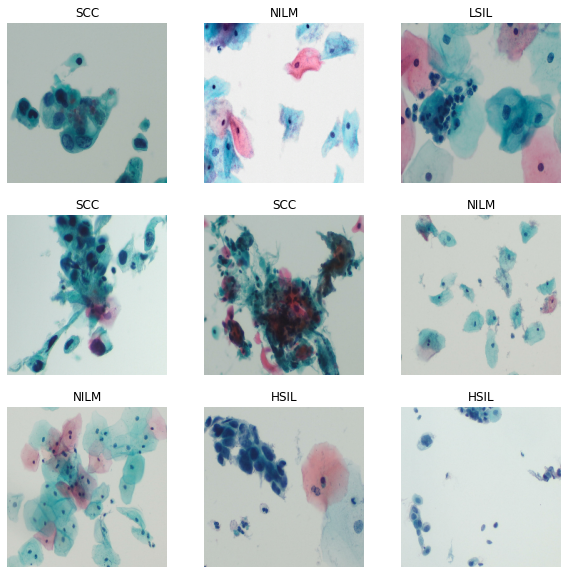

In [ ]:
# Plot Images from dataset
import matplotlib.pyplot as plt
clinicaldata_foldername = '/content/drive/MyDrive/Pap ML Project (Shared Drive)/NEW IMAGES (Taken With Dr. Joyce Ou Slides)/Manual Photos'

clinical_test = tf.keras.utils.image_dataset_from_directory(
    clinicaldata_foldername, labels='inferred', label_mode='int',
    class_names=None, color_mode='rgb', batch_size=68, image_size=img_size,
    shuffle=True, seed=92, interpolation='bilinear', follow_links=False,
    crop_to_aspect_ratio=False)
class_names = clinical_test.class_names

label_name = ['HSIL', 'LSIL', 'NILM', 'SCC']
plt.figure(figsize=(10, 10))
for images, labels in clinical_test.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        s = label_name[int(labels[i])]
        print(s)
        plt.title(s)
        plt.axis("off")

## Run Models

### Run testing on clinical samples

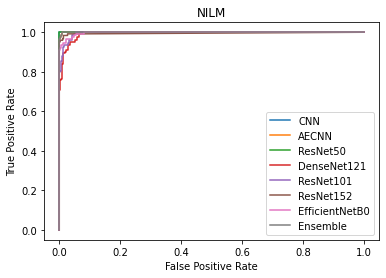

In [ ]:
import sklearn
labels = ['HSIL','LSIL', 'NILM', 'SCC']

pred_CNN = loadtxt('data_CNN.csv', delimiter=',')
pred_AECNN = loadtxt('data_AECNN.csv', delimiter=',')
pred_ResNet50 = loadtxt('data_ResNet50.csv', delimiter=',')
pred_DenseNet121 = loadtxt('data_DenseNet121.csv', delimiter=',')
pred_ResNet101 = loadtxt('data_ResNet101.csv', delimiter=',')
pred_ResNet152 = loadtxt('data_ResNet152.csv', delimiter=',')
pred_EfficientNetB0 = loadtxt('data_EfficientNetB0.csv', delimiter=',')
pred_Ensemble = loadtxt('data_Ensemble.csv', delimiter=',')

pos = 2
names = ['CNN', 'AECNN','ResNet50', 'DenseNet121', 'ResNet101', 'ResNet152', 'EfficientNetB0', 'Ensemble']
pred_ls = [pred_CNN,pred_AECNN,pred_ResNet50, pred_DenseNet121, pred_ResNet101, pred_ResNet152, pred_EfficientNetB0, pred_Ensemble]
ppp = [pred_AECNN]
for i, ls in enumerate(pred_ls):
  p = np.array([el[pos] for el in ls])
  fpr, tpr, thresholds = sklearn.metrics.roc_curve(np.array(test_labels), p, pos_label =pos)
  plt.plot(fpr,tpr, label = names[i])
  plt.legend()
  plt.title(labels[pos])
  plt.xlabel('False Positive Rate')
  plt.ylabel('True Positive Rate')
plt.show()

['HSIL', 'LSIL', 'NILM', 'SCC']
1/1 [==============================] - 1s 1s/step
label
pred
[[116   1   0   6]
 [  0 123   0   0]
 [  1   0 122   0]
 [ 12   0   0 111]]
{'HSIL': {'precision': 0.8992248062015504, 'recall': 0.943089430894309, 'f1-score': 0.9206349206349207, 'support': 123}, 'LSIL': {'precision': 0.9919354838709677, 'recall': 1.0, 'f1-score': 0.9959514170040485, 'support': 123}, 'NILM': {'precision': 1.0, 'recall': 0.991869918699187, 'f1-score': 0.9959183673469388, 'support': 123}, 'SCC': {'precision': 0.9487179487179487, 'recall': 0.9024390243902439, 'f1-score': 0.9249999999999999, 'support': 123}, 'accuracy': 0.959349593495935, 'macro avg': {'precision': 0.9599695596976168, 'recall': 0.959349593495935, 'f1-score': 0.959376176246477, 'support': 492}, 'weighted avg': {'precision': 0.9599695596976168, 'recall': 0.959349593495935, 'f1-score': 0.959376176246477, 'support': 492}}


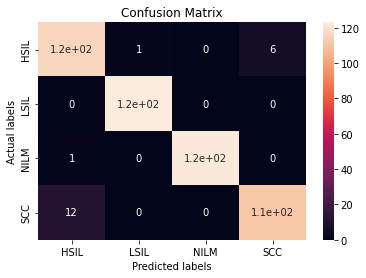

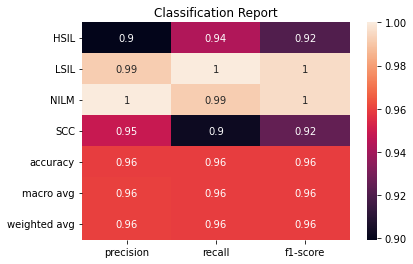

In [ ]:
####Get preds for AUC calculation
labels = ['HSIL','LSIL', 'NILM', 'SCC']
clinicaldata_foldername = '/content/drive/MyDrive/Pap ML Project (Shared Drive)/Clinical Slide Images/Final_clinical'
transfer_names = ['ResNet50', 'DenseNet121', 'ResNet101', 'ResNet152', 'EfficientNetB0']

model_foldername = '/content/drive/MyDrive/Pap ML Project (Shared Drive)/final_models/model_'

AE_filename = "/content/drive/MyDrive/Pap ML Project (Shared Drive)/final_models/AECNN_97_AE_augdata.h5"
AECNN_filename = "/content/drive/MyDrive/Pap ML Project (Shared Drive)/final_models/AECNN_97_CNN_augdata.h5"
CNN_filename = "/content/drive/MyDrive/Pap ML Project (Shared Drive)/final_models/bestCNN_augdata.h5"

model_name = model_foldername + transfer_names[4] +'.h5'
# model_name = CNN_filename
clinical_test = tf.keras.utils.image_dataset_from_directory(
    clinicaldata_foldername, labels='inferred', label_mode='int',
    class_names=None, color_mode='rgb', batch_size=24, image_size=img_size,
    shuffle=False, seed=42, interpolation='bilinear', follow_links=False,
    crop_to_aspect_ratio=False)
class_names = clinical_test.class_names
print(class_names)

AE = False
if AE: 
  test_img, test_label = extract_img(test)
  AE = load_model(AE_filename)
  AECNN =load_model(AECNN_filename)
  test_AE = AE.predict(test_img)
  test2 = [test_AE.reshape(-1, 56, 56, 3),test_label]
  pred = AECNN.predict(test2[0],verbose=1)
  test_pred=np.argmax(pred,axis=1)
  print(test_pred)
else:  
  saved_model = load_model(model_name)
  # test_pred_vote, test_labels, pred = ensemble(transfer_names, test, False)
  test_pred, test_labels, pred = getpredlabel(test, saved_model)

acc, cm, cr = PlotPerformance(test_labels, test_pred, labels)


(492, 224, 224, 3)
<class 'tensorflow.python.framework.ops.EagerTensor'>
(492, 224, 224, 3)
(492,)
(492,)
Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_14 (Conv2D)          (None, 224, 224, 64)      1792      
                                                                 
 max_pooling2d_14 (MaxPoolin  (None, 112, 112, 64)     0         
 g2D)                                                            
                                                                 
 conv2d_15 (Conv2D)          (None, 112, 112, 32)      18464     
                                                                 
 max_pooling2d_15 (MaxPoolin  (None, 56, 56, 32)       0         
 g2D)                                                            
                                                                 
 dense_14 (Dense)            (None, 56, 56, 3)         99        
             

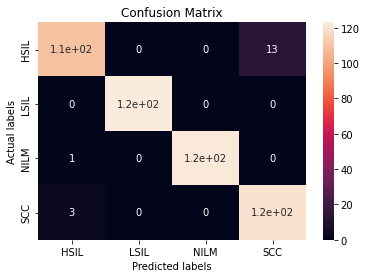

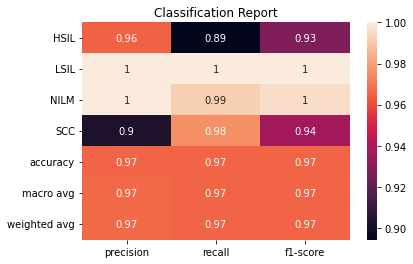

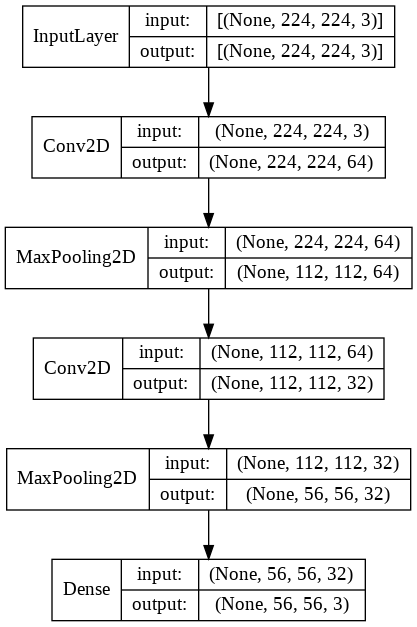

In [ ]:
f = '/content/drive/MyDrive/Pap ML Project (Shared Drive)/saved models/bestAECNN_97_augdata.h5'

labels = ['HSIL','LSIL', 'NILM', 'SCC']

f1 = '/content/drive/MyDrive/Pap ML Project (Shared Drive)/saved models AUG2/AECNN_97_AE_augdata.h5'
f2 = '/content/drive/MyDrive/Pap ML Project (Shared Drive)/saved models AUG2/AECNN_97_CNN_augdata.h5'

test_img, test_label = extract_img(test)
autoencoder.encoder = load_model(f1)
autoencoder.encoder.summary()

test_AE = autoencoder.encoder.predict(test_img)
test2 = [test_AE.reshape(-1, 56, 56, 3),test_label]

saved_model = load_model(f2)
pred = saved_model.predict(test2[0],verbose=1)
test_pred=np.argmax(pred,axis=1)

acc, cm = PlotPerformance(test_label, test_pred, labels)
plot_model(autoencoder.encoder, to_file='model_plot.png', show_shapes=True, show_layer_names=False)
# plot_model(saved_model, to_file='model_plot.png', show_shapes=True, show_layer_names=False)

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb0 (Functional)  (None, 1280)             4049571   
                                                                 
 dense_2 (Dense)             (None, 4)                 5124      
                                                                 
Total params: 4,054,695
Trainable params: 5,124
Non-trainable params: 4,049,571
_________________________________________________________________
1/1 [==============================] - 2s 2s/step
[[ 68  22   2  31]
 [  0 120   0   3]
 [  1   5 111   6]
 [  0  10   3 110]]
{'HSIL': {'precision': 0.9855072463768116, 'recall': 0.5528455284552846, 'f1-score': 0.7083333333333334, 'support': 123}, 'LSIL': {'precision': 0.7643312101910829, 'recall': 0.975609756097561, 'f1-score': 0.8571428571428571, 'support': 123}, 'NILM': {'precision': 0.9568965517241379, 'recall': 0.9024390243902

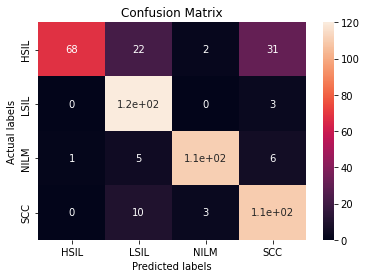

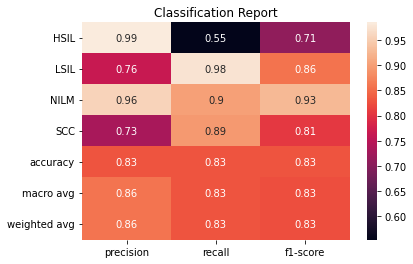

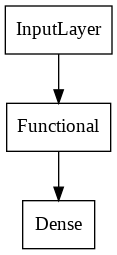

In [ ]:
labels = ['HSIL','LSIL', 'NILM', 'SCC']
filename = '/content/drive/MyDrive/Pap ML Project (Shared Drive)/saved models AUG2/model_EfficientNetB0.h5'
model_filename = '/content/drive/MyDrive/Pap ML Project (Shared Drive)/saved models/bestCNN_augdata.h5'
saved_model = load_model(filename)
saved_model.summary()
test_pred, test_labels = getpredlabel(test, saved_model)
acc, cm = PlotPerformance(test_labels, test_pred, labels)

plot_model(saved_model, to_file='model_plot.png', show_shapes=False, show_layer_names=False)

Found 32 files belonging to 4 classes.
['HSIL_OG', 'LSIL_OG', 'NILM', 'SCC_OG']
1/1 [==============================] - 2s 2s/step
[[ 6  0  0  0]
 [ 0  6  0  0]
 [ 2  0 12  0]
 [ 0  0  0  6]]
{'HSIL_OG': {'precision': 0.75, 'recall': 1.0, 'f1-score': 0.8571428571428571, 'support': 6}, 'LSIL_OG': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 6}, 'NILM': {'precision': 1.0, 'recall': 0.8571428571428571, 'f1-score': 0.923076923076923, 'support': 14}, 'SCC_OG': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 6}, 'accuracy': 0.9375, 'macro avg': {'precision': 0.9375, 'recall': 0.9642857142857143, 'f1-score': 0.945054945054945, 'support': 32}, 'weighted avg': {'precision': 0.953125, 'recall': 0.9375, 'f1-score': 0.9395604395604396, 'support': 32}}


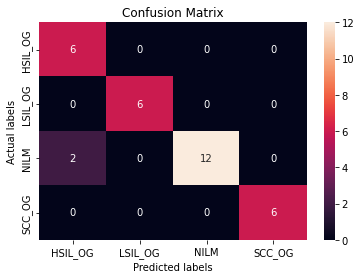

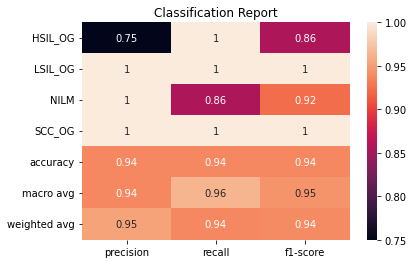

In [ ]:
from keras.preprocessing.image import img_to_array
filename = '/content/drive/MyDrive/Pap ML Project (Shared Drive)/saved models AUG2/model_ResNet50.h5'
nilm1 = '/content/drive/MyDrive/Pap ML Project (Shared Drive)/Clinical Slide Images/01 27 2022 - Sample 1 - NILM/Segmented Images'

model_filename = '/content/drive/MyDrive/Pap ML Project (Shared Drive)/saved models/bestCNN_augdata.h5'
clinicaldata_foldername = '/content/drive/MyDrive/Pap ML Project (Shared Drive)/Clinical Slide Images/01 19 2022 - Sample 1 - NILM/Segmentation Attempts/zoomed'
nilm_img = '/content/drive/MyDrive/Pap ML Project (Shared Drive)/Clinical Slide Images/01 19 2022 - Sample 1 - NILM/Segmentation Attempts/zoomed/NILM/NILM Slide3 Segment1.jpeg'
scc_img = '/content/drive/MyDrive/Pap ML Project (Shared Drive)/Clinical Slide Images/01 19 2022 - Sample 1 - NILM/Segmentation Attempts/zoomed/SCC/SCC_4 (11).jpg'
labels = ['HSIL','LSIL', 'NILM', 'SCC']
lab = ['HSIL_OG', 'LSIL_OG', 'NILM', 'SCC_OG']
fn = '/content/drive/MyDrive/Pap ML Project (Shared Drive)/Clinical Slide Images/01 19 2022 - Sample 1 - NILM/Segmentation Attempts/zoomed/Copy of NL_42_ (14).jpg'

saved_model = load_model(filename)


clinical_test = tf.keras.utils.image_dataset_from_directory(
    nilm1, labels='inferred', label_mode='int',
    class_names=None, color_mode='rgb', batch_size=32, image_size=img_size,
    shuffle=False, seed=42, interpolation='bilinear', follow_links=False,
    crop_to_aspect_ratio=False)
class_names2 = clinical_test.class_names
print(class_names2)

test_pred, test_labels = getpredlabel(clinical_test, saved_model)
acc, cm = PlotPerformance(test_labels, test_pred, lab)


### Run Basic CNN

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_1 (Rescaling)     (None, 224, 224, 3)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 112, 112, 16)      448       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 56, 56, 16)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 28, 28, 32)        4640      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 14, 14, 32)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 7, 7, 64)         

Reusing TensorBoard on port 6006 (pid 995), started 0:02:06 ago. (Use '!kill 995' to kill it.)

<IPython.core.display.Javascript object>

runtime: 18.55899691581726


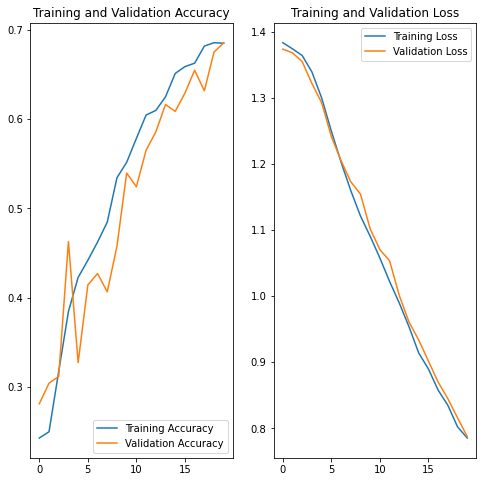

1/1 [==============================] - 0s 127ms/step


ValueError: ignored

In [ ]:
# testing basic CNN  method
 
acc_ls = [0.9308943089430894]
accc = []
epoch = 20
import numpy as np
np.random.seed(42)
labels = ['HSIL','LSIL', 'NILM', 'SCC']

# for i in range(5):
# print("iteration: " +str(i))
start = time.time()
historyCnn, modelCnn = basicCNN(train, epoch, val, False)
end = time.time()
print("runtime: {}".format(end-start))
plot_AccVal(historyCnn, epoch, True)

test_pred, test_labels = getpredlabel(test, modelCnn)
acc, cm = PlotPerformance(test_labels, test_pred, labels)
accc.append(acc)
  # if acc > max(acc_ls):
  #   filename = '/content/drive/MyDrive/Pap ML Project (Shared Drive)/saved models2/bestCNN_augdata.h5'
  #   modelCnn.save(filename) 
print(accc)

1/1 [==============================] - 0s 137ms/step
[[ 98   0   0  25]
 [  0 123   0   0]
 [  0   0 123   0]
 [  5   0   0 118]]
{'HSIL': {'precision': 0.9514563106796117, 'recall': 0.7967479674796748, 'f1-score': 0.8672566371681416, 'support': 123}, 'LSIL': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 123}, 'NILM': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 123}, 'SCC': {'precision': 0.8251748251748252, 'recall': 0.959349593495935, 'f1-score': 0.8872180451127821, 'support': 123}, 'accuracy': 0.9390243902439024, 'macro avg': {'precision': 0.9441577839636093, 'recall': 0.9390243902439025, 'f1-score': 0.938618670570231, 'support': 492}, 'weighted avg': {'precision': 0.9441577839636093, 'recall': 0.9390243902439024, 'f1-score': 0.9386186705702309, 'support': 492}}


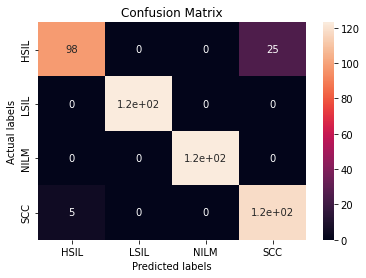

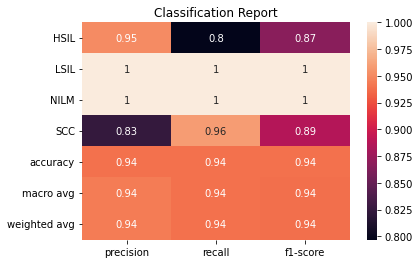

In [ ]:
# Show best CNN
filename = '/content/drive/MyDrive/Pap ML Project (Shared Drive)/saved models/bestCNN_augdata.h5'
saved_model = load_model(filename)
test_pred, test_labels = getpredlabel(test, saved_model)
acc = PlotPerformance(test_labels, test_pred, labels)

here
there


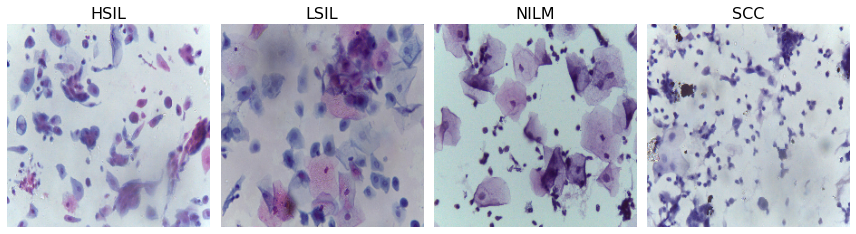

GradCam++


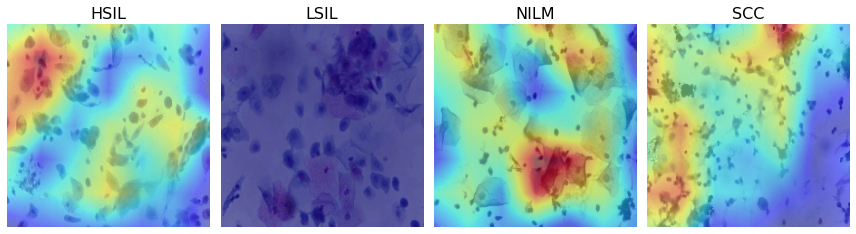

Saliency
ScoreCam


In [ ]:
#Run Saliency Maps
fn_HSIL = directory+'/High squamous intra-epithelial lesion/HSIL_7 (11).jpg'
fn_LSIL = directory+'/Low squamous intra-epithelial lesion/LSIL_0_953.jpg'
fn_NILM = directory+'/Negative for Intraepithelial malignancy/NL_40_ (15).jpg'
fn_SCC = directory+'/Squamous cell carcinoma/SCC_3 (5).jpg'
model_name  = ['ResNet50', 'DenseNet121', 'ResNet101', 'ResNet152', 'EfficientNetB0']

filename = '/content/drive/MyDrive/Pap ML Project (Shared Drive)/saved models AUG2/model_' + model_name[3] + '.h5'

filename = '/content/drive/MyDrive/Pap ML Project (Shared Drive)/saved models/bestCNN_augdata.h5'
saved_model = load_model(filename)


X, image_titles, images = preprocess_saliency(fn_HSIL, fn_LSIL, fn_NILM, fn_SCC)
print("GradCam++")
run_gradcamplusplus(saved_model, X, image_titles, images)
print("Saliency")
run_saliency(saved_model, X, image_titles)
print("ScoreCam")
run_scorecam(saved_model, X, image_titles, images)


     |████████████████████████████████| 795 kB 13.1 MB/s 


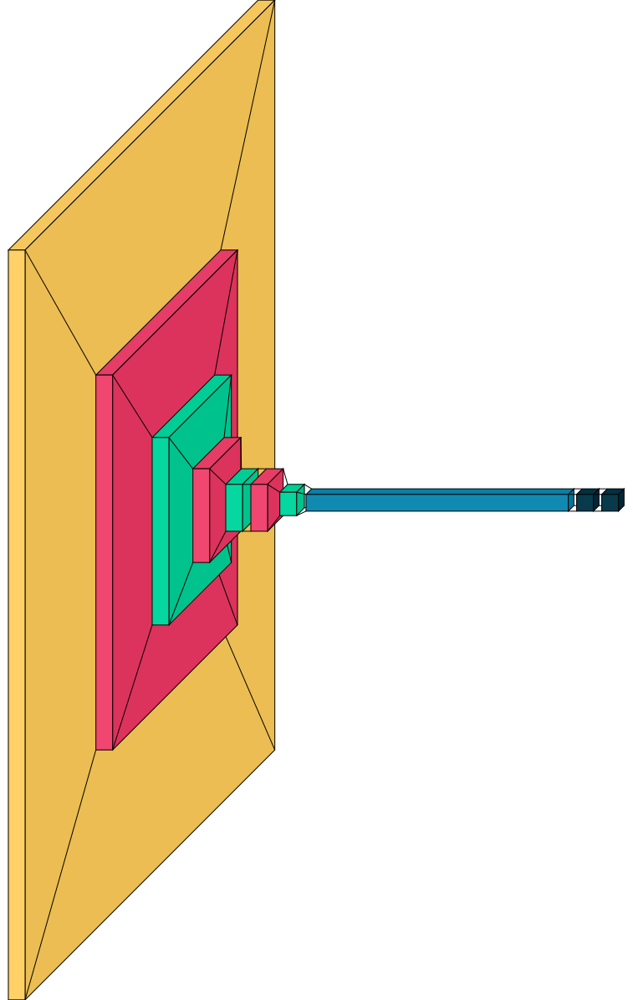

In [ ]:
loc = "/content/drive/MyDrive/Pap ML Project (Shared Drive)/cnnmodelimg.png"
# plot_model(modelCnn, to_file=loc, show_shapes=False, show_layer_names=False)
visualkeras.layered_view(modelCnn).show() # display using your system viewer
# visualkeras.layered_view(modelCnn, to_file=loc) # write to disk
# visualkeras.layered_view(modelCnn, to_file=loc).show() # write and show

visualkeras.layered_view(modelCnn)

### Run Transfer Learning

1
DenseNet169
51888128/51877672 [==============================] - 1s 0us/step
Epoch 1/25
98/98 [==============================] - 539s 1s/step - loss: 1.4141 - accuracy: 0.2596 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 2/25
98/98 [==============================] - 8s 78ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 3/25
98/98 [==============================] - 8s 79ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 4/25
98/98 [==============================] - 8s 79ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 5/25
98/98 [==============================] - 8s 79ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 6/25
98/98 [==============================] - 8s 79ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 7/25
98/98 [==============================] - 8s 80ms/step - loss: 1.

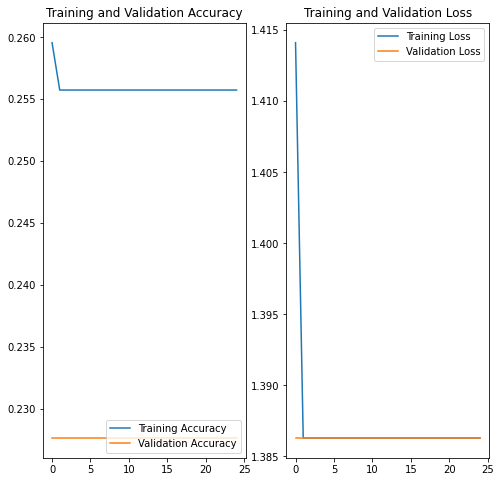

1/1 [==============================] - 10s 10s/step
[[123   0   0   0]
 [123   0   0   0]
 [123   0   0   0]
 [123   0   0   0]]
{'HSIL': {'precision': 0.25, 'recall': 1.0, 'f1-score': 0.4, 'support': 123}, 'LSIL': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'NIM': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'SCC': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'accuracy': 0.25, 'macro avg': {'precision': 0.0625, 'recall': 0.25, 'f1-score': 0.1, 'support': 492}, 'weighted avg': {'precision': 0.0625, 'recall': 0.25, 'f1-score': 0.1, 'support': 492}}


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

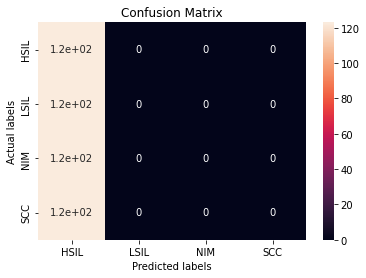

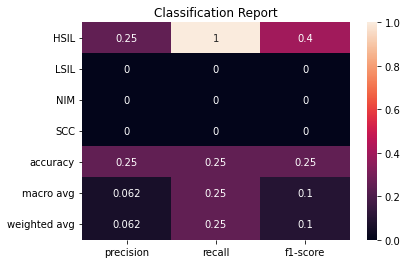

2
DenseNet201
74850304/74836368 [==============================] - 4s 0us/step
Epoch 1/25
98/98 [==============================] - 22s 134ms/step - loss: 1.2003 - accuracy: 0.4821 - val_loss: 0.9360 - val_accuracy: 0.5627
Epoch 2/25
98/98 [==============================] - 10s 102ms/step - loss: 0.9800 - accuracy: 0.5491 - val_loss: 0.8928 - val_accuracy: 0.6010
Epoch 3/25
98/98 [==============================] - 10s 103ms/step - loss: 0.9312 - accuracy: 0.5714 - val_loss: 0.8852 - val_accuracy: 0.6394
Epoch 4/25
98/98 [==============================] - 10s 103ms/step - loss: 0.9109 - accuracy: 0.5867 - val_loss: 0.8425 - val_accuracy: 0.6189
Epoch 5/25
98/98 [==============================] - 10s 103ms/step - loss: 0.8938 - accuracy: 0.6001 - val_loss: 0.8412 - val_accuracy: 0.6496
Epoch 6/25
98/98 [==============================] - 10s 103ms/step - loss: 0.8766 - accuracy: 0.6084 - val_loss: 0.8178 - val_accuracy: 0.6317
Epoch 7/25
98/98 [==============================] - 10s 104ms/s

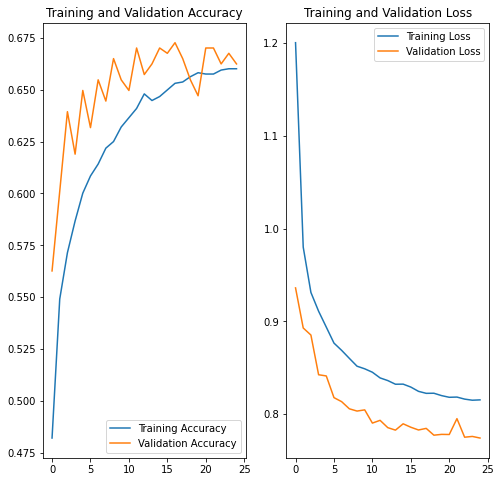

1/1 [==============================] - 14s 14s/step
[[105   0   8  10]
 [120   0   3   0]
 [  0   0 123   0]
 [ 37   0   0  86]]
{'HSIL': {'precision': 0.40076335877862596, 'recall': 0.8536585365853658, 'f1-score': 0.5454545454545454, 'support': 123}, 'LSIL': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'NIM': {'precision': 0.917910447761194, 'recall': 1.0, 'f1-score': 0.9571984435797666, 'support': 123}, 'SCC': {'precision': 0.8958333333333334, 'recall': 0.6991869918699187, 'f1-score': 0.7853881278538812, 'support': 123}, 'accuracy': 0.6382113821138211, 'macro avg': {'precision': 0.5536267849682883, 'recall': 0.6382113821138211, 'f1-score': 0.5720102792220483, 'support': 492}, 'weighted avg': {'precision': 0.5536267849682883, 'recall': 0.6382113821138211, 'f1-score': 0.5720102792220483, 'support': 492}}


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

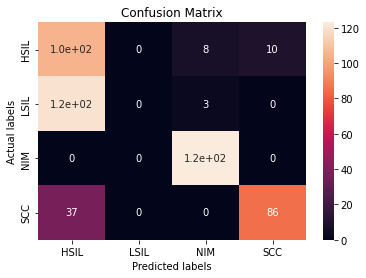

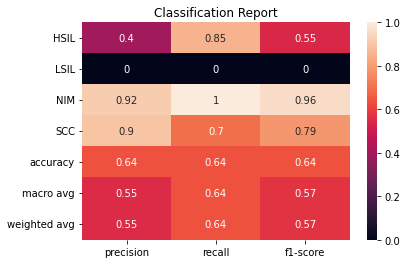

3
EfficientNetB0
16719872/16705208 [==============================] - 0s 0us/step
Epoch 1/25
98/98 [==============================] - 10s 56ms/step - loss: 0.9066 - accuracy: 0.6390 - val_loss: 0.6653 - val_accuracy: 0.7417
Epoch 2/25
98/98 [==============================] - 4s 41ms/step - loss: 0.6834 - accuracy: 0.7449 - val_loss: 0.5916 - val_accuracy: 0.7749
Epoch 3/25
98/98 [==============================] - 4s 42ms/step - loss: 0.6311 - accuracy: 0.7685 - val_loss: 0.5590 - val_accuracy: 0.7801
Epoch 4/25
98/98 [==============================] - 4s 42ms/step - loss: 0.3686 - accuracy: 0.8610 - val_loss: 0.2669 - val_accuracy: 0.8772
Epoch 5/25
98/98 [==============================] - 4s 42ms/step - loss: 0.2612 - accuracy: 0.8897 - val_loss: 0.2323 - val_accuracy: 0.8900
Epoch 6/25
98/98 [==============================] - 4s 42ms/step - loss: 0.2377 - accuracy: 0.9005 - val_loss: 0.2167 - val_accuracy: 0.8926
Epoch 7/25
98/98 [==============================] - 4s 42ms/step - loss

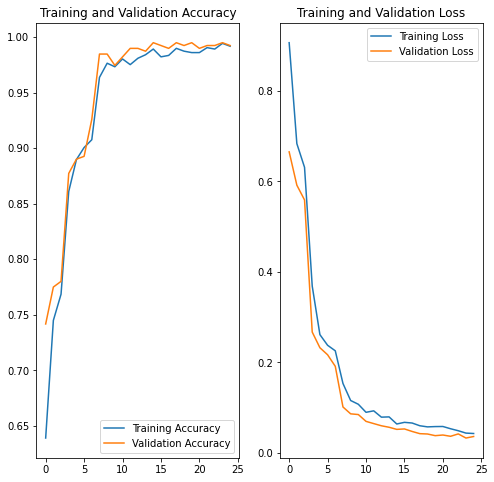

1/1 [==============================] - 1s 1s/step
[[116   1   0   6]
 [  0 123   0   0]
 [  1   0 122   0]
 [ 12   0   0 111]]
{'HSIL': {'precision': 0.8992248062015504, 'recall': 0.943089430894309, 'f1-score': 0.9206349206349207, 'support': 123}, 'LSIL': {'precision': 0.9919354838709677, 'recall': 1.0, 'f1-score': 0.9959514170040485, 'support': 123}, 'NIM': {'precision': 1.0, 'recall': 0.991869918699187, 'f1-score': 0.9959183673469388, 'support': 123}, 'SCC': {'precision': 0.9487179487179487, 'recall': 0.9024390243902439, 'f1-score': 0.9249999999999999, 'support': 123}, 'accuracy': 0.959349593495935, 'macro avg': {'precision': 0.9599695596976168, 'recall': 0.959349593495935, 'f1-score': 0.959376176246477, 'support': 492}, 'weighted avg': {'precision': 0.9599695596976168, 'recall': 0.959349593495935, 'f1-score': 0.959376176246477, 'support': 492}}


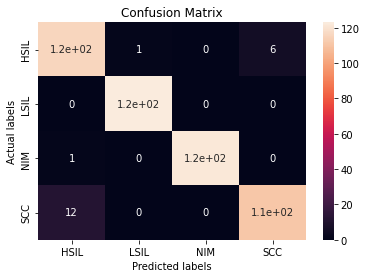

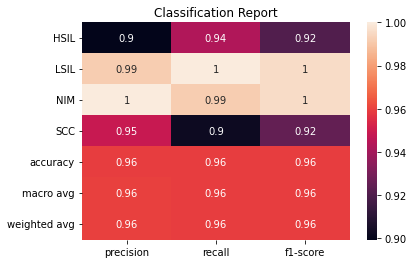

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


4
EfficientNetB1
27033600/27018416 [==============================] - 0s 0us/step
Epoch 1/25
98/98 [==============================] - 14s 74ms/step - loss: 0.7534 - accuracy: 0.7060 - val_loss: 0.4298 - val_accuracy: 0.8670
Epoch 2/25
98/98 [==============================] - 6s 56ms/step - loss: 0.3844 - accuracy: 0.8909 - val_loss: 0.2930 - val_accuracy: 0.9309
Epoch 3/25
98/98 [==============================] - 6s 57ms/step - loss: 0.2819 - accuracy: 0.9222 - val_loss: 0.2180 - val_accuracy: 0.9412
Epoch 4/25
98/98 [==============================] - 6s 57ms/step - loss: 0.2411 - accuracy: 0.9330 - val_loss: 0.1871 - val_accuracy: 0.9565
Epoch 5/25
98/98 [==============================] - 6s 57ms/step - loss: 0.1962 - accuracy: 0.9490 - val_loss: 0.1496 - val_accuracy: 0.9642
Epoch 6/25
98/98 [==============================] - 6s 57ms/step - loss: 0.1713 - accuracy: 0.9560 - val_loss: 0.1327 - val_accuracy: 0.9719
Epoch 7/25
98/98 [==============================] - 6s 57ms/step - loss

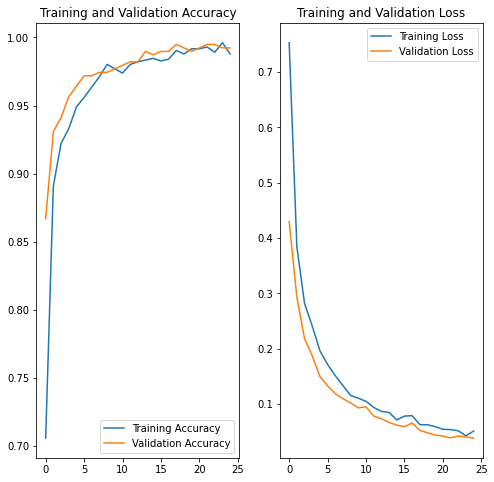

1/1 [==============================] - 4s 4s/step
[[113   6   2   2]
 [  3 118   0   2]
 [  1   0 122   0]
 [ 12   0   0 111]]
{'HSIL': {'precision': 0.875968992248062, 'recall': 0.9186991869918699, 'f1-score': 0.8968253968253969, 'support': 123}, 'LSIL': {'precision': 0.9516129032258065, 'recall': 0.959349593495935, 'f1-score': 0.9554655870445343, 'support': 123}, 'NIM': {'precision': 0.9838709677419355, 'recall': 0.991869918699187, 'f1-score': 0.9878542510121457, 'support': 123}, 'SCC': {'precision': 0.9652173913043478, 'recall': 0.9024390243902439, 'f1-score': 0.9327731092436974, 'support': 123}, 'accuracy': 0.943089430894309, 'macro avg': {'precision': 0.944167563630038, 'recall': 0.9430894308943089, 'f1-score': 0.9432295860314436, 'support': 492}, 'weighted avg': {'precision': 0.944167563630038, 'recall': 0.943089430894309, 'f1-score': 0.9432295860314436, 'support': 492}}


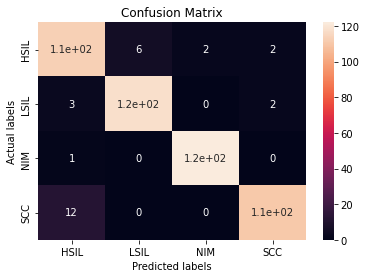

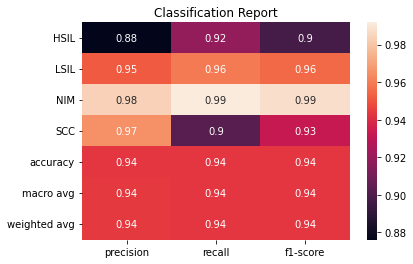

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


5
EfficientNetB2
31801344/31790344 [==============================] - 1s 0us/step
Epoch 1/25
98/98 [==============================] - 15s 79ms/step - loss: 0.7471 - accuracy: 0.7060 - val_loss: 0.3918 - val_accuracy: 0.8926
Epoch 2/25
98/98 [==============================] - 6s 59ms/step - loss: 0.3558 - accuracy: 0.9037 - val_loss: 0.2491 - val_accuracy: 0.9412
Epoch 3/25
98/98 [==============================] - 6s 60ms/step - loss: 0.2598 - accuracy: 0.9311 - val_loss: 0.1771 - val_accuracy: 0.9668
Epoch 4/25
98/98 [==============================] - 6s 61ms/step - loss: 0.2029 - accuracy: 0.9503 - val_loss: 0.1575 - val_accuracy: 0.9642
Epoch 5/25
98/98 [==============================] - 6s 60ms/step - loss: 0.1728 - accuracy: 0.9509 - val_loss: 0.1259 - val_accuracy: 0.9719
Epoch 6/25
98/98 [==============================] - 6s 60ms/step - loss: 0.1510 - accuracy: 0.9617 - val_loss: 0.1117 - val_accuracy: 0.9719
Epoch 7/25
98/98 [==============================] - 6s 59ms/step - loss

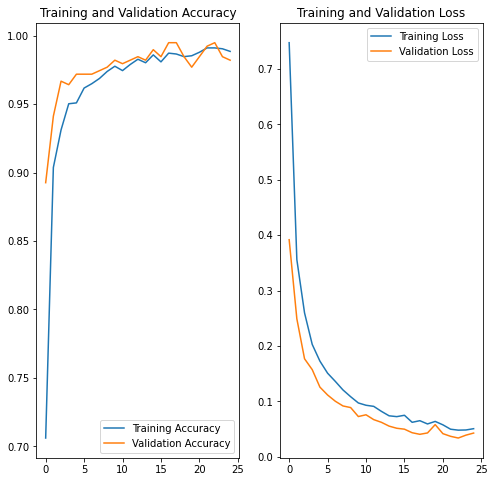

1/1 [==============================] - 2s 2s/step
[[120   3   0   0]
 [  0 123   0   0]
 [  0   1 122   0]
 [ 15   0   0 108]]
{'HSIL': {'precision': 0.8888888888888888, 'recall': 0.975609756097561, 'f1-score': 0.9302325581395349, 'support': 123}, 'LSIL': {'precision': 0.968503937007874, 'recall': 1.0, 'f1-score': 0.9839999999999999, 'support': 123}, 'NIM': {'precision': 1.0, 'recall': 0.991869918699187, 'f1-score': 0.9959183673469388, 'support': 123}, 'SCC': {'precision': 1.0, 'recall': 0.8780487804878049, 'f1-score': 0.9350649350649352, 'support': 123}, 'accuracy': 0.9613821138211383, 'macro avg': {'precision': 0.9643482064741907, 'recall': 0.9613821138211381, 'f1-score': 0.9613039651378521, 'support': 492}, 'weighted avg': {'precision': 0.9643482064741907, 'recall': 0.9613821138211383, 'f1-score': 0.9613039651378522, 'support': 492}}


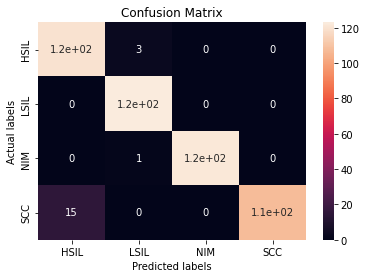

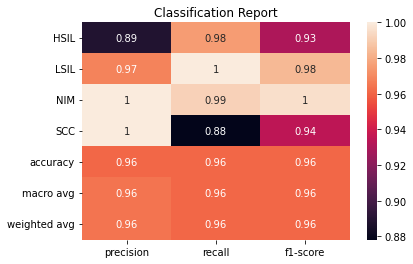

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


6
EfficientNetB3
43950080/43941136 [==============================] - 2s 0us/step
Epoch 1/25
98/98 [==============================] - 19s 102ms/step - loss: 0.7338 - accuracy: 0.7341 - val_loss: 0.3801 - val_accuracy: 0.8824
Epoch 2/25
98/98 [==============================] - 8s 79ms/step - loss: 0.3471 - accuracy: 0.9088 - val_loss: 0.2337 - val_accuracy: 0.9361
Epoch 3/25
98/98 [==============================] - 8s 79ms/step - loss: 0.2534 - accuracy: 0.9311 - val_loss: 0.1831 - val_accuracy: 0.9463
Epoch 4/25
98/98 [==============================] - 8s 80ms/step - loss: 0.2033 - accuracy: 0.9522 - val_loss: 0.1473 - val_accuracy: 0.9642
Epoch 5/25
98/98 [==============================] - 8s 79ms/step - loss: 0.1663 - accuracy: 0.9592 - val_loss: 0.1273 - val_accuracy: 0.9668
Epoch 6/25
98/98 [==============================] - 8s 78ms/step - loss: 0.1484 - accuracy: 0.9675 - val_loss: 0.1129 - val_accuracy: 0.9719
Epoch 7/25
98/98 [==============================] - 8s 78ms/step - los

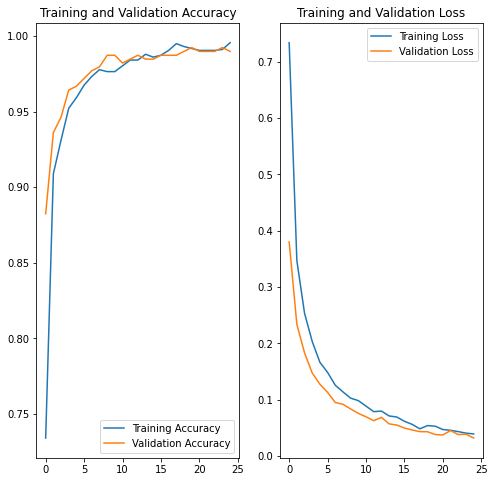

1/1 [==============================] - 2s 2s/step
[[119   1   0   3]
 [  0 122   0   1]
 [  1   0 122   0]
 [ 14   0   0 109]]
{'HSIL': {'precision': 0.8880597014925373, 'recall': 0.967479674796748, 'f1-score': 0.9260700389105059, 'support': 123}, 'LSIL': {'precision': 0.991869918699187, 'recall': 0.991869918699187, 'f1-score': 0.991869918699187, 'support': 123}, 'NIM': {'precision': 1.0, 'recall': 0.991869918699187, 'f1-score': 0.9959183673469388, 'support': 123}, 'SCC': {'precision': 0.9646017699115044, 'recall': 0.8861788617886179, 'f1-score': 0.9237288135593221, 'support': 123}, 'accuracy': 0.959349593495935, 'macro avg': {'precision': 0.9611328475258072, 'recall': 0.959349593495935, 'f1-score': 0.9593967846289885, 'support': 492}, 'weighted avg': {'precision': 0.9611328475258071, 'recall': 0.959349593495935, 'f1-score': 0.9593967846289885, 'support': 492}}


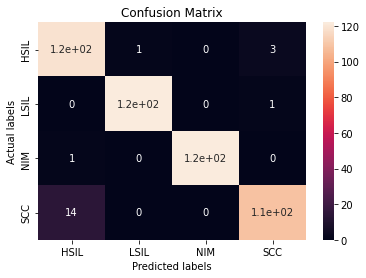

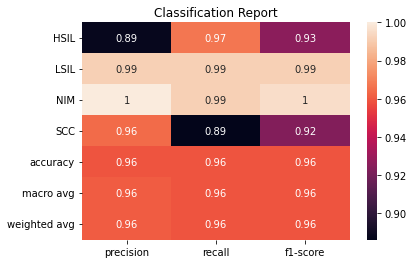

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


7
EfficientNetB4
71696384/71686520 [==============================] - 1s 0us/step
Epoch 1/25
98/98 [==============================] - 23s 130ms/step - loss: 1.3062 - accuracy: 0.2985 - val_loss: 1.2279 - val_accuracy: 0.3197
Epoch 2/25
98/98 [==============================] - 10s 103ms/step - loss: 1.2496 - accuracy: 0.3463 - val_loss: 1.1953 - val_accuracy: 0.3453
Epoch 3/25
98/98 [==============================] - 10s 104ms/step - loss: 1.2236 - accuracy: 0.3642 - val_loss: 1.1311 - val_accuracy: 0.4322
Epoch 4/25
98/98 [==============================] - 10s 103ms/step - loss: 1.1798 - accuracy: 0.3941 - val_loss: 1.1092 - val_accuracy: 0.4578
Epoch 5/25
98/98 [==============================] - 10s 102ms/step - loss: 1.1575 - accuracy: 0.4082 - val_loss: 1.0973 - val_accuracy: 0.4655
Epoch 6/25
98/98 [==============================] - 10s 101ms/step - loss: 1.1473 - accuracy: 0.4152 - val_loss: 1.0833 - val_accuracy: 0.4450
Epoch 7/25
98/98 [==============================] - 10s 101m

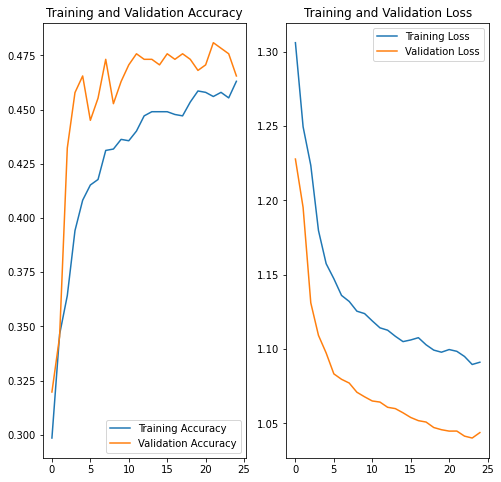

1/1 [==============================] - 10s 10s/step
[[ 94   0   0  29]
 [103   0   0  20]
 [119   0   0   4]
 [ 12   0   0 111]]
{'HSIL': {'precision': 0.2865853658536585, 'recall': 0.7642276422764228, 'f1-score': 0.41685144124168516, 'support': 123}, 'LSIL': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'NIM': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'SCC': {'precision': 0.676829268292683, 'recall': 0.9024390243902439, 'f1-score': 0.7735191637630662, 'support': 123}, 'accuracy': 0.4166666666666667, 'macro avg': {'precision': 0.24085365853658536, 'recall': 0.4166666666666667, 'f1-score': 0.29759265125118783, 'support': 492}, 'weighted avg': {'precision': 0.24085365853658536, 'recall': 0.4166666666666667, 'f1-score': 0.29759265125118783, 'support': 492}}


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

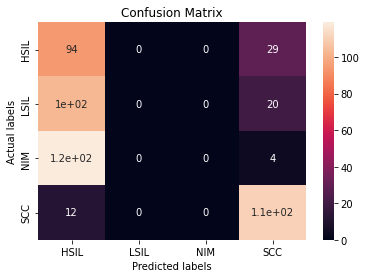

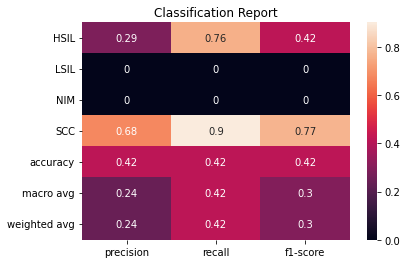

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


8
EfficientNetB5
115277824/115263384 [==============================] - 3s 0us/step
Epoch 1/25
98/98 [==============================] - 29s 173ms/step - loss: 1.2157 - accuracy: 0.4337 - val_loss: 1.1668 - val_accuracy: 0.3913
Epoch 2/25
98/98 [==============================] - 14s 142ms/step - loss: 1.1324 - accuracy: 0.4579 - val_loss: 1.1362 - val_accuracy: 0.4246
Epoch 3/25
98/98 [==============================] - 14s 142ms/step - loss: 1.1069 - accuracy: 0.4700 - val_loss: 1.1236 - val_accuracy: 0.4476
Epoch 4/25
98/98 [==============================] - 14s 140ms/step - loss: 1.0967 - accuracy: 0.4726 - val_loss: 1.1099 - val_accuracy: 0.4476
Epoch 5/25
98/98 [==============================] - 14s 140ms/step - loss: 1.0852 - accuracy: 0.4809 - val_loss: 1.1074 - val_accuracy: 0.4527
Epoch 6/25
98/98 [==============================] - 14s 140ms/step - loss: 1.0775 - accuracy: 0.4815 - val_loss: 1.1002 - val_accuracy: 0.4425
Epoch 7/25
98/98 [==============================] - 14s 14

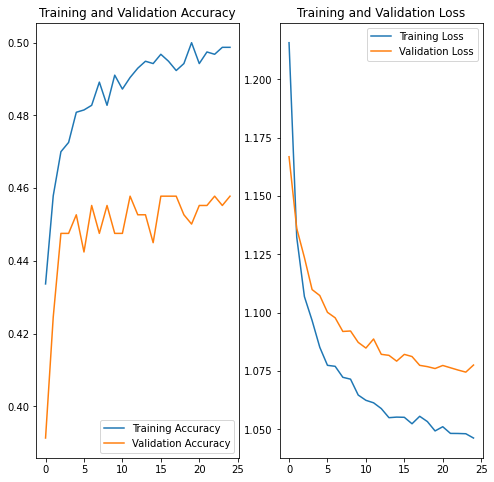

1/1 [==============================] - 12s 12s/step
[[111  12   0   0]
 [  0 123   0   0]
 [122   1   0   0]
 [113  10   0   0]]
{'HSIL': {'precision': 0.3208092485549133, 'recall': 0.9024390243902439, 'f1-score': 0.47334754797441364, 'support': 123}, 'LSIL': {'precision': 0.8424657534246576, 'recall': 1.0, 'f1-score': 0.9144981412639406, 'support': 123}, 'NIM': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'SCC': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'accuracy': 0.47560975609756095, 'macro avg': {'precision': 0.2908187504948927, 'recall': 0.47560975609756095, 'f1-score': 0.34696142230958854, 'support': 492}, 'weighted avg': {'precision': 0.2908187504948927, 'recall': 0.47560975609756095, 'f1-score': 0.34696142230958854, 'support': 492}}


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

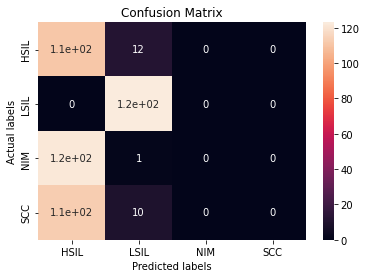

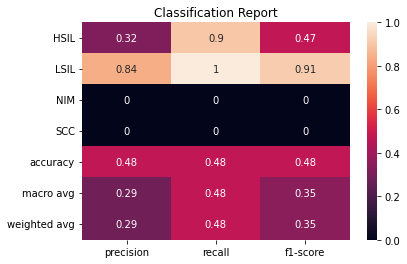

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


9
EfficientNetB6
165249024/165234480 [==============================] - 6s 0us/step
Epoch 1/25
98/98 [==============================] - 36s 223ms/step - loss: 0.9904 - accuracy: 0.5517 - val_loss: 0.7822 - val_accuracy: 0.6419
Epoch 2/25
98/98 [==============================] - 18s 187ms/step - loss: 0.7639 - accuracy: 0.6397 - val_loss: 0.6851 - val_accuracy: 0.7008
Epoch 3/25
98/98 [==============================] - 18s 184ms/step - loss: 0.6781 - accuracy: 0.6741 - val_loss: 0.5916 - val_accuracy: 0.7212
Epoch 4/25
98/98 [==============================] - 18s 183ms/step - loss: 0.6206 - accuracy: 0.6939 - val_loss: 0.5516 - val_accuracy: 0.7263
Epoch 5/25
98/98 [==============================] - 18s 183ms/step - loss: 0.5858 - accuracy: 0.6958 - val_loss: 0.5255 - val_accuracy: 0.7289
Epoch 6/25
98/98 [==============================] - 18s 187ms/step - loss: 0.5616 - accuracy: 0.7098 - val_loss: 0.5051 - val_accuracy: 0.7340
Epoch 7/25
98/98 [==============================] - 18s 18

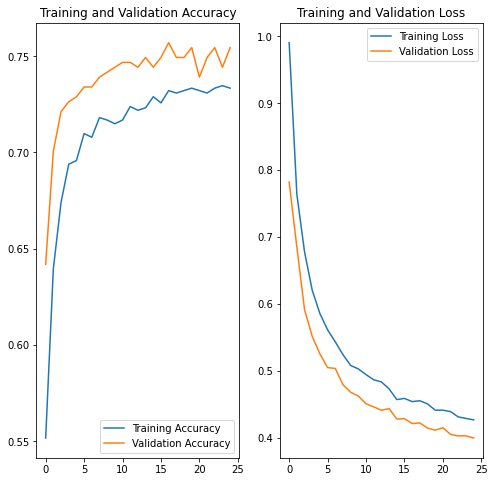

1/1 [==============================] - 17s 17s/step
[[110   0   4   9]
 [110   0   3  10]
 [  2   0 120   1]
 [ 26   0   0  97]]
{'HSIL': {'precision': 0.4435483870967742, 'recall': 0.8943089430894309, 'f1-score': 0.5929919137466307, 'support': 123}, 'LSIL': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'NIM': {'precision': 0.9448818897637795, 'recall': 0.975609756097561, 'f1-score': 0.96, 'support': 123}, 'SCC': {'precision': 0.8290598290598291, 'recall': 0.7886178861788617, 'f1-score': 0.8083333333333333, 'support': 123}, 'accuracy': 0.6646341463414634, 'macro avg': {'precision': 0.5543725264800957, 'recall': 0.6646341463414633, 'f1-score': 0.5903313117699911, 'support': 492}, 'weighted avg': {'precision': 0.5543725264800957, 'recall': 0.6646341463414634, 'f1-score': 0.5903313117699911, 'support': 492}}


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

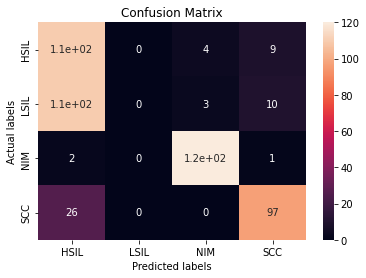

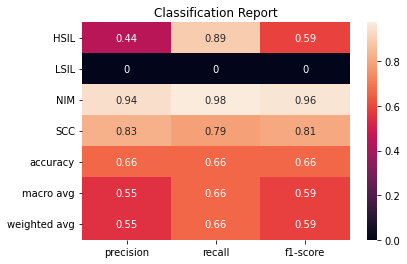

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


10
EfficientNetB7
258088960/258076736 [==============================] - 2s 0us/step
Epoch 1/25
98/98 [==============================] - 46s 294ms/step - loss: 0.7382 - accuracy: 0.7474 - val_loss: 0.3918 - val_accuracy: 0.9054
Epoch 2/25
98/98 [==============================] - 24s 249ms/step - loss: 0.3693 - accuracy: 0.8967 - val_loss: 0.2832 - val_accuracy: 0.9233
Epoch 3/25
98/98 [==============================] - 24s 247ms/step - loss: 0.2883 - accuracy: 0.9152 - val_loss: 0.2058 - val_accuracy: 0.9565
Epoch 4/25
98/98 [==============================] - 24s 247ms/step - loss: 0.2400 - accuracy: 0.9375 - val_loss: 0.1766 - val_accuracy: 0.9463
Epoch 5/25
98/98 [==============================] - 24s 248ms/step - loss: 0.2083 - accuracy: 0.9407 - val_loss: 0.1470 - val_accuracy: 0.9668
Epoch 6/25
98/98 [==============================] - 24s 247ms/step - loss: 0.1720 - accuracy: 0.9573 - val_loss: 0.1275 - val_accuracy: 0.9693
Epoch 7/25
98/98 [==============================] - 24s 2

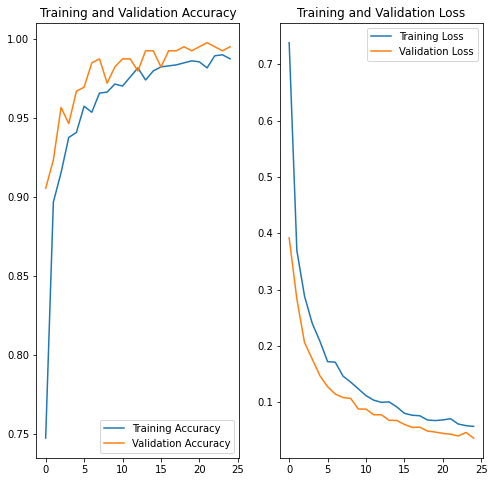

1/1 [==============================] - 17s 17s/step
[[112   4   0   7]
 [  5 118   0   0]
 [  1   0 122   0]
 [ 37   0   0  86]]
{'HSIL': {'precision': 0.7225806451612903, 'recall': 0.9105691056910569, 'f1-score': 0.8057553956834531, 'support': 123}, 'LSIL': {'precision': 0.9672131147540983, 'recall': 0.959349593495935, 'f1-score': 0.9632653061224489, 'support': 123}, 'NIM': {'precision': 1.0, 'recall': 0.991869918699187, 'f1-score': 0.9959183673469388, 'support': 123}, 'SCC': {'precision': 0.9247311827956989, 'recall': 0.6991869918699187, 'f1-score': 0.7962962962962962, 'support': 123}, 'accuracy': 0.8902439024390244, 'macro avg': {'precision': 0.9036312356777719, 'recall': 0.8902439024390244, 'f1-score': 0.8903088413622843, 'support': 492}, 'weighted avg': {'precision': 0.9036312356777719, 'recall': 0.8902439024390244, 'f1-score': 0.8903088413622843, 'support': 492}}


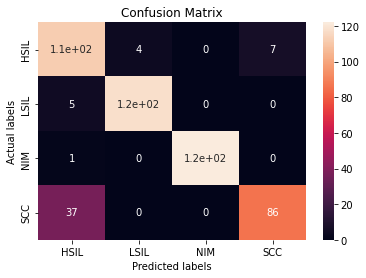

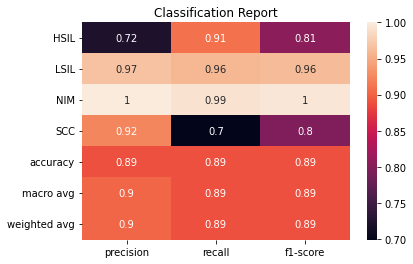

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


11
InceptionResNetV2
219070464/219055592 [==============================] - 1s 0us/step
Epoch 1/25
98/98 [==============================] - 26s 162ms/step - loss: 8.7238 - accuracy: 0.2519 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 2/25
98/98 [==============================] - 12s 127ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 3/25
98/98 [==============================] - 13s 128ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 4/25
98/98 [==============================] - 12s 127ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 5/25
98/98 [==============================] - 12s 126ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 6/25
98/98 [==============================] - 12s 125ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 7/25
98/98 [==============================] - 12

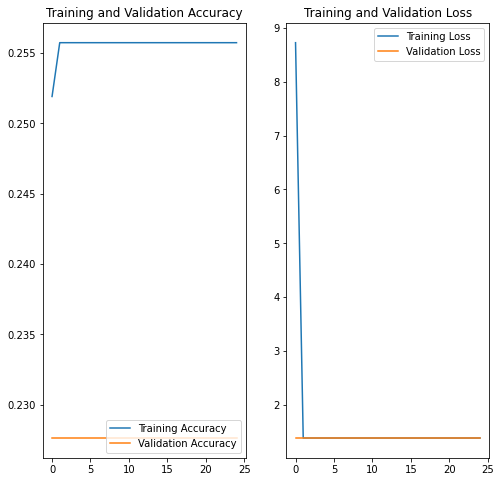

1/1 [==============================] - 16s 16s/step
[[123   0   0   0]
 [123   0   0   0]
 [123   0   0   0]
 [123   0   0   0]]
{'HSIL': {'precision': 0.25, 'recall': 1.0, 'f1-score': 0.4, 'support': 123}, 'LSIL': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'NIM': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'SCC': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'accuracy': 0.25, 'macro avg': {'precision': 0.0625, 'recall': 0.25, 'f1-score': 0.1, 'support': 492}, 'weighted avg': {'precision': 0.0625, 'recall': 0.25, 'f1-score': 0.1, 'support': 492}}


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

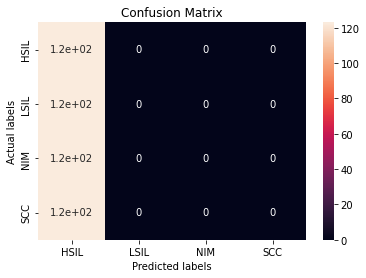

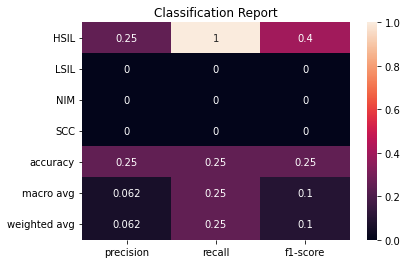

12
InceptionV3
87924736/87910968 [==============================] - 3s 0us/step
Epoch 1/25
98/98 [==============================] - 12s 83ms/step - loss: 1.9077 - accuracy: 0.2608 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 2/25
98/98 [==============================] - 5s 50ms/step - loss: 1.3830 - accuracy: 0.2589 - val_loss: 1.3757 - val_accuracy: 0.2353
Epoch 3/25
98/98 [==============================] - 5s 50ms/step - loss: 1.3722 - accuracy: 0.2691 - val_loss: 1.3590 - val_accuracy: 0.2481
Epoch 4/25
98/98 [==============================] - 5s 51ms/step - loss: 1.3972 - accuracy: 0.2666 - val_loss: 1.3828 - val_accuracy: 0.2302
Epoch 5/25
98/98 [==============================] - 5s 51ms/step - loss: 1.3845 - accuracy: 0.2570 - val_loss: 1.3828 - val_accuracy: 0.2302
Epoch 6/25
98/98 [==============================] - 5s 51ms/step - loss: 1.3845 - accuracy: 0.2570 - val_loss: 1.3828 - val_accuracy: 0.2302
Epoch 7/25
98/98 [==============================] - 5s 51ms/step - loss: 

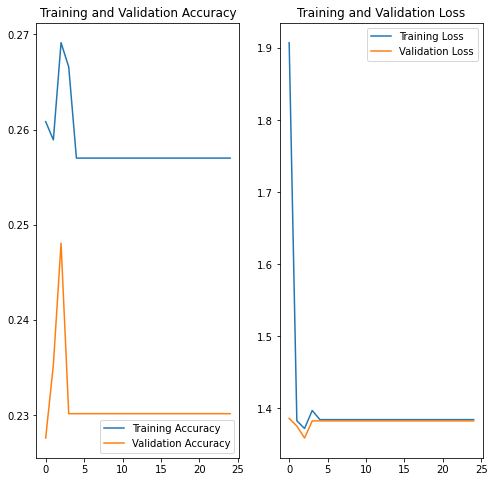

1/1 [==============================] - 8s 8s/step
[[123   0   0   0]
 [123   0   0   0]
 [123   0   0   0]
 [123   0   0   0]]
{'HSIL': {'precision': 0.25, 'recall': 1.0, 'f1-score': 0.4, 'support': 123}, 'LSIL': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'NIM': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'SCC': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'accuracy': 0.25, 'macro avg': {'precision': 0.0625, 'recall': 0.25, 'f1-score': 0.1, 'support': 492}, 'weighted avg': {'precision': 0.0625, 'recall': 0.25, 'f1-score': 0.1, 'support': 492}}


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

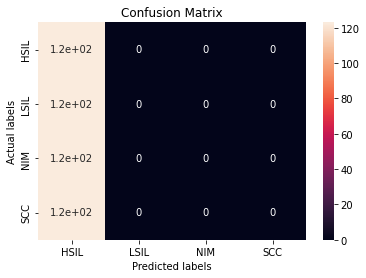

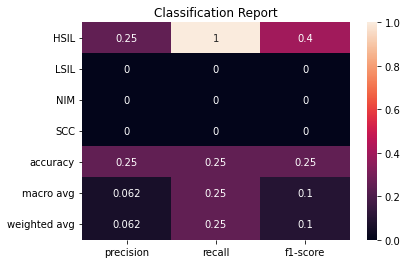

13
MobileNet
17235968/17225924 [==============================] - 0s 0us/step
Epoch 1/25
98/98 [==============================] - 4s 29ms/step - loss: 1.3783 - accuracy: 0.2526 - val_loss: 1.2883 - val_accuracy: 0.2276
Epoch 2/25
98/98 [==============================] - 2s 23ms/step - loss: 1.2548 - accuracy: 0.2557 - val_loss: 1.2546 - val_accuracy: 0.2276
Epoch 3/25
98/98 [==============================] - 2s 23ms/step - loss: 1.2281 - accuracy: 0.2557 - val_loss: 1.2511 - val_accuracy: 0.2276
Epoch 4/25
98/98 [==============================] - 2s 23ms/step - loss: 1.2162 - accuracy: 0.2557 - val_loss: 1.2360 - val_accuracy: 0.2276
Epoch 5/25
98/98 [==============================] - 2s 23ms/step - loss: 1.2044 - accuracy: 0.2557 - val_loss: 1.2265 - val_accuracy: 0.2276
Epoch 6/25
98/98 [==============================] - 2s 23ms/step - loss: 1.1995 - accuracy: 0.2557 - val_loss: 1.2203 - val_accuracy: 0.2276
Epoch 7/25
98/98 [==============================] - 2s 23ms/step - loss: 1.1

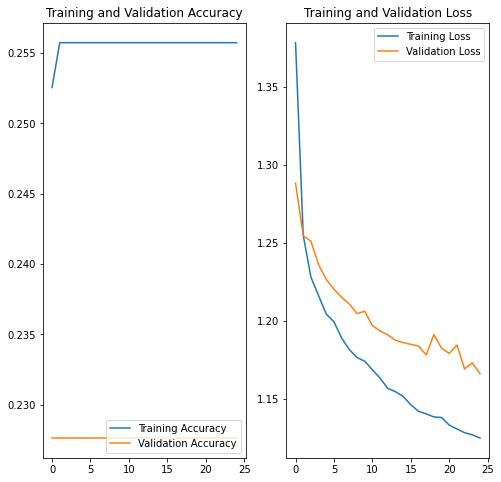

1/1 [==============================] - 4s 4s/step
[[123   0   0   0]
 [123   0   0   0]
 [123   0   0   0]
 [123   0   0   0]]
{'HSIL': {'precision': 0.25, 'recall': 1.0, 'f1-score': 0.4, 'support': 123}, 'LSIL': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'NIM': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'SCC': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'accuracy': 0.25, 'macro avg': {'precision': 0.0625, 'recall': 0.25, 'f1-score': 0.1, 'support': 492}, 'weighted avg': {'precision': 0.0625, 'recall': 0.25, 'f1-score': 0.1, 'support': 492}}


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

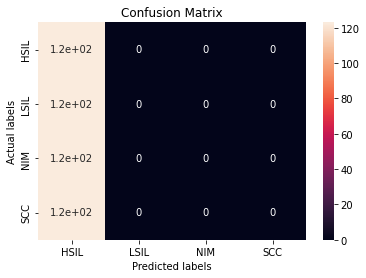

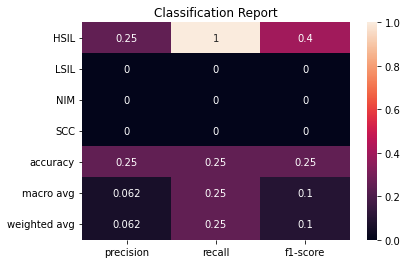

14
MobileNetV2
9420800/9406464 [==============================] - 0s 0us/step
Epoch 1/25
98/98 [==============================] - 6s 35ms/step - loss: 1.3022 - accuracy: 0.2557 - val_loss: 1.3033 - val_accuracy: 0.2276
Epoch 2/25
98/98 [==============================] - 3s 27ms/step - loss: 1.2604 - accuracy: 0.2557 - val_loss: 1.3006 - val_accuracy: 0.2276
Epoch 3/25
98/98 [==============================] - 3s 27ms/step - loss: 1.2504 - accuracy: 0.2557 - val_loss: 1.3024 - val_accuracy: 0.2276
Epoch 4/25
98/98 [==============================] - 3s 27ms/step - loss: 1.2486 - accuracy: 0.2557 - val_loss: 1.2915 - val_accuracy: 0.2276
Epoch 5/25
98/98 [==============================] - 3s 27ms/step - loss: 1.2427 - accuracy: 0.2557 - val_loss: 1.2916 - val_accuracy: 0.2276
Epoch 6/25
98/98 [==============================] - 3s 27ms/step - loss: 1.2459 - accuracy: 0.2557 - val_loss: 1.2954 - val_accuracy: 0.2276
Epoch 7/25
98/98 [==============================] - 3s 27ms/step - loss: 1.2

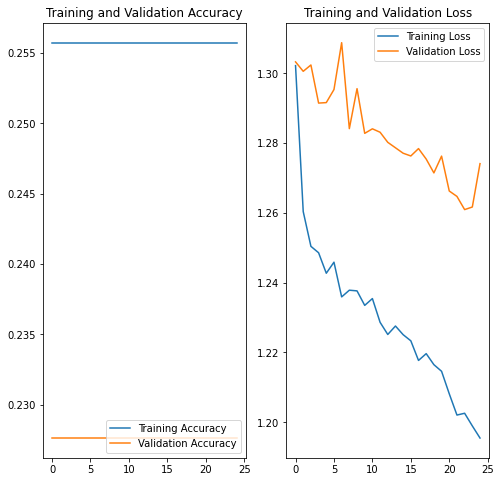

1/1 [==============================] - 2s 2s/step
[[123   0   0   0]
 [123   0   0   0]
 [123   0   0   0]
 [123   0   0   0]]
{'HSIL': {'precision': 0.25, 'recall': 1.0, 'f1-score': 0.4, 'support': 123}, 'LSIL': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'NIM': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'SCC': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'accuracy': 0.25, 'macro avg': {'precision': 0.0625, 'recall': 0.25, 'f1-score': 0.1, 'support': 492}, 'weighted avg': {'precision': 0.0625, 'recall': 0.25, 'f1-score': 0.1, 'support': 492}}


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

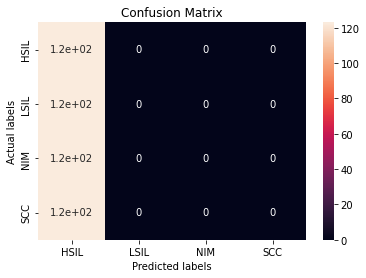

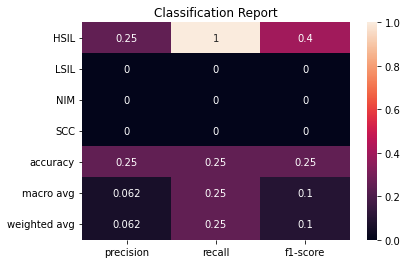

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


15
MobileNetV3Large
skipped model: MobileNetV3Large
16
MobileNetV3Small
skipped model: MobileNetV3Small
17
NASNetMobile
20004864/19993432 [==============================] - 1s 0us/step
Epoch 1/25
98/98 [==============================] - 20s 84ms/step - loss: 1.6117 - accuracy: 0.3093 - val_loss: 1.3620 - val_accuracy: 0.2813
Epoch 2/25
98/98 [==============================] - 5s 48ms/step - loss: 1.3656 - accuracy: 0.3080 - val_loss: 1.3268 - val_accuracy: 0.3606
Epoch 3/25
98/98 [==============================] - 5s 49ms/step - loss: 1.3310 - accuracy: 0.3565 - val_loss: 1.2455 - val_accuracy: 0.4297
Epoch 4/25
98/98 [==============================] - 5s 48ms/step - loss: 1.2953 - accuracy: 0.3903 - val_loss: 1.2451 - val_accuracy: 0.3964
Epoch 5/25
98/98 [==============================] - 5s 48ms/step - loss: 1.2541 - accuracy: 0.4011 - val_loss: 1.1640 - val_accuracy: 0.4706
Epoch 6/25
98/98 [==============================] - 5s 49ms/step - loss: 1.2254 - accuracy: 0.4228 - val_loss

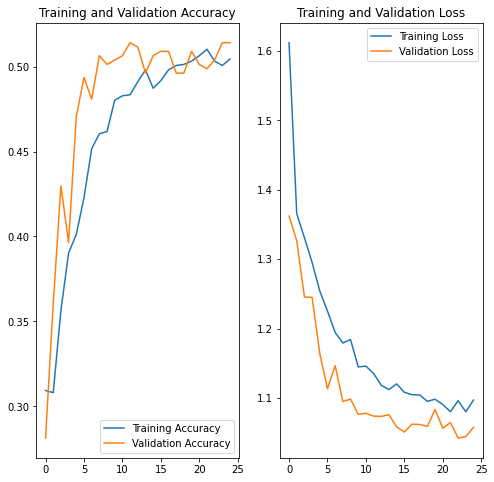

1/1 [==============================] - 5s 5s/step
[[ 97   0  11  15]
 [121   0   1   1]
 [ 41   0  78   4]
 [ 56   0   0  67]]
{'HSIL': {'precision': 0.30793650793650795, 'recall': 0.7886178861788617, 'f1-score': 0.4429223744292237, 'support': 123}, 'LSIL': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'NIM': {'precision': 0.8666666666666667, 'recall': 0.6341463414634146, 'f1-score': 0.7323943661971831, 'support': 123}, 'SCC': {'precision': 0.7701149425287356, 'recall': 0.5447154471544715, 'f1-score': 0.638095238095238, 'support': 123}, 'accuracy': 0.491869918699187, 'macro avg': {'precision': 0.4861795292829776, 'recall': 0.491869918699187, 'f1-score': 0.45335299468041124, 'support': 492}, 'weighted avg': {'precision': 0.4861795292829776, 'recall': 0.491869918699187, 'f1-score': 0.4533529946804112, 'support': 492}}


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

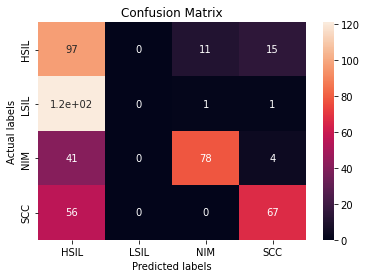

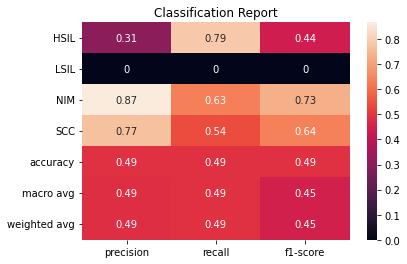

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


18
ResNet101V2
171327488/171317808 [==============================] - 7s 0us/step
Epoch 1/25
98/98 [==============================] - 18s 121ms/step - loss: 10.6045 - accuracy: 0.2577 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 2/25
98/98 [==============================] - 10s 103ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 3/25
98/98 [==============================] - 10s 104ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 4/25
98/98 [==============================] - 10s 104ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 5/25
98/98 [==============================] - 10s 102ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 6/25
98/98 [==============================] - 10s 101ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 7/25
98/98 [==============================] - 10s 101

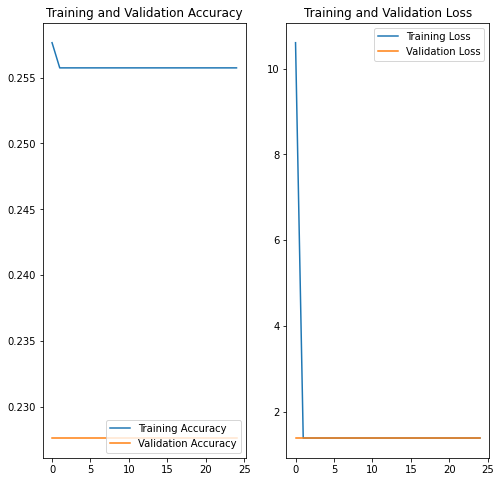

1/1 [==============================] - 9s 9s/step
[[123   0   0   0]
 [123   0   0   0]
 [123   0   0   0]
 [123   0   0   0]]
{'HSIL': {'precision': 0.25, 'recall': 1.0, 'f1-score': 0.4, 'support': 123}, 'LSIL': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'NIM': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'SCC': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'accuracy': 0.25, 'macro avg': {'precision': 0.0625, 'recall': 0.25, 'f1-score': 0.1, 'support': 492}, 'weighted avg': {'precision': 0.0625, 'recall': 0.25, 'f1-score': 0.1, 'support': 492}}


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

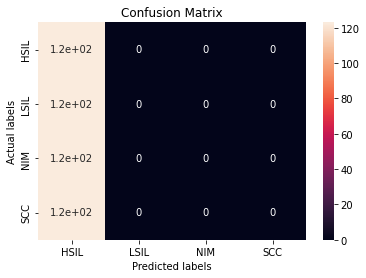

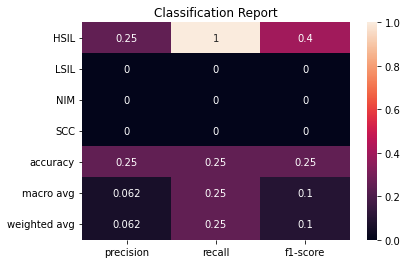

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


19
ResNet152
234708992/234698864 [==============================] - 7s 0us/step
Epoch 1/25
98/98 [==============================] - 26s 177ms/step - loss: 1.1105 - accuracy: 0.4630 - val_loss: 1.0566 - val_accuracy: 0.4680
Epoch 2/25
98/98 [==============================] - 15s 156ms/step - loss: 1.0611 - accuracy: 0.4898 - val_loss: 1.0421 - val_accuracy: 0.4783
Epoch 3/25
98/98 [==============================] - 15s 153ms/step - loss: 1.0531 - accuracy: 0.4962 - val_loss: 1.0371 - val_accuracy: 0.4655
Epoch 4/25
98/98 [==============================] - 15s 152ms/step - loss: 1.0498 - accuracy: 0.4955 - val_loss: 1.0342 - val_accuracy: 0.4783
Epoch 5/25
98/98 [==============================] - 15s 151ms/step - loss: 1.0482 - accuracy: 0.4987 - val_loss: 1.0344 - val_accuracy: 0.4834
Epoch 6/25
98/98 [==============================] - 15s 151ms/step - loss: 1.0469 - accuracy: 0.4987 - val_loss: 1.0326 - val_accuracy: 0.4859
Epoch 7/25
98/98 [==============================] - 15s 154ms/

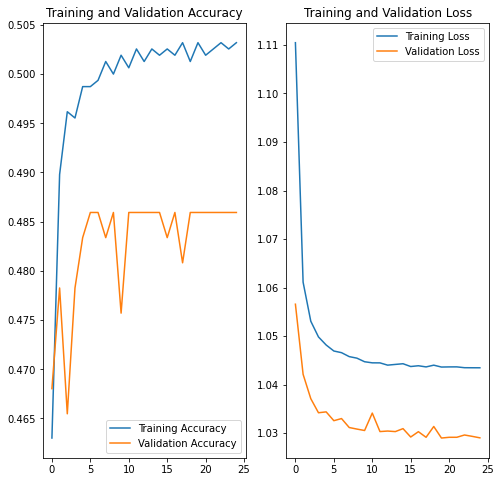

1/1 [==============================] - 2s 2s/step
[[121   0   2   0]
 [118   0   5   0]
 [  1   0 122   0]
 [120   0   3   0]]
{'HSIL': {'precision': 0.33611111111111114, 'recall': 0.983739837398374, 'f1-score': 0.5010351966873706, 'support': 123}, 'LSIL': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'NIM': {'precision': 0.9242424242424242, 'recall': 0.991869918699187, 'f1-score': 0.9568627450980391, 'support': 123}, 'SCC': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'accuracy': 0.49390243902439024, 'macro avg': {'precision': 0.31508838383838383, 'recall': 0.49390243902439024, 'f1-score': 0.3644744854463524, 'support': 492}, 'weighted avg': {'precision': 0.3150883838383838, 'recall': 0.49390243902439024, 'f1-score': 0.36447448544635247, 'support': 492}}


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

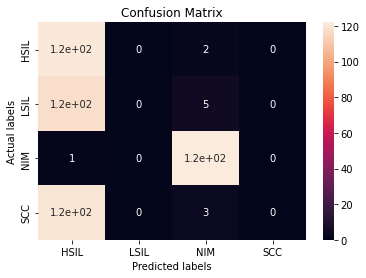

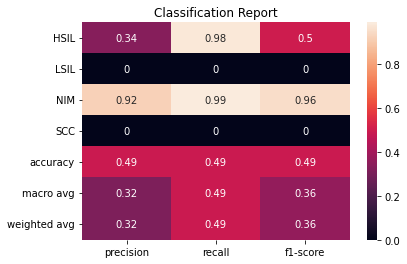

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


20
ResNet152V2
234561536/234545216 [==============================] - 9s 0us/step
Epoch 1/25
98/98 [==============================] - 25s 170ms/step - loss: 10.1327 - accuracy: 0.2577 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 2/25
98/98 [==============================] - 15s 151ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 3/25
98/98 [==============================] - 15s 148ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 4/25
98/98 [==============================] - 14s 147ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 5/25
98/98 [==============================] - 14s 147ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 6/25
98/98 [==============================] - 14s 147ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 7/25
98/98 [==============================] - 14s 148

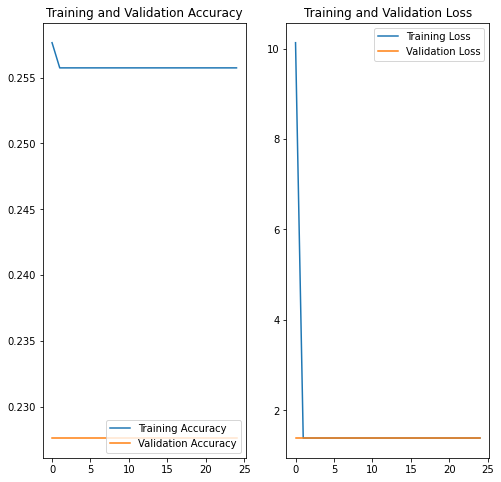

1/1 [==============================] - 2s 2s/step
[[123   0   0   0]
 [123   0   0   0]
 [123   0   0   0]
 [123   0   0   0]]
{'HSIL': {'precision': 0.25, 'recall': 1.0, 'f1-score': 0.4, 'support': 123}, 'LSIL': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'NIM': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'SCC': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'accuracy': 0.25, 'macro avg': {'precision': 0.0625, 'recall': 0.25, 'f1-score': 0.1, 'support': 492}, 'weighted avg': {'precision': 0.0625, 'recall': 0.25, 'f1-score': 0.1, 'support': 492}}


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

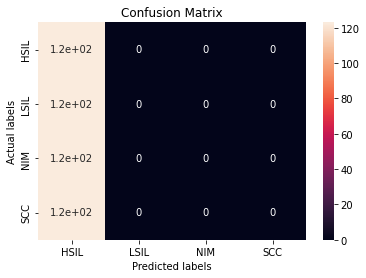

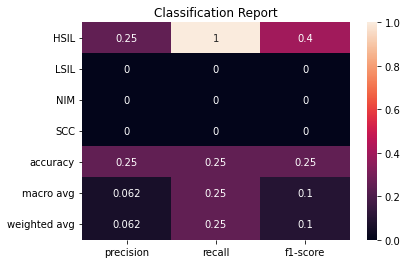

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


21
ResNet50
94781440/94765736 [==============================] - 0s 0us/step
Epoch 1/25
98/98 [==============================] - 10s 73ms/step - loss: 0.5403 - accuracy: 0.7844 - val_loss: 0.2294 - val_accuracy: 0.9488
Epoch 2/25
98/98 [==============================] - 6s 64ms/step - loss: 0.1773 - accuracy: 0.9560 - val_loss: 0.1310 - val_accuracy: 0.9719
Epoch 3/25
98/98 [==============================] - 6s 64ms/step - loss: 0.1166 - accuracy: 0.9719 - val_loss: 0.0953 - val_accuracy: 0.9821
Epoch 4/25
98/98 [==============================] - 6s 64ms/step - loss: 0.0795 - accuracy: 0.9809 - val_loss: 0.0741 - val_accuracy: 0.9847
Epoch 5/25
98/98 [==============================] - 6s 65ms/step - loss: 0.0617 - accuracy: 0.9892 - val_loss: 0.0675 - val_accuracy: 0.9847
Epoch 6/25
98/98 [==============================] - 6s 65ms/step - loss: 0.0485 - accuracy: 0.9930 - val_loss: 0.0514 - val_accuracy: 0.9898
Epoch 7/25
98/98 [==============================] - 6s 64ms/step - loss: 0.0

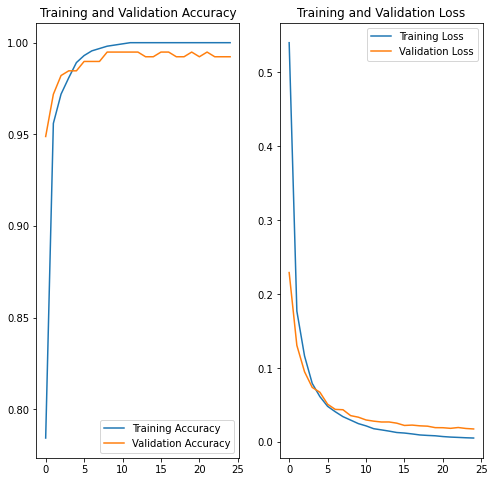

1/1 [==============================] - 1s 829ms/step
[[122   1   0   0]
 [  0 123   0   0]
 [  0   0 123   0]
 [  3   0   0 120]]
{'HSIL': {'precision': 0.976, 'recall': 0.991869918699187, 'f1-score': 0.9838709677419355, 'support': 123}, 'LSIL': {'precision': 0.9919354838709677, 'recall': 1.0, 'f1-score': 0.9959514170040485, 'support': 123}, 'NIM': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 123}, 'SCC': {'precision': 1.0, 'recall': 0.975609756097561, 'f1-score': 0.9876543209876543, 'support': 123}, 'accuracy': 0.991869918699187, 'macro avg': {'precision': 0.991983870967742, 'recall': 0.991869918699187, 'f1-score': 0.9918691764334095, 'support': 492}, 'weighted avg': {'precision': 0.9919838709677419, 'recall': 0.991869918699187, 'f1-score': 0.9918691764334095, 'support': 492}}


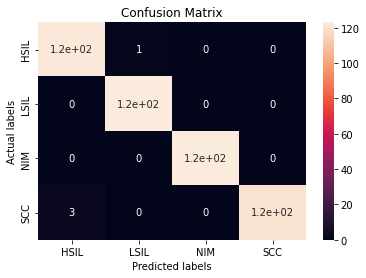

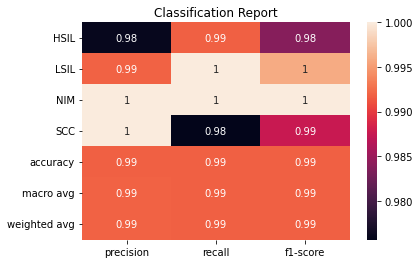

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


22
ResNet50V2
94683136/94668760 [==============================] - 4s 0us/step
Epoch 1/25
98/98 [==============================] - 9s 66ms/step - loss: 1.8783 - accuracy: 0.2589 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 2/25
98/98 [==============================] - 6s 58ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 3/25
98/98 [==============================] - 6s 58ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 4/25
98/98 [==============================] - 6s 59ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 5/25
98/98 [==============================] - 6s 59ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 6/25
98/98 [==============================] - 6s 59ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 7/25
98/98 [==============================] - 6s 59ms/step - loss: 1.

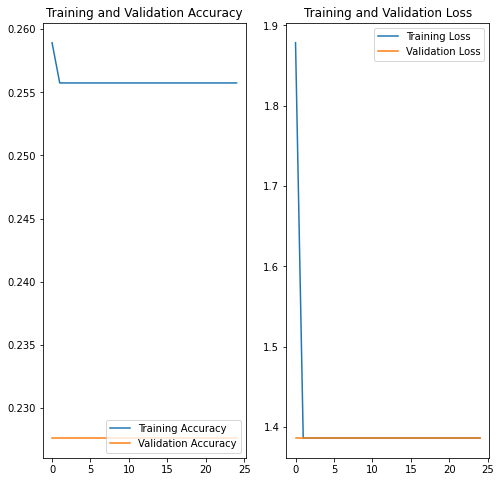

1/1 [==============================] - 1s 722ms/step
[[123   0   0   0]
 [123   0   0   0]
 [123   0   0   0]
 [123   0   0   0]]
{'HSIL': {'precision': 0.25, 'recall': 1.0, 'f1-score': 0.4, 'support': 123}, 'LSIL': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'NIM': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'SCC': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'accuracy': 0.25, 'macro avg': {'precision': 0.0625, 'recall': 0.25, 'f1-score': 0.1, 'support': 492}, 'weighted avg': {'precision': 0.0625, 'recall': 0.25, 'f1-score': 0.1, 'support': 492}}


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

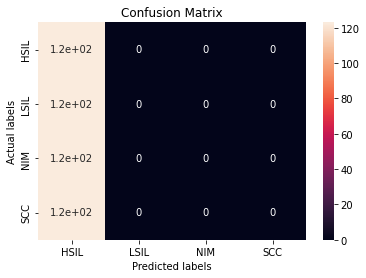

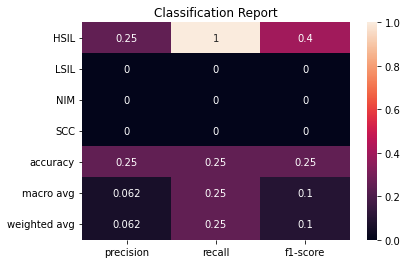

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


23
VGG16
58900480/58889256 [==============================] - 1s 0us/step
Epoch 1/25
98/98 [==============================] - 14s 104ms/step - loss: 1.1853 - accuracy: 0.5568 - val_loss: 0.8170 - val_accuracy: 0.6880
Epoch 2/25
98/98 [==============================] - 8s 83ms/step - loss: 0.7605 - accuracy: 0.7213 - val_loss: 0.7050 - val_accuracy: 0.7161
Epoch 3/25
98/98 [==============================] - 8s 83ms/step - loss: 0.6911 - accuracy: 0.7551 - val_loss: 0.6589 - val_accuracy: 0.7417
Epoch 4/25
98/98 [==============================] - 8s 83ms/step - loss: 0.6604 - accuracy: 0.7704 - val_loss: 0.6319 - val_accuracy: 0.7647
Epoch 5/25
98/98 [==============================] - 8s 83ms/step - loss: 0.6418 - accuracy: 0.7825 - val_loss: 0.6250 - val_accuracy: 0.7545
Epoch 6/25
98/98 [==============================] - 8s 83ms/step - loss: 0.6323 - accuracy: 0.7940 - val_loss: 0.6140 - val_accuracy: 0.7647
Epoch 7/25
98/98 [==============================] - 8s 83ms/step - loss: 0.624

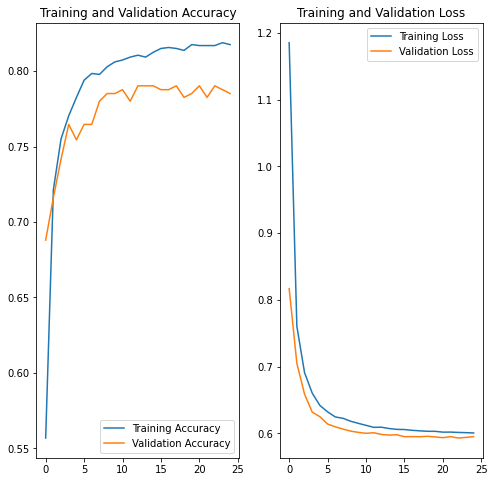

skipped model: VGG16
24
VGG19
80150528/80134624 [==============================] - 4s 0us/step
Epoch 1/25
98/98 [==============================] - 10s 102ms/step - loss: 1.4259 - accuracy: 0.3182 - val_loss: 1.2445 - val_accuracy: 0.3427
Epoch 2/25
98/98 [==============================] - 10s 102ms/step - loss: 1.1156 - accuracy: 0.4911 - val_loss: 0.8801 - val_accuracy: 0.6036
Epoch 3/25
98/98 [==============================] - 10s 104ms/step - loss: 0.9287 - accuracy: 0.6020 - val_loss: 0.8460 - val_accuracy: 0.6317
Epoch 4/25
98/98 [==============================] - 10s 104ms/step - loss: 0.8886 - accuracy: 0.6110 - val_loss: 0.8188 - val_accuracy: 0.6266
Epoch 5/25
98/98 [==============================] - 10s 102ms/step - loss: 0.8731 - accuracy: 0.6173 - val_loss: 0.8014 - val_accuracy: 0.6445
Epoch 6/25
98/98 [==============================] - 10s 100ms/step - loss: 0.8612 - accuracy: 0.6288 - val_loss: 0.7995 - val_accuracy: 0.6343
Epoch 7/25
98/98 [=============================

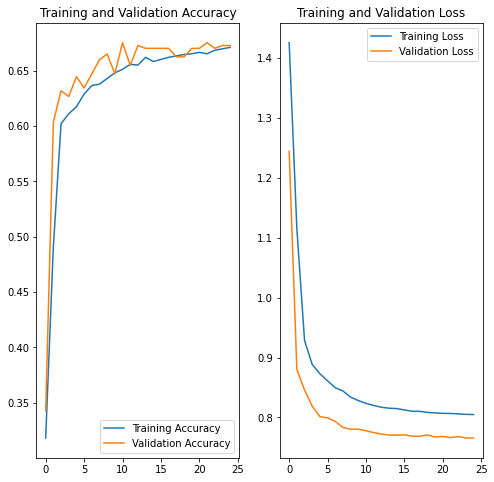

skipped model: VGG19
25
Xception
83697664/83683744 [==============================] - 2s 0us/step
Epoch 1/25
98/98 [==============================] - 12s 92ms/step - loss: 2.7280 - accuracy: 0.2589 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 2/25
98/98 [==============================] - 8s 80ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 3/25
98/98 [==============================] - 8s 82ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 4/25
98/98 [==============================] - 8s 83ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 5/25
98/98 [==============================] - 8s 82ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 6/25
98/98 [==============================] - 8s 81ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 7/25
98/98 [==============================] - 8s 

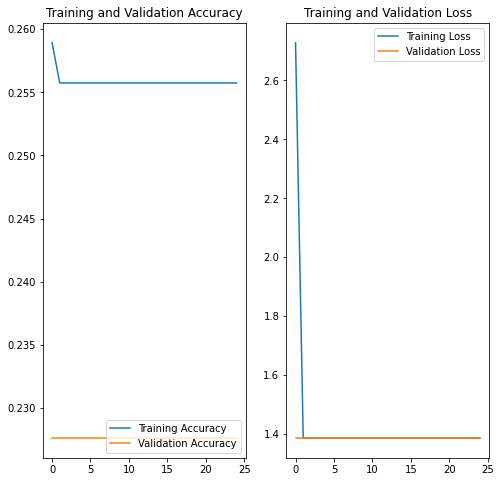

1/1 [==============================] - 13s 13s/step
[[123   0   0   0]
 [123   0   0   0]
 [123   0   0   0]
 [123   0   0   0]]
{'HSIL': {'precision': 0.25, 'recall': 1.0, 'f1-score': 0.4, 'support': 123}, 'LSIL': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'NIM': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'SCC': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'accuracy': 0.25, 'macro avg': {'precision': 0.0625, 'recall': 0.25, 'f1-score': 0.1, 'support': 492}, 'weighted avg': {'precision': 0.0625, 'recall': 0.25, 'f1-score': 0.1, 'support': 492}}


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

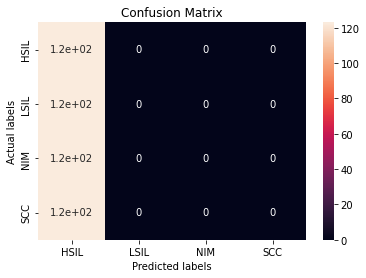

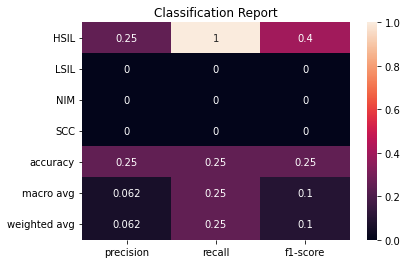

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


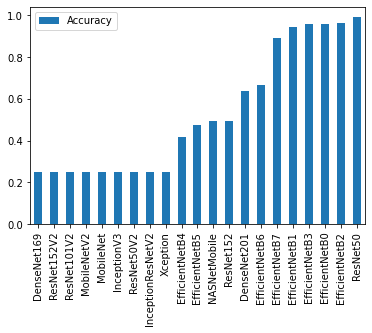

In [ ]:
# testing transfer learning  method
accdict = {}

epoch = 25 
labels = ['HSIL', 'LSIL', 'NIM', 'SCC']
model_dictionary = {m[0]:m[1] for m in inspect.getmembers(tf.keras.applications, inspect.isfunction)}
count = 0

for model_name, PT_model in model_dictionary.items():
  if (model_name != 'NASNetLarge'):
    count+=1
    print(count)
    try:
      print(model_name)
      history_PT, model_PT = pretrained(train, epoch, val, PT_model)
      plot_AccVal(history_PT, epoch, True)
      test_pred, test_labels = getpredlabel(test, model_PT)
      acc, cm = PlotPerformance(test_labels, test_pred, labels)
      filename = '/content/drive/MyDrive/Pap ML Project (Shared Drive)/saved models AUG2/model_' + model_name + '.h5'
      accdict[model_name] = acc
      model_PT.save(filename)  
      print(accdict)
    except:
      print('skipped model: ' + model_name)
plotTransferAcc(accdict)

Epoch 1/25
98/98 [==============================] - 7s 48ms/step - loss: 0.5310 - accuracy: 0.7997 - val_loss: 0.2018 - val_accuracy: 0.9540
Epoch 2/25
98/98 [==============================] - 4s 40ms/step - loss: 0.1683 - accuracy: 0.9566 - val_loss: 0.1198 - val_accuracy: 0.9821
Epoch 3/25
98/98 [==============================] - 4s 40ms/step - loss: 0.1126 - accuracy: 0.9719 - val_loss: 0.0887 - val_accuracy: 0.9821
Epoch 4/25
98/98 [==============================] - 4s 40ms/step - loss: 0.0808 - accuracy: 0.9815 - val_loss: 0.0677 - val_accuracy: 0.9847
Epoch 5/25
98/98 [==============================] - 4s 40ms/step - loss: 0.0606 - accuracy: 0.9911 - val_loss: 0.0613 - val_accuracy: 0.9898
Epoch 6/25
98/98 [==============================] - 4s 40ms/step - loss: 0.0508 - accuracy: 0.9917 - val_loss: 0.0563 - val_accuracy: 0.9898
Epoch 7/25
98/98 [==============================] - 4s 40ms/step - loss: 0.0412 - accuracy: 0.9955 - val_loss: 0.0493 - val_accuracy: 0.9898
Epoch 8/25
98

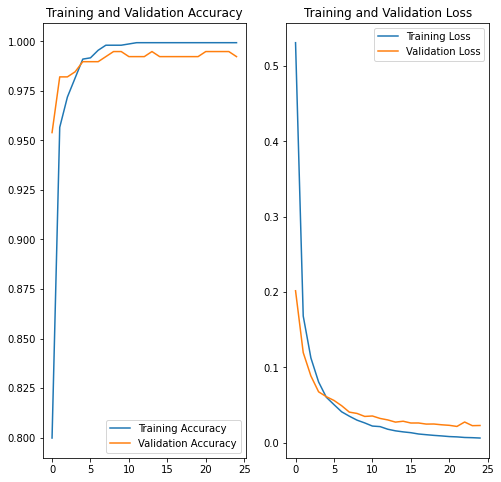

1/1 [==============================] - 2s 2s/step
[[121   1   0   1]
 [  0 123   0   0]
 [  0   0 123   0]
 [  0   0   0 123]]
{'HSIL': {'precision': 1.0, 'recall': 0.983739837398374, 'f1-score': 0.9918032786885246, 'support': 123}, 'LSIL': {'precision': 0.9919354838709677, 'recall': 1.0, 'f1-score': 0.9959514170040485, 'support': 123}, 'NIM': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 123}, 'SCC': {'precision': 0.9919354838709677, 'recall': 1.0, 'f1-score': 0.9959514170040485, 'support': 123}, 'accuracy': 0.9959349593495935, 'macro avg': {'precision': 0.995967741935484, 'recall': 0.9959349593495935, 'f1-score': 0.9959265281741554, 'support': 492}, 'weighted avg': {'precision': 0.9959677419354839, 'recall': 0.9959349593495935, 'f1-score': 0.9959265281741555, 'support': 492}}


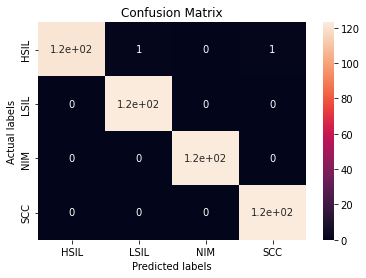

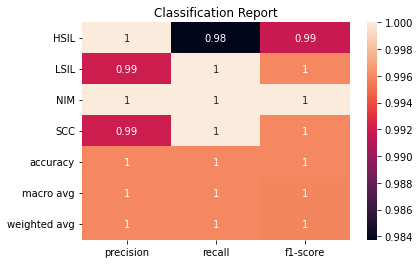

In [ ]:
epoch = 25 
labels = ['HSIL', 'LSIL', 'NIM', 'SCC']
name = ['ResNet50', 'DenseNet121', 'ResNet101', 'ResNet152', 'EfficientNetB0V2']
model_dictionary = {m[0]:m[1] for m in inspect.getmembers(tf.keras.applications, inspect.isfunction)}
PT_model = model_dictionary[name[0]]
start = time.time()
history_PT, model_PT = pretrained(train, epoch, val, PT_model)
end = time.time()
print("runtime: {}".format(end-start))
plot_AccVal(history_PT, epoch, True)
test_pred, test_labels, pred = getpredlabel(test, model_PT)
acc, cm, cr = PlotPerformance(test_labels, test_pred, labels)
# filename = '/content/drive/MyDrive/Pap ML Project (Shared Drive)/saved models AUG2/model_' + model_name + '.h5'
# model_PT.save(filename)  

1/1 [==============================] - 0s 86ms/step
[[123   0   0   0]
 [  0 123   0   0]
 [  1   0 122   0]
 [ 86   1   0  36]]
{'HSIL': {'precision': 0.5857142857142857, 'recall': 1.0, 'f1-score': 0.7387387387387387, 'support': 123}, 'LSIL': {'precision': 0.9919354838709677, 'recall': 1.0, 'f1-score': 0.9959514170040485, 'support': 123}, 'NIM': {'precision': 1.0, 'recall': 0.991869918699187, 'f1-score': 0.9959183673469388, 'support': 123}, 'SCC': {'precision': 1.0, 'recall': 0.2926829268292683, 'f1-score': 0.45283018867924524, 'support': 123}, 'accuracy': 0.8211382113821138, 'macro avg': {'precision': 0.8944124423963133, 'recall': 0.8211382113821137, 'f1-score': 0.7958596779422428, 'support': 492}, 'weighted avg': {'precision': 0.8944124423963133, 'recall': 0.8211382113821138, 'f1-score': 0.7958596779422429, 'support': 492}}


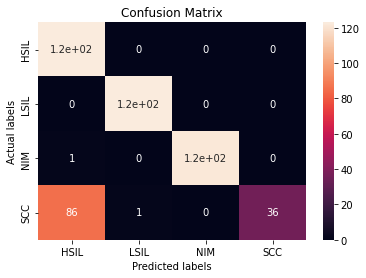

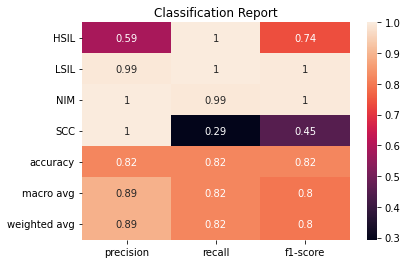

In [ ]:
test_pred, test_labels, pred = getpredlabel(test, model_PT)
acc, cm, cr = PlotPerformance(test_labels, test_pred, labels)
filename = '/content/drive/MyDrive/Pap ML Project (Shared Drive)/final_models/model_EffifientNetB0V2.h5'
model_PT.save(filename)  

Epoch 1/25
98/98 [==============================] - 11s 56ms/step - loss: 1.0598 - accuracy: 0.5115 - val_loss: 0.9384 - val_accuracy: 0.5243
Epoch 2/25
98/98 [==============================] - 4s 41ms/step - loss: 0.9010 - accuracy: 0.5816 - val_loss: 0.8792 - val_accuracy: 0.5908
Epoch 3/25
98/98 [==============================] - 4s 40ms/step - loss: 0.8676 - accuracy: 0.6097 - val_loss: 0.8603 - val_accuracy: 0.5985
Epoch 4/25
98/98 [==============================] - 4s 40ms/step - loss: 0.8487 - accuracy: 0.6250 - val_loss: 0.8551 - val_accuracy: 0.5703
Epoch 5/25
98/98 [==============================] - 4s 40ms/step - loss: 0.8366 - accuracy: 0.6339 - val_loss: 0.8380 - val_accuracy: 0.5959
Epoch 6/25
98/98 [==============================] - 4s 40ms/step - loss: 0.8271 - accuracy: 0.6378 - val_loss: 0.8306 - val_accuracy: 0.6138
Epoch 7/25
98/98 [==============================] - 4s 40ms/step - loss: 0.8228 - accuracy: 0.6435 - val_loss: 0.8256 - val_accuracy: 0.6087
Epoch 8/25
9

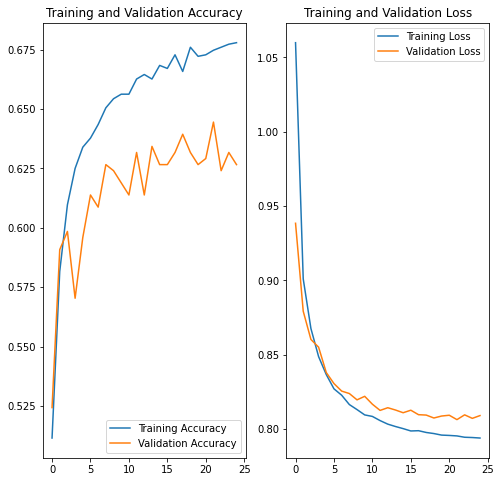

1/1 [==============================] - 1s 1s/step
[[ 97  13   0  13]
 [  0 123   0   0]
 [118   5   0   0]
 [ 29   7   0  87]]
{'HSIL': {'precision': 0.3975409836065574, 'recall': 0.7886178861788617, 'f1-score': 0.5286103542234333, 'support': 123}, 'LSIL': {'precision': 0.831081081081081, 'recall': 1.0, 'f1-score': 0.9077490774907748, 'support': 123}, 'NILM': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'SCC': {'precision': 0.87, 'recall': 0.7073170731707317, 'f1-score': 0.7802690582959642, 'support': 123}, 'accuracy': 0.6239837398373984, 'macro avg': {'precision': 0.5246555161719096, 'recall': 0.6239837398373984, 'f1-score': 0.554157122502543, 'support': 492}, 'weighted avg': {'precision': 0.5246555161719096, 'recall': 0.6239837398373984, 'f1-score': 0.554157122502543, 'support': 492}}


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

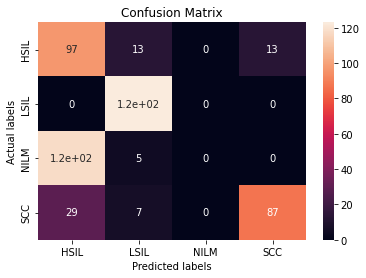

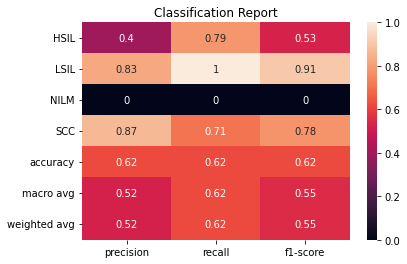

Epoch 1/25
98/98 [==============================] - 13s 64ms/step - loss: 1.1437 - accuracy: 0.5045 - val_loss: 0.7759 - val_accuracy: 0.5985
Epoch 2/25
98/98 [==============================] - 4s 43ms/step - loss: 0.8194 - accuracy: 0.5931 - val_loss: 0.7370 - val_accuracy: 0.6292
Epoch 3/25
98/98 [==============================] - 4s 43ms/step - loss: 0.7519 - accuracy: 0.6193 - val_loss: 0.6692 - val_accuracy: 0.6266
Epoch 4/25
98/98 [==============================] - 4s 42ms/step - loss: 0.7105 - accuracy: 0.6269 - val_loss: 0.7606 - val_accuracy: 0.6189
Epoch 5/25
98/98 [==============================] - 4s 42ms/step - loss: 0.6742 - accuracy: 0.6231 - val_loss: 0.5796 - val_accuracy: 0.6471
Epoch 6/25
98/98 [==============================] - 4s 42ms/step - loss: 0.6120 - accuracy: 0.6358 - val_loss: 0.5836 - val_accuracy: 0.6445
Epoch 7/25
98/98 [==============================] - 4s 42ms/step - loss: 0.5833 - accuracy: 0.6435 - val_loss: 0.5410 - val_accuracy: 0.6573
Epoch 8/25
9

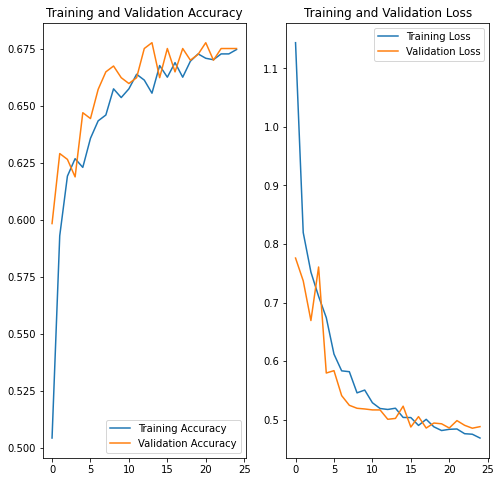

1/1 [==============================] - 2s 2s/step
[[106   0   4  13]
 [111   0   9   3]
 [  0   0 123   0]
 [ 36   0   1  86]]
{'HSIL': {'precision': 0.4189723320158103, 'recall': 0.8617886178861789, 'f1-score': 0.5638297872340426, 'support': 123}, 'LSIL': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'NILM': {'precision': 0.8978102189781022, 'recall': 1.0, 'f1-score': 0.9461538461538462, 'support': 123}, 'SCC': {'precision': 0.8431372549019608, 'recall': 0.6991869918699187, 'f1-score': 0.7644444444444444, 'support': 123}, 'accuracy': 0.6402439024390244, 'macro avg': {'precision': 0.5399799514739684, 'recall': 0.6402439024390244, 'f1-score': 0.5686070194580833, 'support': 492}, 'weighted avg': {'precision': 0.5399799514739683, 'recall': 0.6402439024390244, 'f1-score': 0.5686070194580832, 'support': 492}}


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

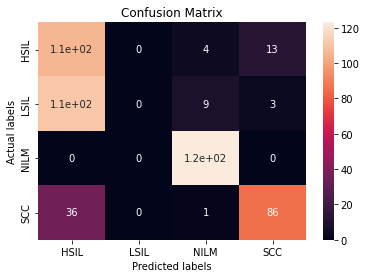

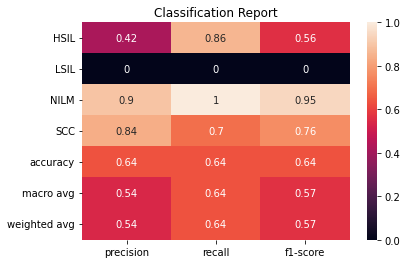

Epoch 1/25
98/98 [==============================] - 15s 87ms/step - loss: 0.7828 - accuracy: 0.7003 - val_loss: 0.5761 - val_accuracy: 0.8184
Epoch 2/25
98/98 [==============================] - 7s 67ms/step - loss: 0.5645 - accuracy: 0.8182 - val_loss: 0.5119 - val_accuracy: 0.8491
Epoch 3/25
98/98 [==============================] - 7s 67ms/step - loss: 0.5219 - accuracy: 0.8482 - val_loss: 0.4862 - val_accuracy: 0.8542
Epoch 4/25
98/98 [==============================] - 7s 67ms/step - loss: 0.5001 - accuracy: 0.8629 - val_loss: 0.4792 - val_accuracy: 0.8696
Epoch 5/25
98/98 [==============================] - 7s 67ms/step - loss: 0.4866 - accuracy: 0.8801 - val_loss: 0.4731 - val_accuracy: 0.8645
Epoch 6/25
98/98 [==============================] - 7s 67ms/step - loss: 0.4778 - accuracy: 0.8865 - val_loss: 0.4664 - val_accuracy: 0.8721
Epoch 7/25
98/98 [==============================] - 7s 67ms/step - loss: 0.4714 - accuracy: 0.8954 - val_loss: 0.4609 - val_accuracy: 0.8747
Epoch 8/25
9

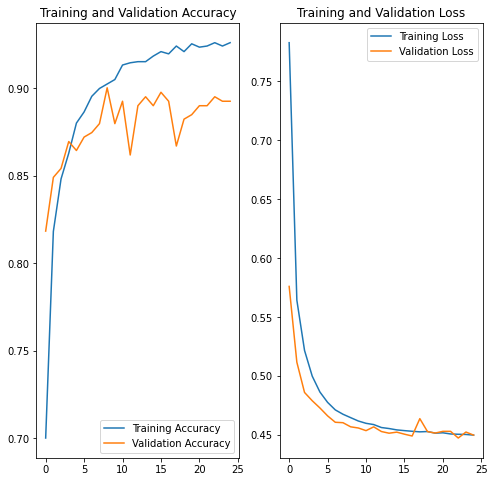

1/1 [==============================] - 2s 2s/step
[[107   5   0  11]
 [  0 123   0   0]
 [  0   1 122   0]
 [ 28   0   8  87]]
{'HSIL': {'precision': 0.7925925925925926, 'recall': 0.8699186991869918, 'f1-score': 0.8294573643410853, 'support': 123}, 'LSIL': {'precision': 0.9534883720930233, 'recall': 1.0, 'f1-score': 0.9761904761904763, 'support': 123}, 'NILM': {'precision': 0.9384615384615385, 'recall': 0.991869918699187, 'f1-score': 0.9644268774703556, 'support': 123}, 'SCC': {'precision': 0.8877551020408163, 'recall': 0.7073170731707317, 'f1-score': 0.7873303167420814, 'support': 123}, 'accuracy': 0.8922764227642277, 'macro avg': {'precision': 0.8930744012969927, 'recall': 0.8922764227642277, 'f1-score': 0.8893512586859996, 'support': 492}, 'weighted avg': {'precision': 0.8930744012969928, 'recall': 0.8922764227642277, 'f1-score': 0.8893512586859997, 'support': 492}}


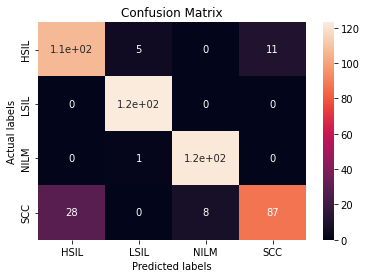

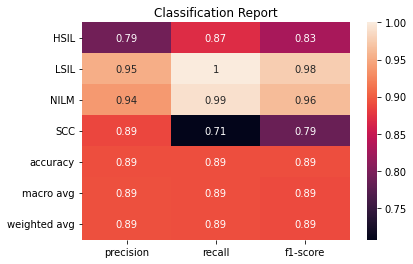

Epoch 1/25
98/98 [==============================] - 21s 123ms/step - loss: 0.9840 - accuracy: 0.4802 - val_loss: 0.8219 - val_accuracy: 0.4834
Epoch 2/25
98/98 [==============================] - 9s 92ms/step - loss: 0.7816 - accuracy: 0.5000 - val_loss: 0.7693 - val_accuracy: 0.4834
Epoch 3/25
98/98 [==============================] - 9s 93ms/step - loss: 0.7487 - accuracy: 0.5019 - val_loss: 0.7510 - val_accuracy: 0.4834
Epoch 4/25
98/98 [==============================] - 9s 92ms/step - loss: 0.7332 - accuracy: 0.5026 - val_loss: 0.7427 - val_accuracy: 0.4834
Epoch 5/25
98/98 [==============================] - 9s 93ms/step - loss: 0.7233 - accuracy: 0.5032 - val_loss: 0.7404 - val_accuracy: 0.4834
Epoch 6/25
98/98 [==============================] - 9s 93ms/step - loss: 0.7159 - accuracy: 0.5032 - val_loss: 0.7333 - val_accuracy: 0.4859
Epoch 7/25
98/98 [==============================] - 9s 93ms/step - loss: 0.7121 - accuracy: 0.5032 - val_loss: 0.7332 - val_accuracy: 0.4834
Epoch 8/25


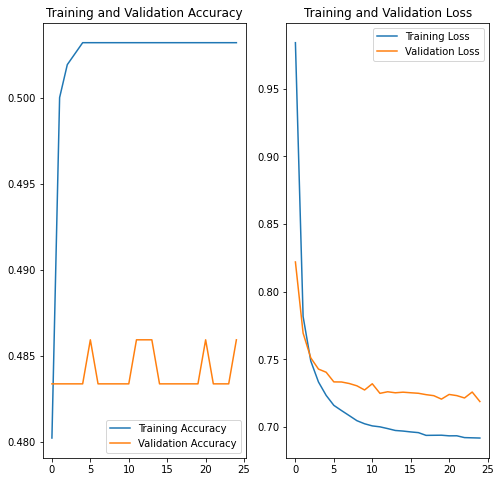

1/1 [==============================] - 3s 3s/step
[[123   0   0   0]
 [117   0   6   0]
 [  1   0 122   0]
 [119   0   4   0]]
{'HSIL': {'precision': 0.3416666666666667, 'recall': 1.0, 'f1-score': 0.5093167701863354, 'support': 123}, 'LSIL': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'NILM': {'precision': 0.9242424242424242, 'recall': 0.991869918699187, 'f1-score': 0.9568627450980391, 'support': 123}, 'SCC': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'accuracy': 0.49796747967479676, 'macro avg': {'precision': 0.3164772727272727, 'recall': 0.4979674796747967, 'f1-score': 0.36654487882109366, 'support': 492}, 'weighted avg': {'precision': 0.3164772727272727, 'recall': 0.49796747967479676, 'f1-score': 0.36654487882109366, 'support': 492}}


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

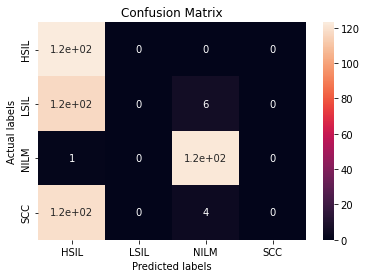

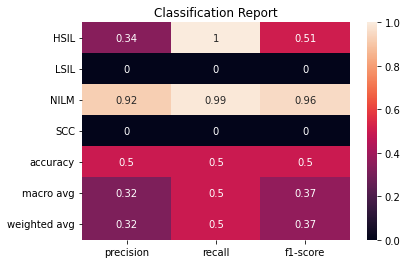

Epoch 1/25
98/98 [==============================] - 11s 47ms/step - loss: 0.8830 - accuracy: 0.6358 - val_loss: 0.6661 - val_accuracy: 0.6982
Epoch 2/25
98/98 [==============================] - 3s 32ms/step - loss: 0.6190 - accuracy: 0.7200 - val_loss: 0.5832 - val_accuracy: 0.6982
Epoch 3/25
98/98 [==============================] - 3s 31ms/step - loss: 0.5576 - accuracy: 0.7302 - val_loss: 0.5437 - val_accuracy: 0.6957
Epoch 4/25
98/98 [==============================] - 3s 32ms/step - loss: 0.5123 - accuracy: 0.7385 - val_loss: 0.5201 - val_accuracy: 0.7161
Epoch 5/25
98/98 [==============================] - 3s 31ms/step - loss: 0.4918 - accuracy: 0.7411 - val_loss: 0.5067 - val_accuracy: 0.7161
Epoch 6/25
98/98 [==============================] - 3s 31ms/step - loss: 0.4756 - accuracy: 0.7443 - val_loss: 0.4861 - val_accuracy: 0.7161
Epoch 7/25
98/98 [==============================] - 3s 31ms/step - loss: 0.4605 - accuracy: 0.7436 - val_loss: 0.4869 - val_accuracy: 0.7136
Epoch 8/25
9

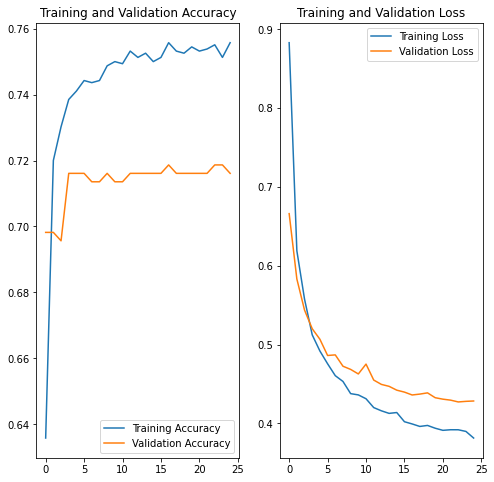

1/1 [==============================] - 2s 2s/step
[[120   3   0   0]
 [  0 123   0   0]
 [  1   0 122   0]
 [122   1   0   0]]
{'HSIL': {'precision': 0.49382716049382713, 'recall': 0.975609756097561, 'f1-score': 0.6557377049180327, 'support': 123}, 'LSIL': {'precision': 0.968503937007874, 'recall': 1.0, 'f1-score': 0.9839999999999999, 'support': 123}, 'NILM': {'precision': 1.0, 'recall': 0.991869918699187, 'f1-score': 0.9959183673469388, 'support': 123}, 'SCC': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'accuracy': 0.741869918699187, 'macro avg': {'precision': 0.6155827743754253, 'recall': 0.741869918699187, 'f1-score': 0.6589140180662428, 'support': 492}, 'weighted avg': {'precision': 0.6155827743754253, 'recall': 0.741869918699187, 'f1-score': 0.6589140180662428, 'support': 492}}


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

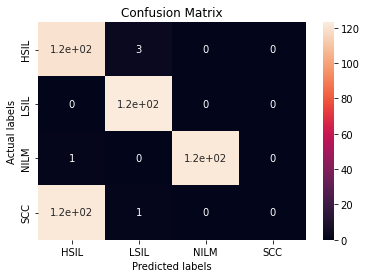

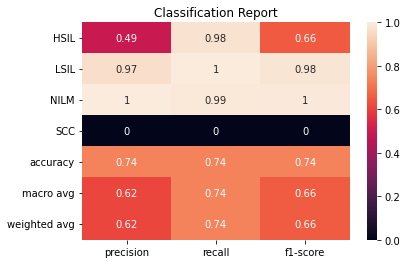

[0.6239837398373984, 0.6402439024390244, 0.8922764227642277, 0.49796747967479676, 0.741869918699187]
1/1 [==============================] - 0s 71ms/step
[0, 1, 1, 2, 2, 3, 0, 1, 1, 3, 0, 0, 1, 0, 1, 1, 0, 0, 2, 1, 3, 2, 0, 1, 1, 1, 1, 0, 1, 0, 3, 2, 0, 1, 1, 1, 0, 0, 0, 0, 2, 1, 0, 2, 2, 3, 2, 2, 3, 0, 2, 0, 3, 1, 1, 2, 3, 0, 2, 3, 3, 2, 0, 3, 1, 3, 2, 2, 1, 1, 2, 0, 3, 0, 0, 3, 1, 3, 2, 1, 1, 0, 3, 2, 0, 2, 2, 0, 1, 1, 2, 1, 0, 2, 0, 1, 2, 0, 2, 0, 3, 0, 3, 1, 0, 0, 3, 0, 3, 2, 1, 0, 2, 2, 0, 1, 0, 3, 2, 2, 3, 3, 1, 0, 1, 1, 0, 1, 2, 0, 3, 0, 0, 0, 0, 0, 1, 3, 1, 3, 1, 2, 0, 2, 1, 2, 1, 2, 0, 0, 2, 2, 0, 0, 2, 1, 0, 1, 3, 0, 2, 2, 1, 3, 0, 0, 1, 3, 3, 0, 2, 1, 0, 0, 1, 3, 1, 3, 0, 2, 2, 1, 1, 0, 2, 0, 3, 1, 1, 0, 1, 3, 2, 2, 3, 1, 0, 3, 1, 2, 0, 0, 0, 0, 2, 1, 1, 2, 1, 3, 3, 0, 0, 2, 1, 3, 3, 0, 3, 2, 1, 2, 0, 2, 0, 2, 0, 0, 0, 0, 1, 2, 0, 1, 2, 2, 2, 1, 1, 1, 1, 2, 3, 0, 2, 1, 0, 0, 0, 3, 2, 3, 1, 1, 2, 3, 0, 0, 1, 3, 1, 1, 2, 3, 0, 1, 2, 0, 3, 3, 0, 3, 1, 2, 0, 1, 0, 0, 3, 3, 1, 1, 

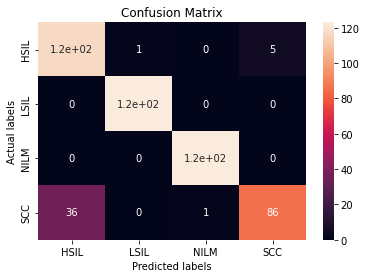

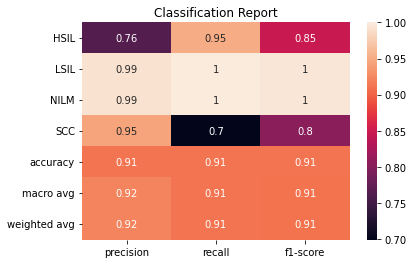

Epoch 1/25
98/98 [==============================] - 8s 50ms/step - loss: 1.2683 - accuracy: 0.3348 - val_loss: 1.1933 - val_accuracy: 0.3325
Epoch 2/25
98/98 [==============================] - 4s 40ms/step - loss: 1.2155 - accuracy: 0.3667 - val_loss: 1.1729 - val_accuracy: 0.3606
Epoch 3/25
98/98 [==============================] - 4s 40ms/step - loss: 1.1970 - accuracy: 0.3814 - val_loss: 1.1613 - val_accuracy: 0.3862
Epoch 4/25
98/98 [==============================] - 4s 40ms/step - loss: 1.1834 - accuracy: 0.3909 - val_loss: 1.1526 - val_accuracy: 0.3811
Epoch 5/25
98/98 [==============================] - 4s 40ms/step - loss: 1.1766 - accuracy: 0.3941 - val_loss: 1.1473 - val_accuracy: 0.3887
Epoch 6/25
98/98 [==============================] - 4s 40ms/step - loss: 1.1727 - accuracy: 0.3992 - val_loss: 1.1546 - val_accuracy: 0.4041
Epoch 7/25
98/98 [==============================] - 4s 40ms/step - loss: 1.1678 - accuracy: 0.4069 - val_loss: 1.1439 - val_accuracy: 0.3836
Epoch 8/25
98

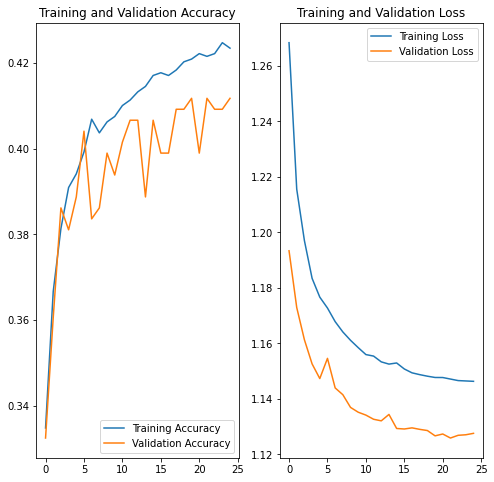

1/1 [==============================] - 1s 999ms/step
[[112   0   0  11]
 [123   0   0   0]
 [123   0   0   0]
 [ 36   0   0  87]]
{'HSIL': {'precision': 0.28426395939086296, 'recall': 0.9105691056910569, 'f1-score': 0.4332688588007737, 'support': 123}, 'LSIL': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'NILM': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'SCC': {'precision': 0.8877551020408163, 'recall': 0.7073170731707317, 'f1-score': 0.7873303167420814, 'support': 123}, 'accuracy': 0.40447154471544716, 'macro avg': {'precision': 0.2930047653579198, 'recall': 0.4044715447154471, 'f1-score': 0.3051497938857138, 'support': 492}, 'weighted avg': {'precision': 0.2930047653579198, 'recall': 0.40447154471544716, 'f1-score': 0.3051497938857138, 'support': 492}}


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

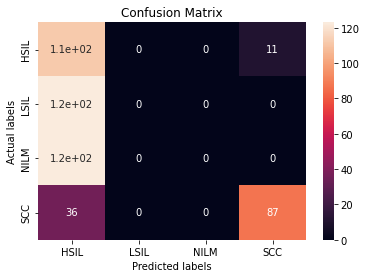

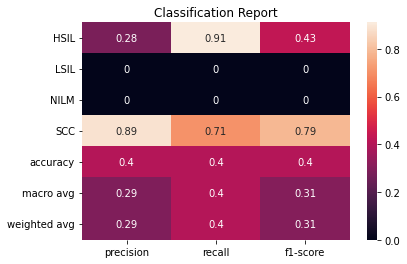

Epoch 1/25
98/98 [==============================] - 12s 62ms/step - loss: 1.3631 - accuracy: 0.2608 - val_loss: 1.2589 - val_accuracy: 0.2276
Epoch 2/25
98/98 [==============================] - 4s 42ms/step - loss: 1.2496 - accuracy: 0.2557 - val_loss: 1.2404 - val_accuracy: 0.2276
Epoch 3/25
98/98 [==============================] - 4s 42ms/step - loss: 1.2336 - accuracy: 0.2557 - val_loss: 1.2292 - val_accuracy: 0.2276
Epoch 4/25
98/98 [==============================] - 4s 42ms/step - loss: 1.2146 - accuracy: 0.2557 - val_loss: 1.2362 - val_accuracy: 0.2276
Epoch 5/25
98/98 [==============================] - 4s 42ms/step - loss: 1.1905 - accuracy: 0.2557 - val_loss: 1.2104 - val_accuracy: 0.2276
Epoch 6/25
98/98 [==============================] - 4s 42ms/step - loss: 1.1782 - accuracy: 0.2557 - val_loss: 1.1999 - val_accuracy: 0.2276
Epoch 7/25
98/98 [==============================] - 4s 43ms/step - loss: 1.1756 - accuracy: 0.2557 - val_loss: 1.2089 - val_accuracy: 0.2276
Epoch 8/25
9

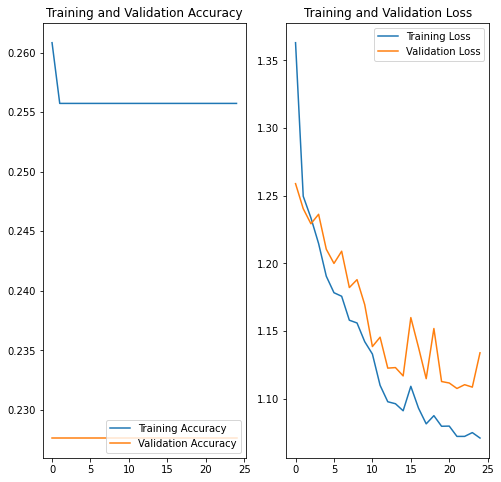

1/1 [==============================] - 2s 2s/step
[[123   0   0   0]
 [123   0   0   0]
 [123   0   0   0]
 [123   0   0   0]]
{'HSIL': {'precision': 0.25, 'recall': 1.0, 'f1-score': 0.4, 'support': 123}, 'LSIL': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'NILM': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'SCC': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'accuracy': 0.25, 'macro avg': {'precision': 0.0625, 'recall': 0.25, 'f1-score': 0.1, 'support': 492}, 'weighted avg': {'precision': 0.0625, 'recall': 0.25, 'f1-score': 0.1, 'support': 492}}


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

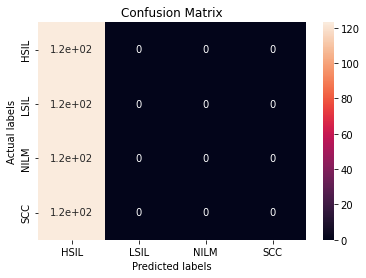

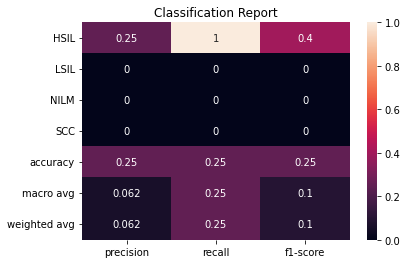

Epoch 1/25
98/98 [==============================] - 15s 87ms/step - loss: 0.7796 - accuracy: 0.7156 - val_loss: 0.5826 - val_accuracy: 0.8210
Epoch 2/25
98/98 [==============================] - 7s 67ms/step - loss: 0.5623 - accuracy: 0.8240 - val_loss: 0.5123 - val_accuracy: 0.8286
Epoch 3/25
98/98 [==============================] - 7s 67ms/step - loss: 0.5183 - accuracy: 0.8431 - val_loss: 0.4942 - val_accuracy: 0.8389
Epoch 4/25
98/98 [==============================] - 7s 67ms/step - loss: 0.4973 - accuracy: 0.8686 - val_loss: 0.4782 - val_accuracy: 0.8389
Epoch 5/25
98/98 [==============================] - 7s 67ms/step - loss: 0.4824 - accuracy: 0.8795 - val_loss: 0.4732 - val_accuracy: 0.8670
Epoch 6/25
98/98 [==============================] - 7s 67ms/step - loss: 0.4753 - accuracy: 0.8878 - val_loss: 0.4674 - val_accuracy: 0.8645
Epoch 7/25
98/98 [==============================] - 7s 67ms/step - loss: 0.4701 - accuracy: 0.8973 - val_loss: 0.4669 - val_accuracy: 0.8670
Epoch 8/25
9

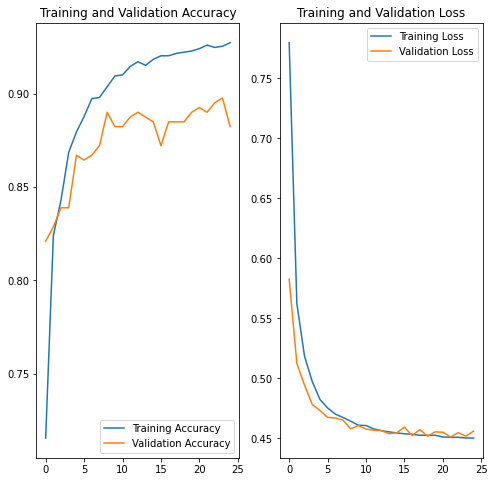

1/1 [==============================] - 2s 2s/step
[[ 95  12   0  16]
 [  0 123   0   0]
 [  0   0 123   0]
 [ 28   0   8  87]]
{'HSIL': {'precision': 0.7723577235772358, 'recall': 0.7723577235772358, 'f1-score': 0.7723577235772358, 'support': 123}, 'LSIL': {'precision': 0.9111111111111111, 'recall': 1.0, 'f1-score': 0.9534883720930233, 'support': 123}, 'NILM': {'precision': 0.9389312977099237, 'recall': 1.0, 'f1-score': 0.9685039370078741, 'support': 123}, 'SCC': {'precision': 0.8446601941747572, 'recall': 0.7073170731707317, 'f1-score': 0.7699115044247787, 'support': 123}, 'accuracy': 0.8699186991869918, 'macro avg': {'precision': 0.8667650816432569, 'recall': 0.8699186991869918, 'f1-score': 0.866065384275728, 'support': 492}, 'weighted avg': {'precision': 0.866765081643257, 'recall': 0.8699186991869918, 'f1-score': 0.866065384275728, 'support': 492}}


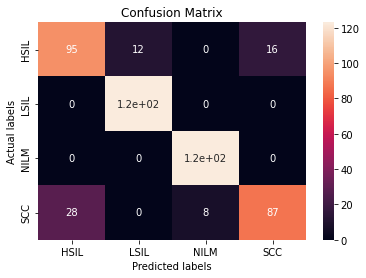

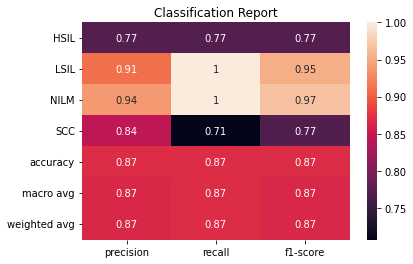

Epoch 1/25
98/98 [==============================] - 22s 129ms/step - loss: 0.7525 - accuracy: 0.6467 - val_loss: 0.5153 - val_accuracy: 0.7033
Epoch 2/25
98/98 [==============================] - 9s 93ms/step - loss: 0.4386 - accuracy: 0.7494 - val_loss: 0.4499 - val_accuracy: 0.7187
Epoch 3/25
98/98 [==============================] - 9s 94ms/step - loss: 0.3937 - accuracy: 0.7551 - val_loss: 0.4293 - val_accuracy: 0.7161
Epoch 4/25
98/98 [==============================] - 9s 94ms/step - loss: 0.3777 - accuracy: 0.7564 - val_loss: 0.4329 - val_accuracy: 0.7187
Epoch 5/25
98/98 [==============================] - 9s 94ms/step - loss: 0.3708 - accuracy: 0.7570 - val_loss: 0.4236 - val_accuracy: 0.7161
Epoch 6/25
98/98 [==============================] - 9s 93ms/step - loss: 0.3607 - accuracy: 0.7577 - val_loss: 0.4148 - val_accuracy: 0.7187
Epoch 7/25
98/98 [==============================] - 9s 93ms/step - loss: 0.3571 - accuracy: 0.7577 - val_loss: 0.4085 - val_accuracy: 0.7161
Epoch 8/25


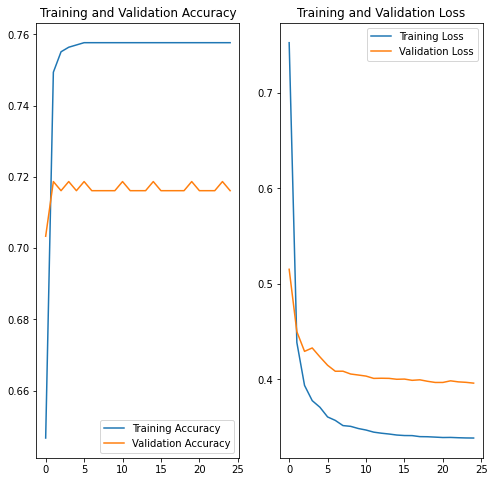

1/1 [==============================] - 3s 3s/step
[[123   0   0   0]
 [  0 123   0   0]
 [  1   0 122   0]
 [123   0   0   0]]
{'HSIL': {'precision': 0.4979757085020243, 'recall': 1.0, 'f1-score': 0.6648648648648648, 'support': 123}, 'LSIL': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 123}, 'NILM': {'precision': 1.0, 'recall': 0.991869918699187, 'f1-score': 0.9959183673469388, 'support': 123}, 'SCC': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'accuracy': 0.7479674796747967, 'macro avg': {'precision': 0.6244939271255061, 'recall': 0.7479674796747967, 'f1-score': 0.6651958080529509, 'support': 492}, 'weighted avg': {'precision': 0.624493927125506, 'recall': 0.7479674796747967, 'f1-score': 0.6651958080529509, 'support': 492}}


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

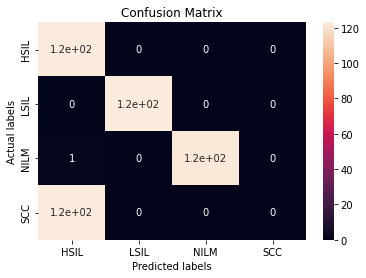

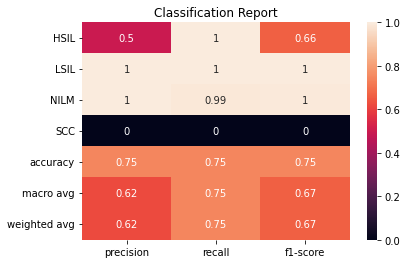

Epoch 1/25
98/98 [==============================] - 11s 48ms/step - loss: 0.7188 - accuracy: 0.7430 - val_loss: 0.4172 - val_accuracy: 0.8542
Epoch 2/25
98/98 [==============================] - 3s 32ms/step - loss: 0.3854 - accuracy: 0.8705 - val_loss: 0.3352 - val_accuracy: 0.8593
Epoch 3/25
98/98 [==============================] - 3s 32ms/step - loss: 0.2883 - accuracy: 0.9120 - val_loss: 0.1828 - val_accuracy: 0.9591
Epoch 4/25
98/98 [==============================] - 3s 31ms/step - loss: 0.2106 - accuracy: 0.9445 - val_loss: 0.1546 - val_accuracy: 0.9693
Epoch 5/25
98/98 [==============================] - 3s 32ms/step - loss: 0.1720 - accuracy: 0.9541 - val_loss: 0.1246 - val_accuracy: 0.9693
Epoch 6/25
98/98 [==============================] - 3s 31ms/step - loss: 0.1397 - accuracy: 0.9668 - val_loss: 0.1030 - val_accuracy: 0.9770
Epoch 7/25
98/98 [==============================] - 3s 32ms/step - loss: 0.1328 - accuracy: 0.9713 - val_loss: 0.0957 - val_accuracy: 0.9693
Epoch 8/25
9

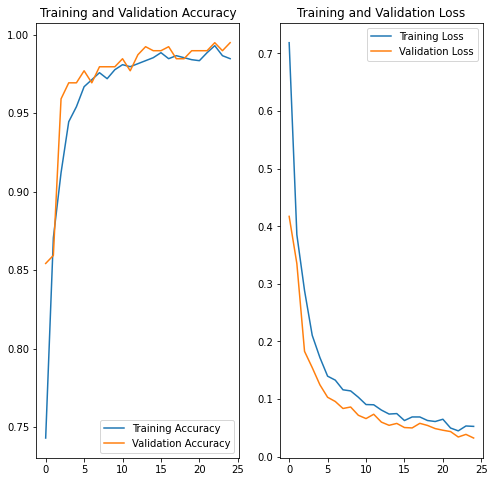

1/1 [==============================] - 2s 2s/step
[[120   0   0   3]
 [  0 123   0   0]
 [  1   0 122   0]
 [ 13   0   0 110]]
{'HSIL': {'precision': 0.8955223880597015, 'recall': 0.975609756097561, 'f1-score': 0.933852140077821, 'support': 123}, 'LSIL': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 123}, 'NILM': {'precision': 1.0, 'recall': 0.991869918699187, 'f1-score': 0.9959183673469388, 'support': 123}, 'SCC': {'precision': 0.9734513274336283, 'recall': 0.8943089430894309, 'f1-score': 0.9322033898305085, 'support': 123}, 'accuracy': 0.9654471544715447, 'macro avg': {'precision': 0.9672434288733325, 'recall': 0.9654471544715446, 'f1-score': 0.9654934743138172, 'support': 492}, 'weighted avg': {'precision': 0.9672434288733324, 'recall': 0.9654471544715447, 'f1-score': 0.965493474313817, 'support': 492}}


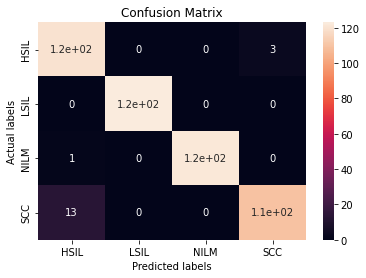

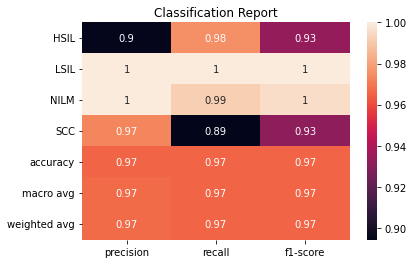

[0.40447154471544716, 0.25, 0.8699186991869918, 0.7479674796747967, 0.9654471544715447]
1/1 [==============================] - 0s 72ms/step
[0, 1, 1, 2, 2, 3, 0, 1, 1, 3, 0, 0, 1, 0, 1, 1, 0, 0, 2, 1, 3, 2, 0, 1, 1, 1, 1, 0, 1, 0, 3, 2, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 2, 2, 3, 2, 2, 0, 0, 2, 0, 3, 1, 1, 2, 3, 0, 2, 3, 3, 2, 0, 3, 1, 3, 0, 2, 1, 1, 2, 0, 3, 0, 0, 0, 1, 3, 2, 1, 1, 0, 3, 2, 0, 2, 2, 0, 1, 0, 2, 1, 0, 2, 0, 1, 2, 0, 2, 0, 0, 0, 3, 1, 0, 0, 3, 0, 3, 2, 1, 0, 2, 2, 0, 1, 0, 0, 2, 2, 0, 3, 1, 0, 1, 1, 0, 1, 2, 0, 3, 0, 0, 0, 0, 0, 1, 3, 1, 3, 1, 2, 0, 2, 1, 2, 1, 2, 0, 0, 2, 2, 0, 0, 2, 1, 0, 1, 3, 0, 2, 2, 1, 3, 0, 0, 1, 3, 0, 0, 2, 1, 0, 0, 1, 3, 1, 3, 0, 2, 2, 1, 1, 0, 2, 0, 3, 1, 1, 0, 1, 3, 2, 2, 3, 1, 0, 3, 1, 2, 0, 0, 0, 0, 2, 1, 1, 2, 1, 3, 3, 0, 0, 2, 1, 3, 3, 0, 0, 2, 1, 0, 0, 2, 0, 2, 0, 0, 0, 0, 1, 2, 0, 1, 2, 2, 2, 1, 1, 1, 1, 2, 3, 0, 2, 1, 0, 0, 0, 3, 2, 3, 1, 1, 2, 3, 0, 0, 1, 3, 1, 1, 2, 3, 0, 1, 2, 0, 3, 3, 0, 3, 1, 2, 0, 1, 0, 0, 3, 3, 1, 1, 2, 1, 0, 0, 1

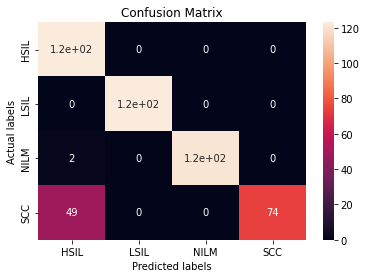

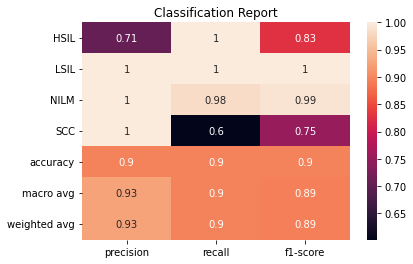

Epoch 1/25
98/98 [==============================] - 10s 51ms/step - loss: 0.4574 - accuracy: 0.8265 - val_loss: 0.2001 - val_accuracy: 0.9565
Epoch 2/25
98/98 [==============================] - 4s 40ms/step - loss: 0.1556 - accuracy: 0.9598 - val_loss: 0.1288 - val_accuracy: 0.9821
Epoch 3/25
98/98 [==============================] - 4s 40ms/step - loss: 0.1008 - accuracy: 0.9809 - val_loss: 0.0762 - val_accuracy: 0.9795
Epoch 4/25
98/98 [==============================] - 4s 40ms/step - loss: 0.0764 - accuracy: 0.9834 - val_loss: 0.0579 - val_accuracy: 0.9872
Epoch 5/25
98/98 [==============================] - 4s 41ms/step - loss: 0.0567 - accuracy: 0.9879 - val_loss: 0.0488 - val_accuracy: 0.9898
Epoch 6/25
98/98 [==============================] - 4s 40ms/step - loss: 0.0456 - accuracy: 0.9923 - val_loss: 0.0427 - val_accuracy: 0.9898
Epoch 7/25
98/98 [==============================] - 4s 41ms/step - loss: 0.0383 - accuracy: 0.9949 - val_loss: 0.0376 - val_accuracy: 0.9923
Epoch 8/25
9

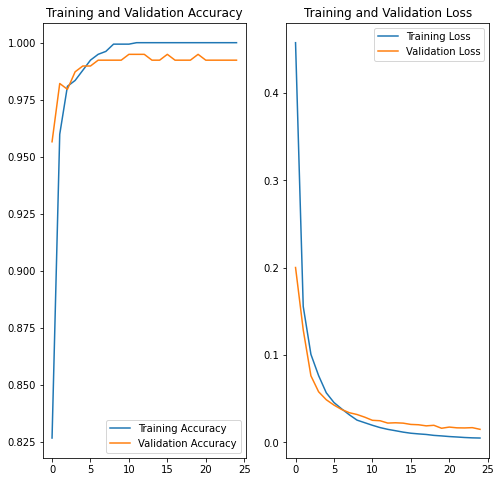

1/1 [==============================] - 1s 1s/step
[[121   1   0   1]
 [  0 123   0   0]
 [  0   0 123   0]
 [  1   0   0 122]]
{'HSIL': {'precision': 0.9918032786885246, 'recall': 0.983739837398374, 'f1-score': 0.9877551020408164, 'support': 123}, 'LSIL': {'precision': 0.9919354838709677, 'recall': 1.0, 'f1-score': 0.9959514170040485, 'support': 123}, 'NILM': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 123}, 'SCC': {'precision': 0.991869918699187, 'recall': 0.991869918699187, 'f1-score': 0.991869918699187, 'support': 123}, 'accuracy': 0.9939024390243902, 'macro avg': {'precision': 0.9939021703146698, 'recall': 0.9939024390243902, 'f1-score': 0.993894109436013, 'support': 492}, 'weighted avg': {'precision': 0.9939021703146698, 'recall': 0.9939024390243902, 'f1-score': 0.993894109436013, 'support': 492}}


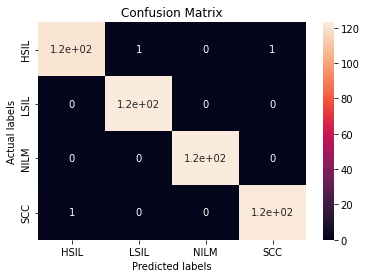

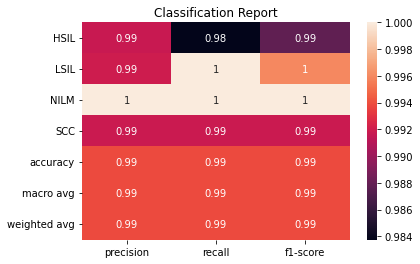

Epoch 1/25
98/98 [==============================] - 13s 62ms/step - loss: 1.4894 - accuracy: 0.2602 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 2/25
98/98 [==============================] - 4s 42ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 3/25
98/98 [==============================] - 4s 42ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 4/25
98/98 [==============================] - 4s 42ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 5/25
98/98 [==============================] - 4s 43ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 6/25
98/98 [==============================] - 4s 43ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 7/25
98/98 [==============================] - 4s 42ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 8/25
9

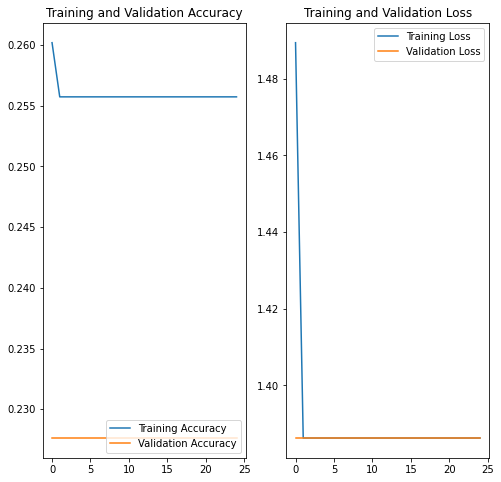

1/1 [==============================] - 2s 2s/step
[[123   0   0   0]
 [123   0   0   0]
 [123   0   0   0]
 [123   0   0   0]]
{'HSIL': {'precision': 0.25, 'recall': 1.0, 'f1-score': 0.4, 'support': 123}, 'LSIL': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'NILM': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'SCC': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'accuracy': 0.25, 'macro avg': {'precision': 0.0625, 'recall': 0.25, 'f1-score': 0.1, 'support': 492}, 'weighted avg': {'precision': 0.0625, 'recall': 0.25, 'f1-score': 0.1, 'support': 492}}


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

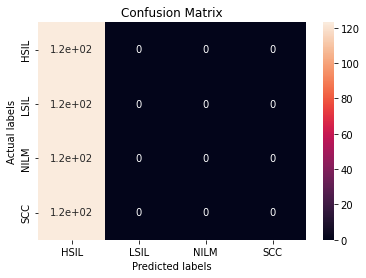

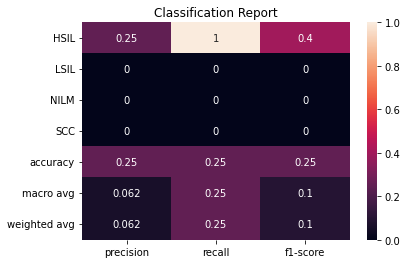

Epoch 1/25
98/98 [==============================] - 15s 88ms/step - loss: 1.3897 - accuracy: 0.2513 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 2/25
98/98 [==============================] - 7s 67ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 3/25
98/98 [==============================] - 7s 67ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 4/25
98/98 [==============================] - 7s 67ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 5/25
98/98 [==============================] - 7s 67ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 6/25
98/98 [==============================] - 7s 67ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 7/25
98/98 [==============================] - 7s 67ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 8/25
9

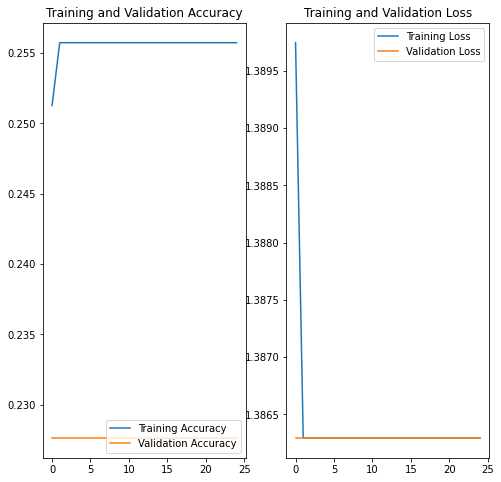

1/1 [==============================] - 2s 2s/step
[[123   0   0   0]
 [123   0   0   0]
 [123   0   0   0]
 [123   0   0   0]]
{'HSIL': {'precision': 0.25, 'recall': 1.0, 'f1-score': 0.4, 'support': 123}, 'LSIL': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'NILM': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'SCC': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'accuracy': 0.25, 'macro avg': {'precision': 0.0625, 'recall': 0.25, 'f1-score': 0.1, 'support': 492}, 'weighted avg': {'precision': 0.0625, 'recall': 0.25, 'f1-score': 0.1, 'support': 492}}


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

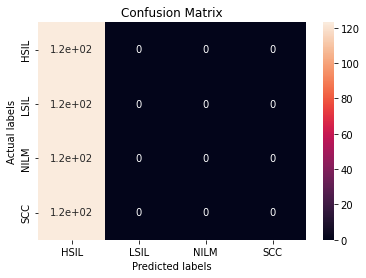

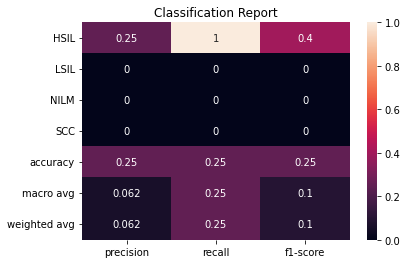

Epoch 1/25
98/98 [==============================] - 22s 123ms/step - loss: 0.4122 - accuracy: 0.8540 - val_loss: 0.1448 - val_accuracy: 0.9693
Epoch 2/25
98/98 [==============================] - 9s 93ms/step - loss: 0.1112 - accuracy: 0.9719 - val_loss: 0.0827 - val_accuracy: 0.9847
Epoch 3/25
98/98 [==============================] - 9s 93ms/step - loss: 0.0653 - accuracy: 0.9853 - val_loss: 0.0501 - val_accuracy: 0.9923
Epoch 4/25
98/98 [==============================] - 9s 95ms/step - loss: 0.0449 - accuracy: 0.9943 - val_loss: 0.0431 - val_accuracy: 0.9898
Epoch 5/25
98/98 [==============================] - 9s 94ms/step - loss: 0.0347 - accuracy: 0.9955 - val_loss: 0.0329 - val_accuracy: 0.9923
Epoch 6/25
98/98 [==============================] - 9s 93ms/step - loss: 0.0247 - accuracy: 0.9987 - val_loss: 0.0273 - val_accuracy: 0.9923
Epoch 7/25
98/98 [==============================] - 9s 93ms/step - loss: 0.0201 - accuracy: 1.0000 - val_loss: 0.0285 - val_accuracy: 0.9949
Epoch 8/25


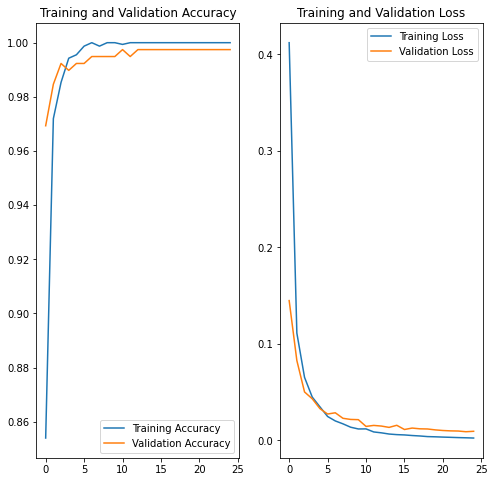

1/1 [==============================] - 3s 3s/step
[[121   0   0   2]
 [  0 123   0   0]
 [  2   0 120   1]
 [  0   0   0 123]]
{'HSIL': {'precision': 0.983739837398374, 'recall': 0.983739837398374, 'f1-score': 0.983739837398374, 'support': 123}, 'LSIL': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 123}, 'NILM': {'precision': 1.0, 'recall': 0.975609756097561, 'f1-score': 0.9876543209876543, 'support': 123}, 'SCC': {'precision': 0.9761904761904762, 'recall': 1.0, 'f1-score': 0.9879518072289156, 'support': 123}, 'accuracy': 0.9898373983739838, 'macro avg': {'precision': 0.9899825783972126, 'recall': 0.9898373983739838, 'f1-score': 0.989836491403736, 'support': 492}, 'weighted avg': {'precision': 0.9899825783972125, 'recall': 0.9898373983739838, 'f1-score': 0.989836491403736, 'support': 492}}


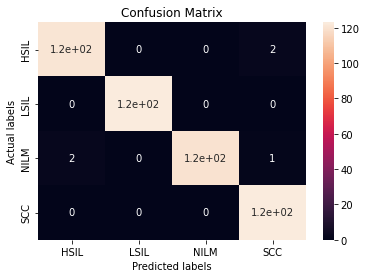

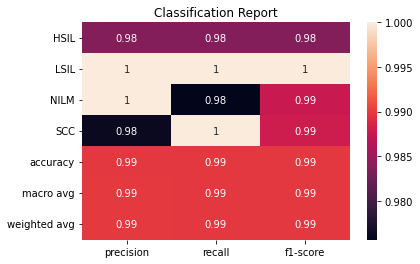

Epoch 1/25
98/98 [==============================] - 11s 47ms/step - loss: 0.8388 - accuracy: 0.6741 - val_loss: 0.5719 - val_accuracy: 0.7647
Epoch 2/25
98/98 [==============================] - 3s 32ms/step - loss: 0.4051 - accuracy: 0.8744 - val_loss: 0.2479 - val_accuracy: 0.9386
Epoch 3/25
98/98 [==============================] - 3s 31ms/step - loss: 0.2465 - accuracy: 0.9375 - val_loss: 0.1900 - val_accuracy: 0.9540
Epoch 4/25
98/98 [==============================] - 3s 32ms/step - loss: 0.1997 - accuracy: 0.9534 - val_loss: 0.1461 - val_accuracy: 0.9642
Epoch 5/25
98/98 [==============================] - 3s 32ms/step - loss: 0.1704 - accuracy: 0.9598 - val_loss: 0.1277 - val_accuracy: 0.9668
Epoch 6/25
98/98 [==============================] - 3s 32ms/step - loss: 0.1446 - accuracy: 0.9636 - val_loss: 0.1123 - val_accuracy: 0.9642
Epoch 7/25
98/98 [==============================] - 3s 32ms/step - loss: 0.1412 - accuracy: 0.9579 - val_loss: 0.0983 - val_accuracy: 0.9821
Epoch 8/25
9

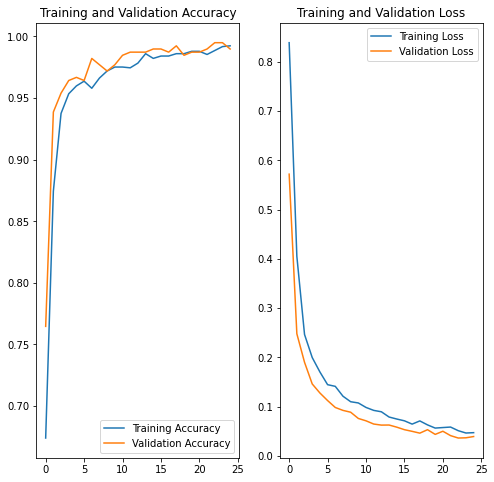

1/1 [==============================] - 2s 2s/step
[[121   0   0   2]
 [  0 123   0   0]
 [  0   0 123   0]
 [  7   0   0 116]]
{'HSIL': {'precision': 0.9453125, 'recall': 0.983739837398374, 'f1-score': 0.9641434262948206, 'support': 123}, 'LSIL': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 123}, 'NILM': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 123}, 'SCC': {'precision': 0.9830508474576272, 'recall': 0.943089430894309, 'f1-score': 0.9626556016597511, 'support': 123}, 'accuracy': 0.9817073170731707, 'macro avg': {'precision': 0.9820908368644068, 'recall': 0.9817073170731707, 'f1-score': 0.981699756988643, 'support': 492}, 'weighted avg': {'precision': 0.9820908368644068, 'recall': 0.9817073170731707, 'f1-score': 0.981699756988643, 'support': 492}}


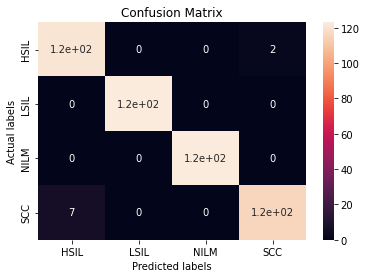

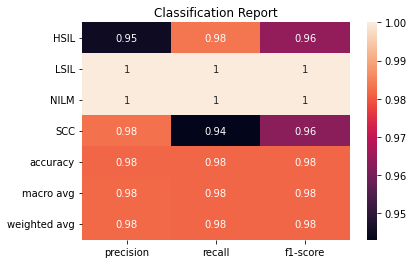

[0.9939024390243902, 0.25, 0.25, 0.9898373983739838, 0.9817073170731707]
1/1 [==============================] - 0s 69ms/step
[0, 1, 1, 2, 2, 3, 0, 1, 1, 3, 3, 0, 1, 0, 1, 1, 0, 0, 2, 1, 3, 2, 0, 1, 1, 1, 1, 3, 1, 0, 3, 2, 3, 1, 1, 1, 0, 0, 3, 0, 2, 1, 0, 0, 2, 3, 2, 2, 0, 0, 2, 0, 3, 1, 1, 2, 3, 0, 2, 3, 3, 2, 0, 3, 1, 3, 3, 2, 1, 1, 2, 0, 3, 3, 0, 0, 1, 3, 2, 1, 1, 3, 3, 2, 3, 2, 2, 0, 1, 0, 2, 1, 0, 2, 0, 1, 2, 0, 2, 0, 0, 0, 3, 1, 3, 3, 3, 0, 3, 2, 1, 0, 2, 2, 0, 1, 0, 0, 2, 2, 0, 3, 1, 3, 1, 1, 0, 1, 2, 3, 3, 3, 0, 0, 0, 0, 1, 3, 1, 3, 1, 2, 0, 2, 1, 2, 1, 2, 0, 3, 2, 2, 0, 0, 2, 1, 0, 1, 3, 0, 2, 2, 1, 3, 0, 0, 1, 3, 3, 3, 2, 1, 0, 0, 1, 3, 1, 3, 3, 2, 2, 1, 1, 0, 2, 0, 3, 1, 1, 0, 1, 3, 2, 2, 3, 1, 0, 3, 1, 2, 3, 0, 0, 0, 2, 1, 1, 2, 1, 3, 3, 0, 3, 2, 1, 3, 3, 0, 0, 2, 1, 0, 0, 2, 3, 2, 0, 0, 0, 3, 1, 2, 0, 1, 2, 2, 2, 1, 1, 1, 1, 2, 3, 0, 2, 1, 0, 3, 0, 3, 2, 3, 1, 1, 2, 3, 3, 0, 1, 3, 1, 1, 2, 3, 3, 1, 2, 3, 3, 3, 0, 3, 1, 2, 0, 1, 0, 0, 3, 3, 1, 1, 2, 1, 0, 0, 1, 2, 2, 1, 2, 3

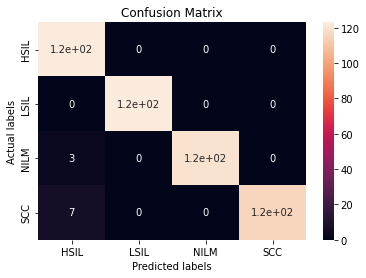

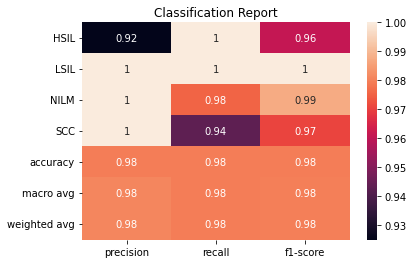

Epoch 1/25
98/98 [==============================] - 8s 50ms/step - loss: 0.7695 - accuracy: 0.7079 - val_loss: 0.5830 - val_accuracy: 0.8082
Epoch 2/25
98/98 [==============================] - 4s 40ms/step - loss: 0.5702 - accuracy: 0.8157 - val_loss: 0.5482 - val_accuracy: 0.8696
Epoch 3/25
98/98 [==============================] - 4s 40ms/step - loss: 0.5355 - accuracy: 0.8438 - val_loss: 0.5109 - val_accuracy: 0.8696
Epoch 4/25
98/98 [==============================] - 4s 40ms/step - loss: 0.5104 - accuracy: 0.8635 - val_loss: 0.4890 - val_accuracy: 0.8593
Epoch 5/25
98/98 [==============================] - 4s 40ms/step - loss: 0.4931 - accuracy: 0.8724 - val_loss: 0.4782 - val_accuracy: 0.8645
Epoch 6/25
98/98 [==============================] - 4s 40ms/step - loss: 0.4844 - accuracy: 0.8846 - val_loss: 0.4717 - val_accuracy: 0.8619
Epoch 7/25
98/98 [==============================] - 4s 40ms/step - loss: 0.4789 - accuracy: 0.8878 - val_loss: 0.4679 - val_accuracy: 0.8849
Epoch 8/25
98

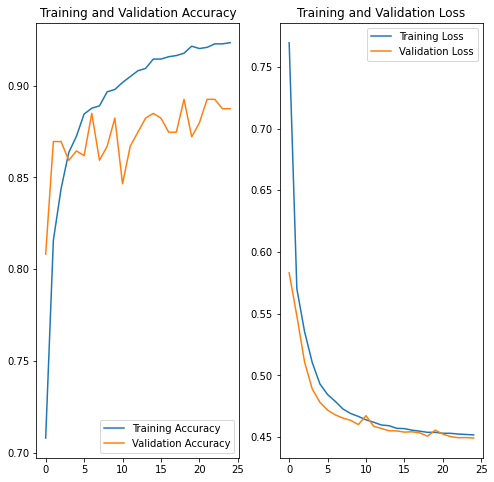

1/1 [==============================] - 1s 1s/step
[[ 89  12   2  20]
 [  0 123   0   0]
 [  0   0 123   0]
 [ 32   4   0  87]]
{'HSIL': {'precision': 0.7355371900826446, 'recall': 0.7235772357723578, 'f1-score': 0.7295081967213114, 'support': 123}, 'LSIL': {'precision': 0.8848920863309353, 'recall': 1.0, 'f1-score': 0.9389312977099237, 'support': 123}, 'NILM': {'precision': 0.984, 'recall': 1.0, 'f1-score': 0.9919354838709677, 'support': 123}, 'SCC': {'precision': 0.8130841121495327, 'recall': 0.7073170731707317, 'f1-score': 0.7565217391304349, 'support': 123}, 'accuracy': 0.8577235772357723, 'macro avg': {'precision': 0.8543783471407781, 'recall': 0.8577235772357723, 'f1-score': 0.8542241793581594, 'support': 492}, 'weighted avg': {'precision': 0.8543783471407781, 'recall': 0.8577235772357723, 'f1-score': 0.8542241793581593, 'support': 492}}


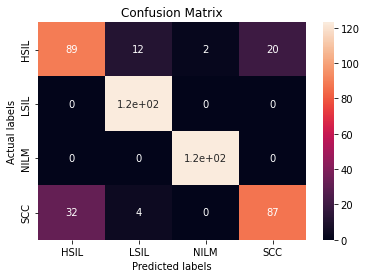

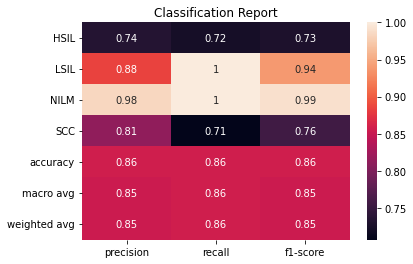

Epoch 1/25
98/98 [==============================] - 12s 62ms/step - loss: 1.4298 - accuracy: 0.2589 - val_loss: 1.3196 - val_accuracy: 0.2276
Epoch 2/25
98/98 [==============================] - 4s 42ms/step - loss: 1.3134 - accuracy: 0.2557 - val_loss: 1.2974 - val_accuracy: 0.2276
Epoch 3/25
98/98 [==============================] - 4s 42ms/step - loss: 1.2275 - accuracy: 0.2557 - val_loss: 1.2023 - val_accuracy: 0.2276
Epoch 4/25
98/98 [==============================] - 4s 42ms/step - loss: 1.1717 - accuracy: 0.2557 - val_loss: 1.2031 - val_accuracy: 0.2276
Epoch 5/25
98/98 [==============================] - 4s 42ms/step - loss: 1.1646 - accuracy: 0.2557 - val_loss: 1.1804 - val_accuracy: 0.2276
Epoch 6/25
98/98 [==============================] - 4s 42ms/step - loss: 1.1460 - accuracy: 0.2557 - val_loss: 1.1642 - val_accuracy: 0.2276
Epoch 7/25
98/98 [==============================] - 4s 43ms/step - loss: 1.1702 - accuracy: 0.2557 - val_loss: 1.1701 - val_accuracy: 0.2276
Epoch 8/25
9

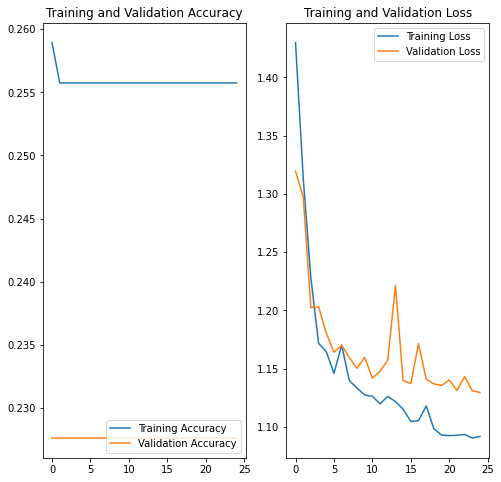

1/1 [==============================] - 2s 2s/step
[[123   0   0   0]
 [123   0   0   0]
 [123   0   0   0]
 [123   0   0   0]]
{'HSIL': {'precision': 0.25, 'recall': 1.0, 'f1-score': 0.4, 'support': 123}, 'LSIL': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'NILM': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'SCC': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'accuracy': 0.25, 'macro avg': {'precision': 0.0625, 'recall': 0.25, 'f1-score': 0.1, 'support': 492}, 'weighted avg': {'precision': 0.0625, 'recall': 0.25, 'f1-score': 0.1, 'support': 492}}


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

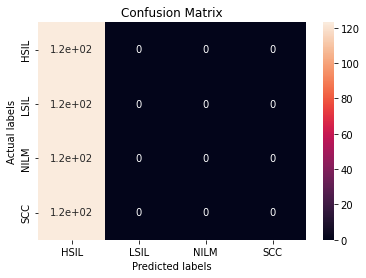

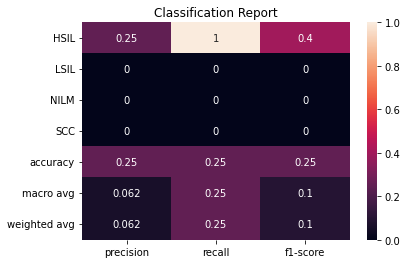

Epoch 1/25
98/98 [==============================] - 15s 88ms/step - loss: 0.4399 - accuracy: 0.8412 - val_loss: 0.1665 - val_accuracy: 0.9693
Epoch 2/25
98/98 [==============================] - 7s 67ms/step - loss: 0.1381 - accuracy: 0.9694 - val_loss: 0.1077 - val_accuracy: 0.9770
Epoch 3/25
98/98 [==============================] - 7s 68ms/step - loss: 0.0866 - accuracy: 0.9847 - val_loss: 0.0727 - val_accuracy: 0.9872
Epoch 4/25
98/98 [==============================] - 7s 67ms/step - loss: 0.0621 - accuracy: 0.9923 - val_loss: 0.0586 - val_accuracy: 0.9872
Epoch 5/25
98/98 [==============================] - 7s 67ms/step - loss: 0.0468 - accuracy: 0.9923 - val_loss: 0.0485 - val_accuracy: 0.9898
Epoch 6/25
98/98 [==============================] - 7s 67ms/step - loss: 0.0368 - accuracy: 0.9962 - val_loss: 0.0413 - val_accuracy: 0.9898
Epoch 7/25
98/98 [==============================] - 7s 67ms/step - loss: 0.0296 - accuracy: 0.9987 - val_loss: 0.0360 - val_accuracy: 0.9898
Epoch 8/25
9

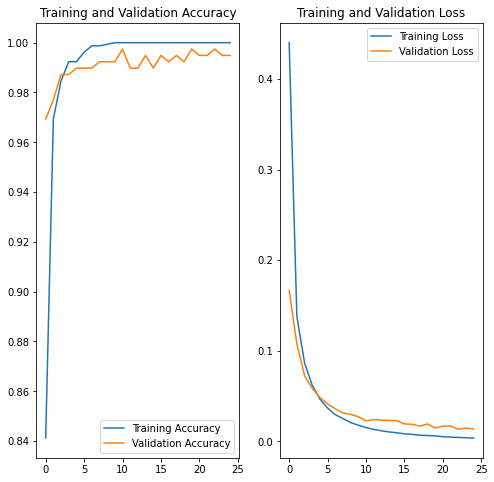

1/1 [==============================] - 2s 2s/step
[[119   1   0   3]
 [  0 123   0   0]
 [  0   0 123   0]
 [  5   0   0 118]]
{'HSIL': {'precision': 0.9596774193548387, 'recall': 0.967479674796748, 'f1-score': 0.9635627530364373, 'support': 123}, 'LSIL': {'precision': 0.9919354838709677, 'recall': 1.0, 'f1-score': 0.9959514170040485, 'support': 123}, 'NILM': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 123}, 'SCC': {'precision': 0.9752066115702479, 'recall': 0.959349593495935, 'f1-score': 0.9672131147540983, 'support': 123}, 'accuracy': 0.9817073170731707, 'macro avg': {'precision': 0.9817048786990136, 'recall': 0.9817073170731708, 'f1-score': 0.9816818211986461, 'support': 492}, 'weighted avg': {'precision': 0.9817048786990137, 'recall': 0.9817073170731707, 'f1-score': 0.9816818211986461, 'support': 492}}


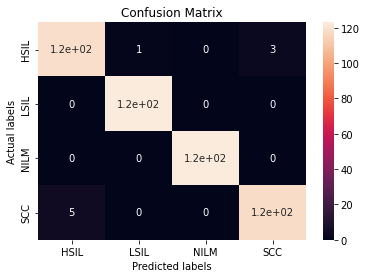

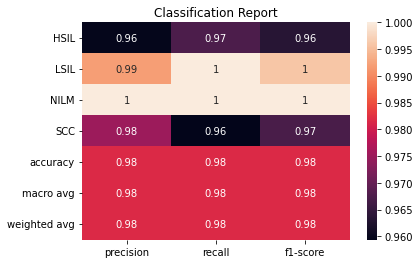

Epoch 1/25
98/98 [==============================] - 21s 123ms/step - loss: 1.1121 - accuracy: 0.4668 - val_loss: 1.0529 - val_accuracy: 0.4808
Epoch 2/25
98/98 [==============================] - 9s 94ms/step - loss: 1.0612 - accuracy: 0.4917 - val_loss: 1.0448 - val_accuracy: 0.4808
Epoch 3/25
98/98 [==============================] - 9s 94ms/step - loss: 1.0531 - accuracy: 0.4949 - val_loss: 1.0362 - val_accuracy: 0.4808
Epoch 4/25
98/98 [==============================] - 9s 94ms/step - loss: 1.0487 - accuracy: 0.4974 - val_loss: 1.0366 - val_accuracy: 0.4859
Epoch 5/25
98/98 [==============================] - 9s 94ms/step - loss: 1.0494 - accuracy: 0.4981 - val_loss: 1.0320 - val_accuracy: 0.4757
Epoch 6/25
98/98 [==============================] - 9s 94ms/step - loss: 1.0458 - accuracy: 0.4994 - val_loss: 1.0314 - val_accuracy: 0.4808
Epoch 7/25
98/98 [==============================] - 9s 94ms/step - loss: 1.0455 - accuracy: 0.5006 - val_loss: 1.0317 - val_accuracy: 0.4859
Epoch 8/25


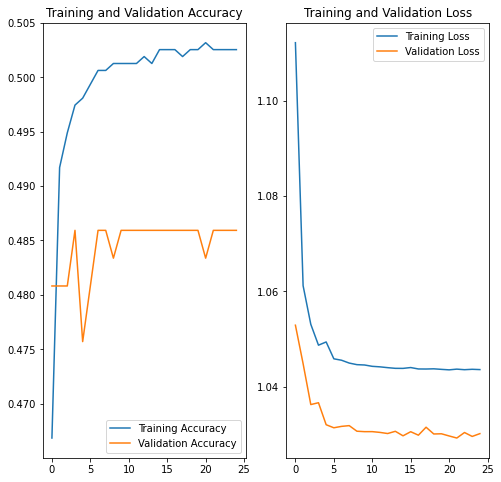

1/1 [==============================] - 3s 3s/step
[[122   0   1   0]
 [118   0   5   0]
 [  1   0 122   0]
 [122   0   1   0]]
{'HSIL': {'precision': 0.33608815426997246, 'recall': 0.991869918699187, 'f1-score': 0.5020576131687243, 'support': 123}, 'LSIL': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'NILM': {'precision': 0.9457364341085271, 'recall': 0.991869918699187, 'f1-score': 0.9682539682539683, 'support': 123}, 'SCC': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'accuracy': 0.4959349593495935, 'macro avg': {'precision': 0.3204561470946249, 'recall': 0.4959349593495935, 'f1-score': 0.36757789535567315, 'support': 492}, 'weighted avg': {'precision': 0.3204561470946249, 'recall': 0.4959349593495935, 'f1-score': 0.36757789535567315, 'support': 492}}


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

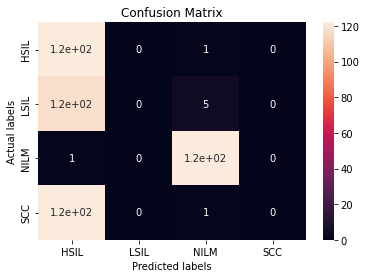

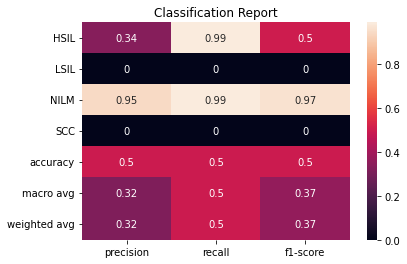

Epoch 1/25
98/98 [==============================] - 11s 47ms/step - loss: 0.9590 - accuracy: 0.5459 - val_loss: 0.7666 - val_accuracy: 0.5831
Epoch 2/25
98/98 [==============================] - 3s 31ms/step - loss: 0.7244 - accuracy: 0.6161 - val_loss: 0.6823 - val_accuracy: 0.6215
Epoch 3/25
98/98 [==============================] - 3s 31ms/step - loss: 0.6655 - accuracy: 0.6365 - val_loss: 0.6415 - val_accuracy: 0.6266
Epoch 4/25
98/98 [==============================] - 3s 32ms/step - loss: 0.6290 - accuracy: 0.6448 - val_loss: 0.6215 - val_accuracy: 0.6266
Epoch 5/25
98/98 [==============================] - 3s 31ms/step - loss: 0.6127 - accuracy: 0.6492 - val_loss: 0.5984 - val_accuracy: 0.6292
Epoch 6/25
98/98 [==============================] - 3s 32ms/step - loss: 0.5769 - accuracy: 0.6575 - val_loss: 0.5905 - val_accuracy: 0.6343
Epoch 7/25
98/98 [==============================] - 3s 32ms/step - loss: 0.5712 - accuracy: 0.6601 - val_loss: 0.5805 - val_accuracy: 0.6292
Epoch 8/25
9

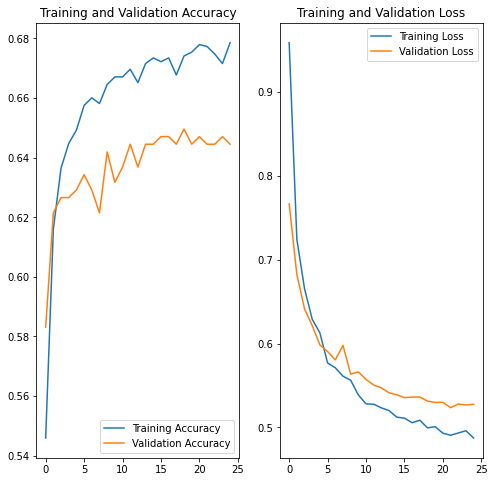

1/1 [==============================] - 2s 2s/step
[[111   0   0  12]
 [  0 123   0   0]
 [119   3   0   1]
 [ 42   0   0  81]]
{'HSIL': {'precision': 0.40808823529411764, 'recall': 0.9024390243902439, 'f1-score': 0.5620253164556962, 'support': 123}, 'LSIL': {'precision': 0.9761904761904762, 'recall': 1.0, 'f1-score': 0.9879518072289156, 'support': 123}, 'NILM': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'SCC': {'precision': 0.8617021276595744, 'recall': 0.6585365853658537, 'f1-score': 0.7465437788018433, 'support': 123}, 'accuracy': 0.6402439024390244, 'macro avg': {'precision': 0.5614952097860421, 'recall': 0.6402439024390244, 'f1-score': 0.5741302256216138, 'support': 492}, 'weighted avg': {'precision': 0.5614952097860421, 'recall': 0.6402439024390244, 'f1-score': 0.5741302256216138, 'support': 492}}


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

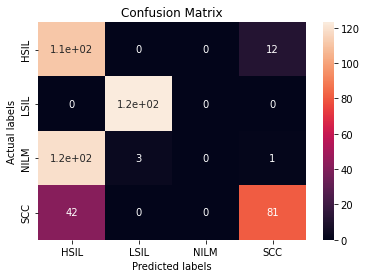

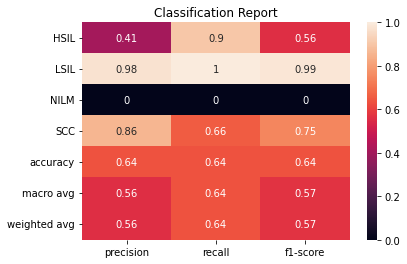

[0.8577235772357723, 0.25, 0.9817073170731707, 0.4959349593495935, 0.6402439024390244]
1/1 [==============================] - 0s 70ms/step
[0, 1, 1, 2, 2, 3, 0, 1, 1, 3, 0, 0, 1, 0, 1, 1, 0, 0, 2, 1, 3, 2, 0, 1, 1, 1, 1, 0, 1, 0, 3, 2, 0, 1, 1, 1, 0, 0, 0, 0, 2, 1, 0, 2, 2, 3, 2, 2, 0, 0, 2, 0, 3, 1, 1, 2, 3, 0, 2, 3, 3, 2, 0, 3, 1, 3, 0, 2, 1, 1, 2, 0, 3, 0, 0, 3, 1, 3, 2, 1, 1, 0, 3, 2, 0, 2, 2, 0, 1, 0, 2, 1, 0, 2, 0, 1, 2, 0, 2, 0, 0, 0, 3, 1, 0, 0, 3, 0, 3, 2, 1, 0, 2, 2, 0, 1, 0, 0, 2, 2, 0, 3, 1, 0, 1, 1, 0, 1, 2, 0, 3, 0, 0, 0, 0, 0, 1, 3, 1, 3, 1, 2, 0, 2, 1, 2, 1, 2, 0, 0, 2, 2, 0, 0, 2, 1, 0, 1, 3, 0, 2, 2, 1, 3, 0, 0, 1, 3, 3, 0, 2, 1, 0, 0, 1, 3, 1, 3, 0, 2, 2, 1, 1, 0, 2, 0, 3, 1, 1, 0, 1, 3, 2, 2, 3, 1, 0, 3, 1, 2, 0, 0, 0, 0, 2, 1, 1, 2, 1, 3, 3, 0, 0, 2, 1, 3, 3, 0, 0, 2, 1, 0, 0, 2, 0, 2, 0, 0, 0, 0, 1, 2, 0, 1, 2, 2, 2, 1, 1, 1, 1, 2, 3, 0, 2, 1, 0, 0, 0, 3, 2, 3, 1, 1, 2, 3, 0, 0, 1, 3, 1, 1, 2, 3, 0, 1, 2, 0, 3, 3, 0, 3, 1, 2, 0, 1, 0, 0, 3, 3, 1, 1, 2, 1, 0, 0, 1,

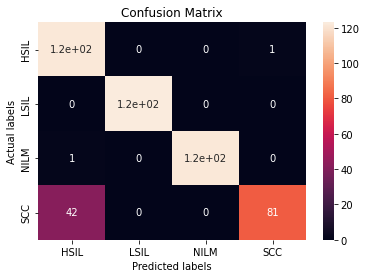

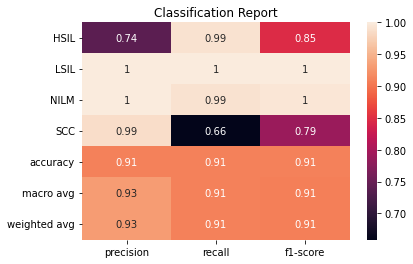

Epoch 1/25
98/98 [==============================] - 8s 51ms/step - loss: 1.0745 - accuracy: 0.4764 - val_loss: 0.8806 - val_accuracy: 0.6419
Epoch 2/25
98/98 [==============================] - 4s 40ms/step - loss: 0.9048 - accuracy: 0.5957 - val_loss: 0.8164 - val_accuracy: 0.6061
Epoch 3/25
98/98 [==============================] - 4s 40ms/step - loss: 0.8819 - accuracy: 0.6135 - val_loss: 0.8125 - val_accuracy: 0.6752
Epoch 4/25
98/98 [==============================] - 4s 40ms/step - loss: 0.8048 - accuracy: 0.6677 - val_loss: 0.6993 - val_accuracy: 0.7008
Epoch 5/25
98/98 [==============================] - 4s 40ms/step - loss: 0.7660 - accuracy: 0.6856 - val_loss: 0.6854 - val_accuracy: 0.7033
Epoch 6/25
98/98 [==============================] - 4s 40ms/step - loss: 0.7507 - accuracy: 0.6952 - val_loss: 0.6770 - val_accuracy: 0.7366
Epoch 7/25
98/98 [==============================] - 4s 40ms/step - loss: 0.7432 - accuracy: 0.7015 - val_loss: 0.6725 - val_accuracy: 0.7391
Epoch 8/25
98

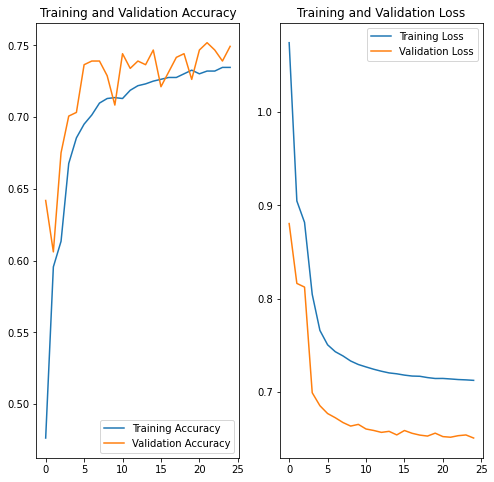

1/1 [==============================] - 1s 978ms/step
[[107   0   0  16]
 [118   0   4   1]
 [  0   0 122   1]
 [  0   0   0 123]]
{'HSIL': {'precision': 0.47555555555555556, 'recall': 0.8699186991869918, 'f1-score': 0.6149425287356323, 'support': 123}, 'LSIL': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'NILM': {'precision': 0.9682539682539683, 'recall': 0.991869918699187, 'f1-score': 0.9799196787148594, 'support': 123}, 'SCC': {'precision': 0.8723404255319149, 'recall': 1.0, 'f1-score': 0.9318181818181819, 'support': 123}, 'accuracy': 0.7154471544715447, 'macro avg': {'precision': 0.5790374873353596, 'recall': 0.7154471544715447, 'f1-score': 0.6316700973171684, 'support': 492}, 'weighted avg': {'precision': 0.5790374873353596, 'recall': 0.7154471544715447, 'f1-score': 0.6316700973171684, 'support': 492}}


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

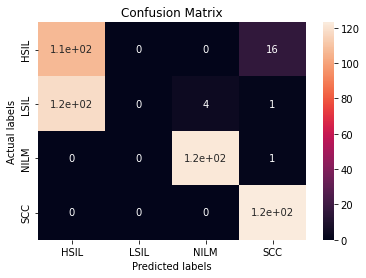

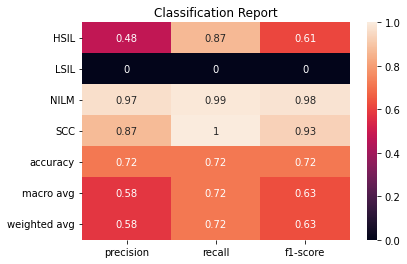

Epoch 1/25
98/98 [==============================] - 13s 63ms/step - loss: 1.4174 - accuracy: 0.2474 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 2/25
98/98 [==============================] - 4s 43ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 3/25
98/98 [==============================] - 4s 43ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 4/25
98/98 [==============================] - 4s 42ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 5/25
98/98 [==============================] - 4s 43ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 6/25
98/98 [==============================] - 4s 42ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 7/25
98/98 [==============================] - 4s 43ms/step - loss: 1.3863 - accuracy: 0.2557 - val_loss: 1.3863 - val_accuracy: 0.2276
Epoch 8/25
9

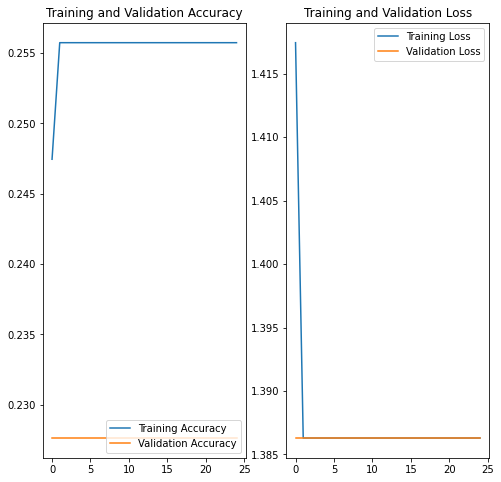

1/1 [==============================] - 2s 2s/step
[[123   0   0   0]
 [123   0   0   0]
 [123   0   0   0]
 [123   0   0   0]]
{'HSIL': {'precision': 0.25, 'recall': 1.0, 'f1-score': 0.4, 'support': 123}, 'LSIL': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'NILM': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'SCC': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'accuracy': 0.25, 'macro avg': {'precision': 0.0625, 'recall': 0.25, 'f1-score': 0.1, 'support': 492}, 'weighted avg': {'precision': 0.0625, 'recall': 0.25, 'f1-score': 0.1, 'support': 492}}


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

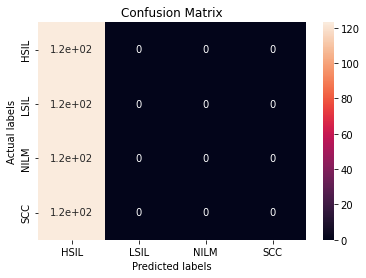

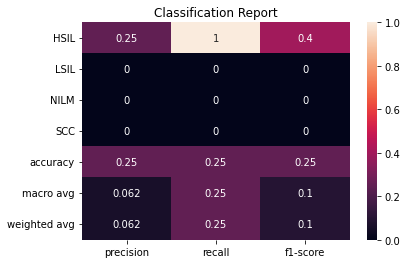

Epoch 1/25
98/98 [==============================] - 15s 88ms/step - loss: 0.9766 - accuracy: 0.4994 - val_loss: 0.6327 - val_accuracy: 0.6496
Epoch 2/25
98/98 [==============================] - 7s 67ms/step - loss: 0.5857 - accuracy: 0.6467 - val_loss: 0.5277 - val_accuracy: 0.6701
Epoch 3/25
98/98 [==============================] - 7s 67ms/step - loss: 0.5218 - accuracy: 0.6684 - val_loss: 0.5052 - val_accuracy: 0.6726
Epoch 4/25
98/98 [==============================] - 7s 67ms/step - loss: 0.5000 - accuracy: 0.6722 - val_loss: 0.4924 - val_accuracy: 0.6726
Epoch 5/25
98/98 [==============================] - 7s 67ms/step - loss: 0.4889 - accuracy: 0.6760 - val_loss: 0.4883 - val_accuracy: 0.6726
Epoch 6/25
98/98 [==============================] - 7s 67ms/step - loss: 0.4795 - accuracy: 0.6767 - val_loss: 0.4782 - val_accuracy: 0.6752
Epoch 7/25
98/98 [==============================] - 7s 67ms/step - loss: 0.4744 - accuracy: 0.6779 - val_loss: 0.4763 - val_accuracy: 0.6726
Epoch 8/25
9

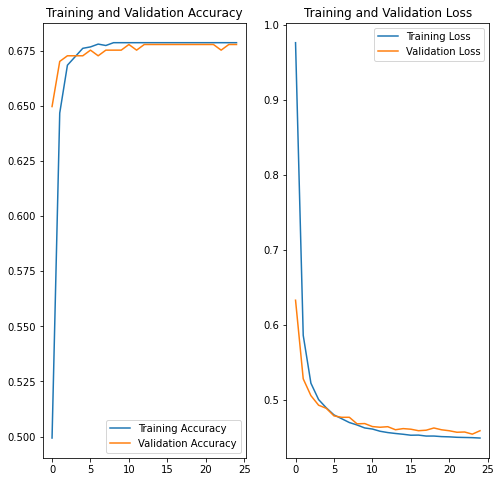

1/1 [==============================] - 2s 2s/step
[[120   0   0   3]
 [118   0   5   0]
 [  2   0 121   0]
 [ 34   0   8  81]]
{'HSIL': {'precision': 0.43795620437956206, 'recall': 0.975609756097561, 'f1-score': 0.6045340050377834, 'support': 123}, 'LSIL': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'NILM': {'precision': 0.9029850746268657, 'recall': 0.983739837398374, 'f1-score': 0.9416342412451362, 'support': 123}, 'SCC': {'precision': 0.9642857142857143, 'recall': 0.6585365853658537, 'f1-score': 0.782608695652174, 'support': 123}, 'accuracy': 0.6544715447154471, 'macro avg': {'precision': 0.5763067483230355, 'recall': 0.6544715447154472, 'f1-score': 0.5821942354837734, 'support': 492}, 'weighted avg': {'precision': 0.5763067483230354, 'recall': 0.6544715447154471, 'f1-score': 0.5821942354837734, 'support': 492}}


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

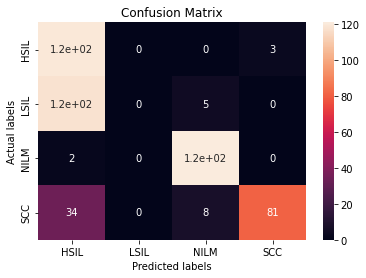

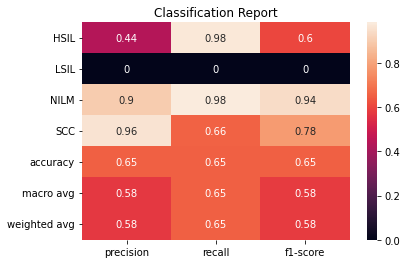

Epoch 1/25
98/98 [==============================] - 21s 124ms/step - loss: 1.2536 - accuracy: 0.3495 - val_loss: 1.1600 - val_accuracy: 0.3913
Epoch 2/25
98/98 [==============================] - 9s 94ms/step - loss: 1.1898 - accuracy: 0.3916 - val_loss: 1.1412 - val_accuracy: 0.3785
Epoch 3/25
98/98 [==============================] - 9s 94ms/step - loss: 1.1699 - accuracy: 0.4037 - val_loss: 1.1393 - val_accuracy: 0.4143
Epoch 4/25
98/98 [==============================] - 9s 94ms/step - loss: 1.1618 - accuracy: 0.4107 - val_loss: 1.1314 - val_accuracy: 0.4092
Epoch 5/25
98/98 [==============================] - 9s 94ms/step - loss: 1.1570 - accuracy: 0.4165 - val_loss: 1.1285 - val_accuracy: 0.4092
Epoch 6/25
98/98 [==============================] - 9s 94ms/step - loss: 1.1547 - accuracy: 0.4145 - val_loss: 1.1263 - val_accuracy: 0.4118
Epoch 7/25
98/98 [==============================] - 9s 94ms/step - loss: 1.1518 - accuracy: 0.4171 - val_loss: 1.1297 - val_accuracy: 0.3836
Epoch 8/25


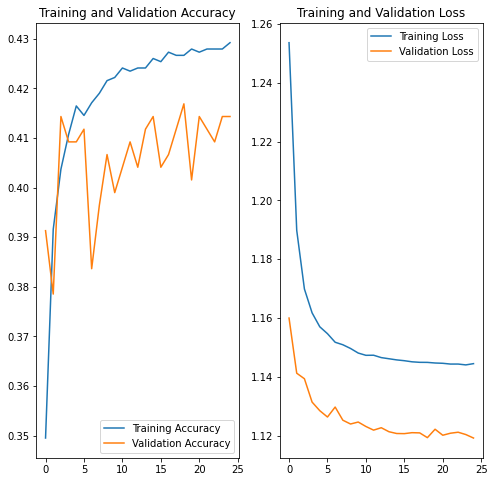

1/1 [==============================] - 3s 3s/step
[[117   0   0   6]
 [123   0   0   0]
 [122   0   0   1]
 [ 36   0   0  87]]
{'HSIL': {'precision': 0.29396984924623115, 'recall': 0.9512195121951219, 'f1-score': 0.4491362763915546, 'support': 123}, 'LSIL': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'NILM': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 123}, 'SCC': {'precision': 0.925531914893617, 'recall': 0.7073170731707317, 'f1-score': 0.8018433179723502, 'support': 123}, 'accuracy': 0.4146341463414634, 'macro avg': {'precision': 0.304875441034962, 'recall': 0.4146341463414634, 'f1-score': 0.3127448985909762, 'support': 492}, 'weighted avg': {'precision': 0.304875441034962, 'recall': 0.4146341463414634, 'f1-score': 0.3127448985909762, 'support': 492}}


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

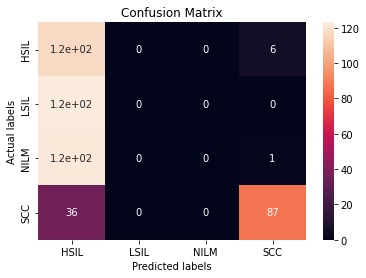

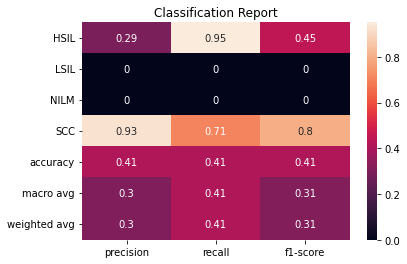

Epoch 1/25
98/98 [==============================] - 12s 52ms/step - loss: 0.9909 - accuracy: 0.5593 - val_loss: 0.6606 - val_accuracy: 0.7008
Epoch 2/25
98/98 [==============================] - 3s 33ms/step - loss: 0.5453 - accuracy: 0.7819 - val_loss: 0.2401 - val_accuracy: 0.9309
Epoch 3/25
98/98 [==============================] - 3s 33ms/step - loss: 0.2586 - accuracy: 0.9324 - val_loss: 0.1791 - val_accuracy: 0.9463
Epoch 4/25
98/98 [==============================] - 3s 33ms/step - loss: 0.2015 - accuracy: 0.9439 - val_loss: 0.1377 - val_accuracy: 0.9616
Epoch 5/25
98/98 [==============================] - 3s 32ms/step - loss: 0.1671 - accuracy: 0.9585 - val_loss: 0.1285 - val_accuracy: 0.9565
Epoch 6/25
98/98 [==============================] - 3s 33ms/step - loss: 0.1392 - accuracy: 0.9668 - val_loss: 0.1109 - val_accuracy: 0.9642
Epoch 7/25
98/98 [==============================] - 3s 33ms/step - loss: 0.1281 - accuracy: 0.9662 - val_loss: 0.0932 - val_accuracy: 0.9693
Epoch 8/25
9

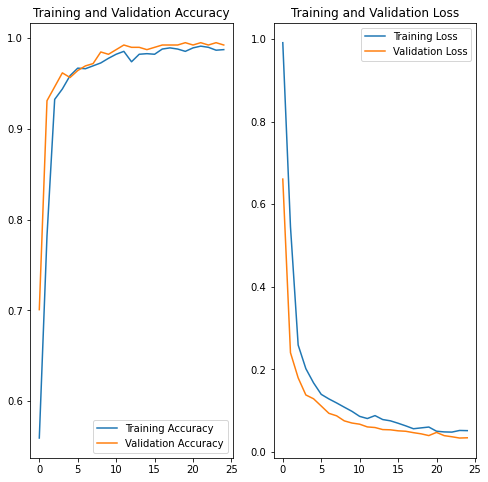

1/1 [==============================] - 2s 2s/step
[[121   0   0   2]
 [  0 123   0   0]
 [  1   0 122   0]
 [ 13   0   0 110]]
{'HSIL': {'precision': 0.8962962962962963, 'recall': 0.983739837398374, 'f1-score': 0.937984496124031, 'support': 123}, 'LSIL': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 123}, 'NILM': {'precision': 1.0, 'recall': 0.991869918699187, 'f1-score': 0.9959183673469388, 'support': 123}, 'SCC': {'precision': 0.9821428571428571, 'recall': 0.8943089430894309, 'f1-score': 0.9361702127659575, 'support': 123}, 'accuracy': 0.967479674796748, 'macro avg': {'precision': 0.9696097883597884, 'recall': 0.967479674796748, 'f1-score': 0.9675182690592318, 'support': 492}, 'weighted avg': {'precision': 0.9696097883597883, 'recall': 0.967479674796748, 'f1-score': 0.9675182690592319, 'support': 492}}


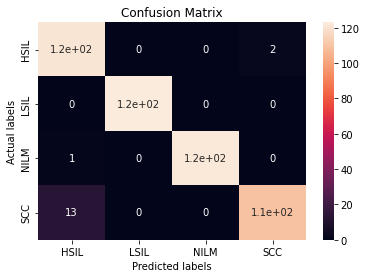

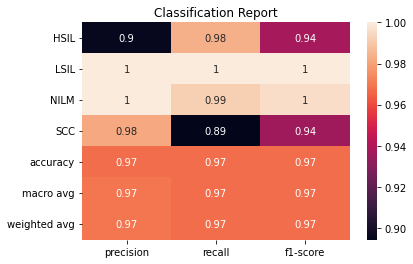

[0.7154471544715447, 0.25, 0.6544715447154471, 0.4146341463414634, 0.967479674796748]
1/1 [==============================] - 0s 72ms/step
[0, 0, 0, 2, 2, 3, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 3, 2, 0, 0, 0, 0, 0, 0, 0, 0, 3, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 3, 2, 2, 0, 0, 2, 0, 3, 0, 0, 2, 3, 0, 2, 3, 3, 2, 0, 3, 0, 3, 0, 2, 0, 0, 2, 0, 3, 0, 0, 3, 0, 3, 2, 0, 0, 0, 3, 2, 0, 2, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 3, 0, 0, 0, 3, 0, 3, 2, 0, 0, 2, 2, 0, 0, 0, 0, 2, 2, 3, 3, 0, 0, 0, 0, 0, 0, 2, 0, 3, 0, 0, 0, 0, 0, 0, 3, 0, 3, 0, 2, 0, 2, 0, 2, 0, 2, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 3, 0, 2, 2, 0, 3, 0, 0, 0, 3, 3, 0, 2, 0, 0, 0, 0, 3, 0, 3, 0, 2, 2, 0, 0, 0, 2, 0, 3, 0, 0, 0, 0, 3, 2, 2, 3, 0, 0, 3, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 3, 3, 0, 0, 2, 0, 3, 3, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 2, 3, 0, 2, 0, 0, 0, 0, 3, 2, 3, 0, 0, 2, 3, 0, 0, 0, 3, 0, 0, 2, 3, 0, 0, 2, 0, 3, 3, 0, 3, 0, 2, 0, 0, 0, 0, 3, 3, 0, 0, 2, 0, 0, 0, 0, 

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

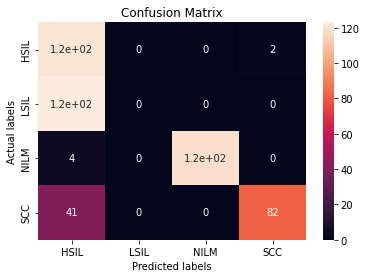

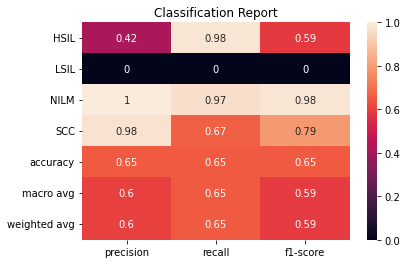

[0.6544715447154471]


In [ ]:
#testing for 5 run averages of all pretrained transfer and ensemble
names = ['ResNet50', 'DenseNet121', 'ResNet101', 'ResNet152', 'EfficientNetB0']
labels = ['HSIL','LSIL', 'NILM', 'SCC']
epoch = 25 
model_dictionary = {m[0]:m[1] for m in inspect.getmembers(tf.keras.applications, inspect.isfunction)}

for i in range(5):
# model_name = names[3]
  acc_ls = []
  modells = []
  ensembleACC = []
  for model_name in names:
    PT_model = model_dictionary[model_name]
    history_PT, model_PT = pretrained(train, epoch, val, PT_model)
    plot_AccVal(history_PT, epoch, True)
    test_pred, test_labels = getpredlabel(test, model_PT)
    acc, cm = PlotPerformance(test_labels, test_pred, labels)
    acc_ls.append(acc)
    modells.append(model_PT)
  print(acc_ls)
  test_pred_vote, test_labels = ensemble(modells, test, True)
  print("ENSEMBLE")
  acc2, cm  = PlotPerformance(test_labels, test_pred_vote, labels)
  ensembleACC.append(acc2)
print(ensembleACC)

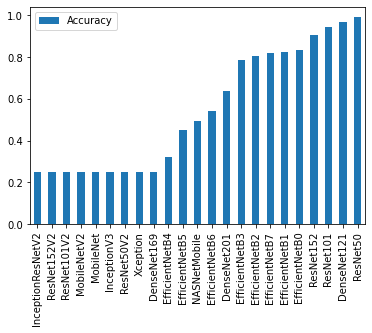

23


In [ ]:
Plot graph of all pretrained transfer model accuracy
models2 = {'DenseNet121': 0.9654471544715447, 'DenseNet169': 0.25, 'DenseNet201': 0.6382113821138211, 'EfficientNetB0': 0.8313008130081301, 'EfficientNetB1': 0.8233333333333334, 'EfficientNetB2': 0.806910569105691, 'EfficientNetB3': 0.7865853658536586, 'EfficientNetB4': 0.31910569105691056, 'EfficientNetB5': 0.45121951219512196, 'EfficientNetB6': 0.5426829268292683, 'EfficientNetB7': 0.8191056910569106, 'InceptionResNetV2': 0.25, 'InceptionV3': 0.25, 'MobileNet': 0.25, 'MobileNetV2': 0.25, 'NASNetMobile': 0.491869918699187, 'ResNet101': 0.9451219512195121, 'ResNet101V2': 0.25, 'ResNet152': 0.49390243902439024, 'ResNet152V2': 0.25, 'ResNet50': 0.991869918699187, 'ResNet50V2': 0.25, 'Xception': 0.25, 'ResNet152': 0.9065040650406504}
plotTransferAcc(models2)  
print(len(models2))

### Run Ensemble

[0.991869918699187, 0.9654471544715447, 0.9451219512195121, 0.8333333333333334, 0.8313008130081301]
['ResNet50', 'DenseNet121', 'ResNet101', 'EfficientNetB1', 'EfficientNetB0']
1/1 [==============================] - 1s 1s/step
[0, 1, 1, 2, 2, 3, 0, 1, 1, 3, 3, 3, 1, 0, 1, 1, 0, 0, 2, 1, 3, 2, 0, 1, 1, 1, 1, 3, 1, 0, 3, 2, 3, 1, 1, 1, 0, 0, 3, 0, 2, 1, 0, 2, 2, 3, 2, 2, 3, 0, 2, 0, 3, 1, 1, 2, 3, 0, 2, 3, 3, 2, 0, 3, 1, 3, 3, 2, 1, 1, 2, 0, 3, 3, 0, 3, 1, 3, 2, 1, 1, 3, 3, 2, 3, 2, 2, 0, 1, 1, 2, 1, 0, 2, 0, 1, 2, 0, 2, 0, 3, 0, 3, 1, 3, 3, 3, 0, 3, 2, 1, 0, 2, 2, 0, 1, 0, 3, 2, 2, 3, 3, 1, 3, 1, 1, 0, 1, 2, 3, 3, 3, 0, 0, 0, 0, 1, 3, 1, 3, 1, 2, 0, 2, 1, 2, 1, 2, 0, 3, 2, 2, 0, 0, 2, 1, 0, 1, 3, 0, 2, 2, 1, 3, 0, 0, 1, 3, 3, 3, 2, 1, 0, 0, 1, 3, 1, 3, 3, 2, 2, 1, 1, 0, 2, 0, 3, 1, 1, 0, 1, 3, 2, 2, 3, 1, 0, 3, 1, 2, 3, 0, 0, 0, 2, 1, 1, 2, 1, 3, 3, 0, 3, 2, 1, 3, 3, 0, 0, 2, 1, 2, 0, 2, 3, 2, 0, 0, 0, 3, 1, 2, 0, 1, 2, 2, 2, 1, 1, 1, 1, 2, 3, 0, 2, 1, 0, 3, 0, 3, 2, 3, 1, 1, 2, 3, 3, 0

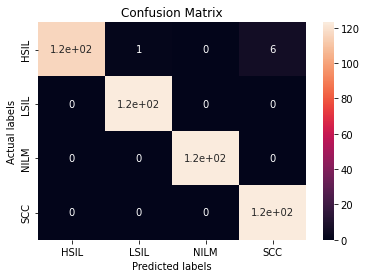

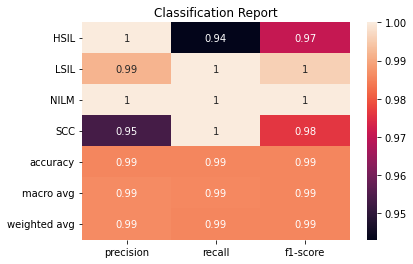

0.9857723577235772

In [ ]:
# run ensemble on transfer models
labels = ['HSIL', 'LSIL', 'NILM', 'SCC']

            'ResNet50V2': 0.25, 'Xception': 0.25, 'DenseNet121': 0.9654471544715447, 'ResNet101': 0.9451219512195121}
accdict = {'DenseNet121': 0.9654471544715447, 'DenseNet169': 0.25, 'DenseNet201': 0.6382113821138211, 'EfficientNetB0': 0.8313008130081301, 'EfficientNetB1': 0.8233333333333334,
           'EfficientNetB2': 0.806910569105691, 'EfficientNetB3': 0.7865853658536586, 'EfficientNetB4': 0.31910569105691056, 'EfficientNetB5': 0.45121951219512196, 
           'EfficientNetB6': 0.5426829268292683, 'EfficientNetB7': 0.8191056910569106, 'InceptionResNetV2': 0.25, 'InceptionV3': 0.25, 'MobileNet': 0.25, 'MobileNetV2': 0.25, 
           'NASNetMobile': 0.491869918699187, 'ResNet101': 0.9451219512195121, 'ResNet101V2': 0.25, 'ResNet152': 0.49390243902439024, 'ResNet152V2': 0.25, 'ResNet50': 0.991869918699187, 
           'ResNet50V2': 0.25, 'Xception': 0.25, 'ResNet152': 0.9065040650406504}

key_list = list(accdict.keys())
val_list = list(accdict.values())
zipped_lists = zip(val_list, key_list)
sorted_pairs = sorted(zipped_lists, reverse=True)
tuples = zip(*sorted_pairs)
val_list, key_list = [ list(tuple) for tuple in  tuples]

top5model = key_list[0:5]
print(top5model)
test_pred_vote, test_labels = ensemble(top5model, test, False)
PlotPerformance(test_labels, test_pred_vote, labels)

### Run AE + CNN

In [ ]:
###RUN AE + CNN
epoch = 100
labels = ['HSIL','LSIL', 'NILM', 'SCC']

train_img, train_label = extract_img(train)
val_img, val_label = extract_img(val)
test_img, test_label = extract_img(test)

start = time.time()
history_DN, autoencoder = runAE (train_img, train_img, val_img, val_img, epoch)
end = time.time()
print("runtime_encoder: {}".format(end-start))
autoencoder.summary()
autoencoder.encoder.summary()

train_AE = autoencoder.encoder.predict(train_img)
val_AE = autoencoder.encoder.predict(val_img)
test_AE = autoencoder.encoder.predict(test_img)
train2 = [train_AE.reshape(-1, 56, 56, 3),train_label]
test2 = [test_AE.reshape(-1, 56, 56, 3),test_label]

val2 = [val_AE.reshape(-1, 56, 56, 3),val_label]
ep = 375
start = time.time()
historyCnn, modelCnn = basicCNN2(train2, ep, val2)
end = time.time()
print("runtime cnn: {}".format(end-start))
plot_AccVal(historyCnn, ep, True)
pred = modelCnn.predict(test2[0],verbose=1)
test_pred=np.argmax(pred,axis=1)

acc, cm = PlotPerformance(test_label, test_pred, labels)



(16, 224, 224, 3)
<class 'tensorflow.python.framework.ops.EagerTensor'>
(1568, 224, 224, 3)
(16,)
(1568,)
(7, 224, 224, 3)
<class 'tensorflow.python.framework.ops.EagerTensor'>
(391, 224, 224, 3)
(7,)
(391,)
(492, 224, 224, 3)
<class 'tensorflow.python.framework.ops.EagerTensor'>
(492, 224, 224, 3)
(492,)
(492,)
Epoch 1/100
98/98 [==============================] - 7s 63ms/step - loss: 0.0447 - val_loss: 0.0386
Epoch 2/100
98/98 [==============================] - 6s 59ms/step - loss: 0.0299 - val_loss: 0.0242
Epoch 3/100
98/98 [==============================] - 6s 59ms/step - loss: 0.0221 - val_loss: 0.0213
Epoch 4/100
98/98 [==============================] - 6s 61ms/step - loss: 0.0203 - val_loss: 0.0200
Epoch 5/100
98/98 [==============================] - 6s 59ms/step - loss: 0.0189 - val_loss: 0.0185
Epoch 6/100
98/98 [==============================] - 6s 59ms/step - loss: 0.0171 - val_loss: 0.0164
Epoch 7/100
98/98 [==============================] - 6s 59ms/step - loss: 0.0146 - val

TypeError: ignored

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_5 (Rescaling)     (None, 56, 56, 3)         0         
                                                                 
 conv2d_8 (Conv2D)           (None, 28, 28, 32)        896       
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 14, 14, 32)       0         
 2D)                                                             
                                                                 
 dropout (Dropout)           (None, 14, 14, 32)        0         
                                                                 
 conv2d_9 (Conv2D)           (None, 7, 7, 16)          4624      
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 3, 3, 16)         0         
 2D)                                                 

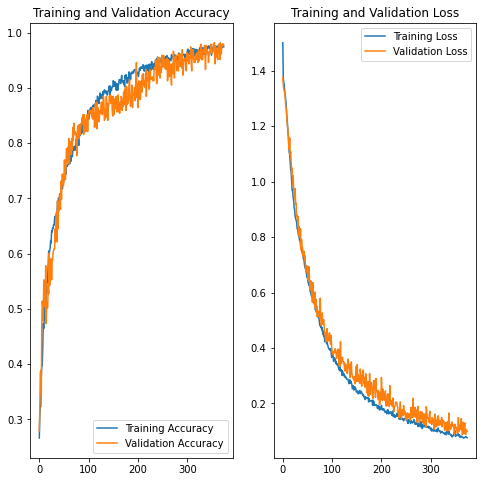

16/16 [==============================] - 0s 2ms/step
[[102   0   0  21]
 [  0 123   0   0]
 [  0   2 121   0]
 [  2   0   0 121]]
{'HSIL': {'precision': 0.9807692307692307, 'recall': 0.8292682926829268, 'f1-score': 0.8986784140969163, 'support': 123}, 'LSIL': {'precision': 0.984, 'recall': 1.0, 'f1-score': 0.9919354838709677, 'support': 123}, 'NILM': {'precision': 1.0, 'recall': 0.983739837398374, 'f1-score': 0.9918032786885246, 'support': 123}, 'SCC': {'precision': 0.852112676056338, 'recall': 0.983739837398374, 'f1-score': 0.9132075471698112, 'support': 123}, 'accuracy': 0.9491869918699187, 'macro avg': {'precision': 0.9542204767063922, 'recall': 0.9491869918699187, 'f1-score': 0.948906180956555, 'support': 492}, 'weighted avg': {'precision': 0.9542204767063921, 'recall': 0.9491869918699187, 'f1-score': 0.948906180956555, 'support': 492}}


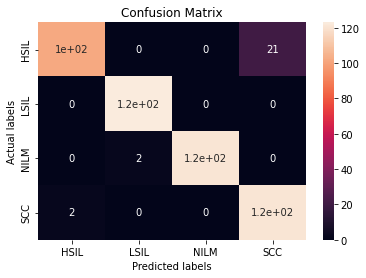

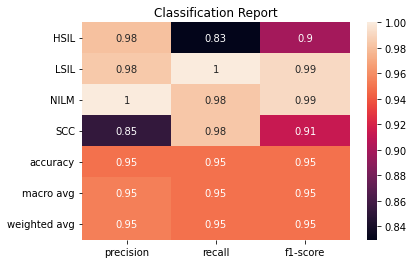

ValueError: ignored

In [ ]:
ep = 375
start = time.time()
historyCnn, modelCnn = basicCNN2(train2, ep, val2)
end = time.time()
print("runtime cnn: {}".format(end-start))
plot_AccVal(historyCnn, ep, True)
pred = modelCnn.predict(test2[0],verbose=1)
test_pred=np.argmax(pred,axis=1)

acc, cm = PlotPerformance(test_label, test_pred, labels)

In [ ]:
# Save Models
f1 = '/content/drive/MyDrive/Pap ML Project (Shared Drive)/saved models AUG2/AECNN_97_AE_augdata.h5'
autoencoder.encoder.save(f1) 
f2 = '/content/drive/MyDrive/Pap ML Project (Shared Drive)/saved models AUG2/AECNN_97_CNN_augdata.h5'
modelCnn.save(f2) 